In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy.stats import chi2_contingency


from sklearn.metrics import confusion_matrix, classification_report, plot_precision_recall_curve
from sklearn.metrics import plot_confusion_matrix,roc_curve, roc_auc_score,precision_recall_curve,accuracy_score,f1_score


from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score, train_test_split, KFold



from sklearn.preprocessing import StandardScaler



from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC


from sklearn.feature_selection import RFE,SelectFromModel
from mlxtend.feature_selection import SequentialFeatureSelector as sfs


import warnings
warnings.filterwarnings('ignore')
warnings.warn("this will not show")
pd.options.display.max_columns = None 
pd.options.display.max_rows = None
sns.set(style='darkgrid')
%matplotlib inline

In [2]:
data = pd.read_csv('diabetic_data.csv')

In [3]:
data.shape

(101766, 50)

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

In [5]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
encounter_id,101766.0,1.652016e+08,1.026403e+08,12522.0,84961194.0,152388987.0,2.302709e+08,443867222.0
patient_nbr,101766.0,5.433040e+07,3.869636e+07,135.0,23413221.0,45505143.0,8.754595e+07,189502619.0
admission_type_id,101766.0,2.024006e+00,1.445403e+00,1.0,1.0,1.0,3.000000e+00,8.0
discharge_disposition_id,101766.0,3.715642e+00,5.280166e+00,1.0,1.0,1.0,4.000000e+00,28.0
admission_source_id,101766.0,5.754437e+00,4.064081e+00,1.0,1.0,7.0,7.000000e+00,25.0
time_in_hospital,101766.0,4.395987e+00,2.985108e+00,1.0,2.0,4.0,6.000000e+00,14.0
num_lab_procedures,101766.0,4.309564e+01,1.967436e+01,1.0,31.0,44.0,5.700000e+01,132.0
num_procedures,101766.0,1.339730e+00,1.705807e+00,0.0,0.0,1.0,2.000000e+00,6.0
num_medications,101766.0,1.602184e+01,8.127566e+00,1.0,10.0,15.0,2.000000e+01,81.0
number_outpatient,101766.0,3.693572e-01,1.267265e+00,0.0,0.0,0.0,0.000000e+00,42.0


In [6]:
data.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,?,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,?,?,1,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,?,?,59,0,18,0,0,0,276,250.01,255,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,?,?,11,5,13,2,0,1,648,250,V27,6,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,?,?,44,1,16,0,0,0,8,250.43,403,7,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,?,?,51,0,8,0,0,0,197,157,250,5,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO


# Working With the Numerical Data

In [7]:
# identifying the numerical and categorical features of the dataset

In [5]:
numerical_df = data.select_dtypes(include=np.number)

In [6]:
numerical_df.head()

,encounter_id,patient_nbr,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
0,2278392,8222157,6,25,1,1,41,0,1,0,0,0,1
1,149190,55629189,1,1,7,3,59,0,18,0,0,0,9
2,64410,86047875,1,1,7,2,11,5,13,2,0,1,6
3,500364,82442376,1,1,7,2,44,1,16,0,0,0,7
4,16680,42519267,1,1,7,1,51,0,8,0,0,0,5


In [10]:
# finding columns that have full unique values.. and removing it..

In [7]:
unique_columns = []
for col in numerical_df.columns:
    if len(data)==data[col].nunique():
        unique_columns.append(col)

In [8]:
unique_columns

['encounter_id']

In [9]:
numerical_df = numerical_df.drop(columns=unique_columns)

In [10]:
numerical_df.head()

,patient_nbr,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
0,8222157,6,25,1,1,41,0,1,0,0,0,1
1,55629189,1,1,7,3,59,0,18,0,0,0,9
2,86047875,1,1,7,2,11,5,13,2,0,1,6
3,82442376,1,1,7,2,44,1,16,0,0,0,7
4,42519267,1,1,7,1,51,0,8,0,0,0,5


In [15]:
# finding if there are any missing values in the numerical part of the data..

In [16]:
numerical_df.isnull().sum()

patient_nbr                 0
admission_type_id           0
discharge_disposition_id    0
admission_source_id         0
time_in_hospital            0
num_lab_procedures          0
num_procedures              0
num_medications             0
number_outpatient           0
number_emergency            0
number_inpatient            0
number_diagnoses            0
dtype: int64

In [17]:
# by the definition of the dataset 'admission_type_id' 'discharge_disposition_id' and 'admission_source_id'
# are categorical variables..

In [11]:
numerical_df = numerical_df.drop(columns=['admission_type_id','discharge_disposition_id'
                                                                           ,'admission_source_id'])

In [12]:
numerical_df['patient_nbr'].nunique()

71518

In [13]:
numerical_df_with_target = numerical_df.copy(deep=True)

In [14]:
numerical_df_with_target['readmitted'] = data['readmitted']

In [15]:
numerical_df_with_target.head()

,patient_nbr,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,readmitted
0,8222157,1,41,0,1,0,0,0,1,NO
1,55629189,3,59,0,18,0,0,0,9,>30
2,86047875,2,11,5,13,2,0,1,6,NO
3,82442376,2,44,1,16,0,0,0,7,NO
4,42519267,1,51,0,8,0,0,0,5,NO


In [16]:
data['admission_type_id'] = data['admission_type_id'].astype('object')

In [17]:
data['admission_source_id'] = data['admission_source_id'].astype('object')

In [18]:
data['discharge_disposition_id'] = data['discharge_disposition_id'].astype('object')

# Working with the categorical data

In [26]:
# finding the meaningless entities in the categorical part of the data..

In [19]:
categorical_df = data.select_dtypes(exclude=np.number)

In [20]:
categorical_df.head(10)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,payer_code,medical_specialty,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,Caucasian,Female,[0-10),?,6,25,1,?,Pediatrics-Endocrinology,250.83,?,?,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
1,Caucasian,Female,[10-20),?,1,1,7,?,?,276,250.01,255,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
2,AfricanAmerican,Female,[20-30),?,1,1,7,?,?,648,250,V27,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO
3,Caucasian,Male,[30-40),?,1,1,7,?,?,8,250.43,403,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
4,Caucasian,Male,[40-50),?,1,1,7,?,?,197,157,250,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
5,Caucasian,Male,[50-60),?,2,1,2,?,?,414,411,250,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,>30
6,Caucasian,Male,[60-70),?,3,1,2,?,?,414,411,V45,None,None,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
7,Caucasian,Male,[70-80),?,1,1,7,?,?,428,492,250,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
8,Caucasian,Female,[80-90),?,2,1,4,?,?,398,427,38,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
9,Caucasian,Female,[90-100),?,3,3,4,?,InternalMedicine,434,198,486,None,None,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [21]:
for col in categorical_df.columns:
    print('========'*2,col.upper(),'========'*2)
    print(categorical_df[col].nunique())
    print('----------------------------')
    print(categorical_df[col].value_counts())
    print('--'*20)

================ RACE ================
6
----------------------------
Caucasian          76099
AfricanAmerican    19210
?                   2273
Hispanic            2037
Other               1506
Asian                641
Name: race, dtype: int64
----------------------------------------
================ GENDER ================
3
----------------------------
Female             54708
Male               47055
Unknown/Invalid        3
Name: gender, dtype: int64
----------------------------------------
================ AGE ================
10
----------------------------
[70-80)     26068
[60-70)     22483
[50-60)     17256
[80-90)     17197
[40-50)      9685
[30-40)      3775
[90-100)     2793
[20-30)      1657
[10-20)       691
[0-10)        161
Name: age, dtype: int64
----------------------------------------
================ WEIGHT ================
10
----------------------------
?            98569
[75-100)      1336
[50-75)        897
[100-125)      625
[125-150)      145
[25-50)         

Name: diag_3, dtype: int64
----------------------------------------
================ MAX_GLU_SERUM ================
4
----------------------------
None    96420
Norm     2597
>200     1485
>300     1264
Name: max_glu_serum, dtype: int64
----------------------------------------
================ A1CRESULT ================
4
----------------------------
None    84748
>8       8216
Norm     4990
>7       3812
Name: A1Cresult, dtype: int64
----------------------------------------
================ METFORMIN ================
4
----------------------------
No        81778
Steady    18346
Up         1067
Down        575
Name: metformin, dtype: int64
----------------------------------------
================ REPAGLINIDE ================
4
----------------------------
No        100227
Steady      1384
Up           110
Down          45
Name: repaglinide, dtype: int64
----------------------------------------
================ NATEGLINIDE ================
4
----------------------------
No        10106

# OBSERVATIONS:

In [30]:
# 'admission_type_id' 'discharge_disposition_id' and 'admission_source_id' are numerically encoded.

# There is '?' in features like race, weight, payer_code, Medical_speciality,diag_1,diag_2 and diag_3.

# gender has 3 invalid/unknown entries.

# diag1,diag2 and diag3 have numerical entries combined with characters..

# max_glu_serum and A1Cresult has 'none' for majority of entries..

# examide and citoglipton No:101766

# metformin-pioglitazone, glimepiride-pioglitazone, acetohexamide No:101765 steady:1

# metformin-rosiglitazone No:101764 steady:2

# troglitazone No:101763 steady:3

# glipizide-metformin  No:101753 steady:13

# CONCLUSION: 

In [31]:
# Imputing with string values in numerically encoded columns 'discharge_disposition_id' and 'admission_source_id'..

# Here there is '?' in features like race, weight, payer_code, Medical_speciality,diag_1,diag_2 and diag_3 

# which does'nt give any meaning hence we can replace them with nan

# gender has 3 invalid/unknown entries WHICH CAN BE REPLACED WITH NAN

# examide and citoglipton has No:101766... when no one was administered with these drugs they can be removed from the features..


# FEATURE ENGINEERING

In [22]:
def admission_type_func(value):
    admission_type_description = {1:'Emergency',2:'Urgent',3:'Elective',4:'Newborn',7:'Trauma Center'}
    if value not in admission_type_description.keys():
        return 'Other'
    else:
        return admission_type_description[value]

In [23]:
 def discharge_disposition_func(value):
    if (value == 11) or (value >= 19 and value <= 21):
        return 'Expired'
    elif value == 7:
        return 'left AMA'
    elif (value == 9) or (value == 12):
        return 'In/Still/Outpatient'
    elif value == 13 or value == 14:
        return 'Hospice'
    elif value in[1,6,8]:
        return 'Discharged Home'
    elif value in [2,3,4,5,10,16,17,22,23,24,27,28,29,30]:
        return 'Transferred/Referred'
    elif value == 15:
        return 'Transferred Within'
    
    return 'Other'

In [24]:
def admission_source_func(value):
    if value in [1,2,3]:
        return 'Referral'
    elif value in [4,5,6,10,18,22,25,26]:
        return 'Transfer'
    elif value == 7:
        return 'Emergency Room'
    elif (value == 8):
        return 'Law Enforcement'
    elif value in [11,12,13,14,19,23,24]:
        if value == 11:
            return 'Normal Delivery'
        elif value == 12:
            return 'Premature Delivery'
        elif value == 13:
            return 'Sick Baby'
        elif value == 14:
            return 'Extramural Birth'
        elif value == 19:
            return 'Readmission'
        elif value == 23:
            return 'Born In This Hospital'
        elif value == 24:
            return 'Born Elsewhere'

    return 'Other'

In [25]:
def transform_category_func(value):
    category = 'other'
    if value in [np.nan]:
        return np.nan
    elif '250.' in value:
        return 'Diabetes'
    else:
        if value.isdecimal():
            value = float(value)
            if value>=390 and value<=459 or value==785:
                category = 'Circulatory'
            elif value>=460 and value<=519 or value==786:
                category = 'Respiratory'
            elif value>=520 and value<=579 or value==787:
                category = 'Digestive'
            elif value==250:
                category = 'Diabetes'
            elif value>=800 and value<=999:
                category = 'Injury'          
            elif value>=710 and value<=739:
                category = 'Musculoskeletal'   
            elif value>=580 and value<=629 or value==788:
                category = 'Genitourinary'
            elif value>=140 and value<=239 :
                category = 'Neoplasms'
    
    return category

In [26]:
def categorize_patient_frequency_func(value):
    if value==1:
        return '1-time'
    elif (value > 1) and (value <= 5):
        return '2-5 times'
    elif (value > 5) and (value <= 10):
        return '6-10 times'
    return 'more than 10 times'

In [27]:
categorical_df = categorical_df.replace({'?':np.nan,'Unknown/Invalid':np.nan})

In [28]:
categorical_df.head()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,payer_code,medical_specialty,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,Caucasian,Female,[0-10),NaN,6,25,1,NaN,Pediatrics-Endocrinology,250.83,NaN,NaN,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
1,Caucasian,Female,[10-20),NaN,1,1,7,NaN,NaN,276,250.01,255,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
2,AfricanAmerican,Female,[20-30),NaN,1,1,7,NaN,NaN,648,250,V27,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO
3,Caucasian,Male,[30-40),NaN,1,1,7,NaN,NaN,8,250.43,403,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
4,Caucasian,Male,[40-50),NaN,1,1,7,NaN,NaN,197,157,250,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [39]:
categorical_df.shape

(101766, 40)

In [29]:
categorical_df = categorical_df.drop(columns=['examide','citoglipton'])

In [41]:
categorical_df.shape

(101766, 38)

In [42]:
100*(categorical_df.isnull().sum()/len(categorical_df)).sort_values(ascending=False)

weight                      96.858479
medical_specialty           49.082208
payer_code                  39.557416
race                         2.233555
diag_3                       1.398306
diag_2                       0.351787
diag_1                       0.020636
gender                       0.002948
age                          0.000000
admission_type_id            0.000000
discharge_disposition_id     0.000000
admission_source_id          0.000000
diabetesMed                  0.000000
max_glu_serum                0.000000
A1Cresult                    0.000000
metformin                    0.000000
repaglinide                  0.000000
nateglinide                  0.000000
chlorpropamide               0.000000
readmitted                   0.000000
acetohexamide                0.000000
glipizide                    0.000000
change                       0.000000
metformin-pioglitazone       0.000000
metformin-rosiglitazone      0.000000
glimepiride-pioglitazone     0.000000
glipizide-me

In [43]:
# the weight of many patients is not provided therefore the column can be dropped..

# the patient's response to the medication and the probability of re-admission does'nt depend on the payer_code..
# i.e if he pays by himself or he takes money from some health insurance or bank..

# All the doctors irrespective of their speciality can administer the drugs for diabetes..which will not have any effect on 
# the patient's re-admission rate..

In [30]:
categorical_df = categorical_df.drop(columns=['weight','payer_code','medical_specialty'])

In [31]:
categorical_df['admission_type_id'] = categorical_df['admission_type_id'].apply(admission_type_func)

In [32]:
categorical_df['admission_source_id'] = categorical_df['admission_source_id'].apply(admission_source_func)

In [33]:
categorical_df['discharge_disposition_id'] = categorical_df['discharge_disposition_id'].apply(discharge_disposition_func)

In [34]:
categorical_df['diag_1'] = categorical_df['diag_1'].apply(transform_category_func)

In [35]:
categorical_df['diag_2'] = categorical_df['diag_2'].apply(transform_category_func)

In [36]:
categorical_df['diag_3'] = categorical_df['diag_3'].apply(transform_category_func)

In [37]:
categorical_df.head()

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,Caucasian,Female,[0-10),Other,Other,Referral,Diabetes,NaN,NaN,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
1,Caucasian,Female,[10-20),Emergency,Discharged Home,Emergency Room,other,Diabetes,other,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
2,AfricanAmerican,Female,[20-30),Emergency,Discharged Home,Emergency Room,other,Diabetes,other,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO
3,Caucasian,Male,[30-40),Emergency,Discharged Home,Emergency Room,other,Diabetes,Circulatory,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
4,Caucasian,Male,[40-50),Emergency,Discharged Home,Emergency Room,Neoplasms,Neoplasms,Diabetes,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [38]:
df = pd.concat([numerical_df,categorical_df],axis=1)

In [53]:
df.head()

,patient_nbr,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,8222157,1,41,0,1,0,0,0,1,Caucasian,Female,[0-10),Other,Other,Referral,Diabetes,NaN,NaN,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
1,55629189,3,59,0,18,0,0,0,9,Caucasian,Female,[10-20),Emergency,Discharged Home,Emergency Room,other,Diabetes,other,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
2,86047875,2,11,5,13,2,0,1,6,AfricanAmerican,Female,[20-30),Emergency,Discharged Home,Emergency Room,other,Diabetes,other,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO
3,82442376,2,44,1,16,0,0,0,7,Caucasian,Male,[30-40),Emergency,Discharged Home,Emergency Room,other,Diabetes,Circulatory,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
4,42519267,1,51,0,8,0,0,0,5,Caucasian,Male,[40-50),Emergency,Discharged Home,Emergency Room,Neoplasms,Neoplasms,Diabetes,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [39]:
df.dropna(subset=['gender'], how='all', inplace = True)

In [40]:
df.dropna(subset=['diag_1'], how='all', inplace = True)

In [41]:
df.isnull().sum().sort_values(ascending=False)

race                        2269
diag_3                      1422
diag_2                       357
patient_nbr                    0
troglitazone                   0
glipizide                      0
glyburide                      0
tolbutamide                    0
pioglitazone                   0
rosiglitazone                  0
acarbose                       0
miglitol                       0
tolazamide                     0
glimepiride                    0
insulin                        0
glyburide-metformin            0
glipizide-metformin            0
glimepiride-pioglitazone       0
metformin-rosiglitazone        0
metformin-pioglitazone         0
change                         0
diabetesMed                    0
acetohexamide                  0
nateglinide                    0
chlorpropamide                 0
time_in_hospital               0
num_lab_procedures             0
num_procedures                 0
num_medications                0
number_outpatient              0
number_eme

In [57]:
# Here we have dropped all the entries where diagnosis_1 have nan values... Since it should have diabetes or diabetes with
# some or the other side effect.. When a patient is not diagnosed with any disease in the first diagnosis then there is no
# meaning in going for the further diagnoses..

In [58]:
# There are certain entries where the second diagnosis is nan but the third diagnosis has some sort of disorder
# These may be wrong entries because once when the person is not diagnosed with any disorder he/she is unlikely to be 
# diagnosed with again..Hence we drop all those entries..

In [42]:
index_to_be_dropped = df[df['diag_2'].isnull() & df['diag_3'].notnull()].index

In [43]:
df.drop(index_to_be_dropped,inplace=True)

In [44]:
df.isnull().sum().sort_values(ascending=False)

race                        2263
diag_3                      1422
diag_2                       278
patient_nbr                    0
troglitazone                   0
glipizide                      0
glyburide                      0
tolbutamide                    0
pioglitazone                   0
rosiglitazone                  0
acarbose                       0
miglitol                       0
tolazamide                     0
glimepiride                    0
insulin                        0
glyburide-metformin            0
glipizide-metformin            0
glimepiride-pioglitazone       0
metformin-rosiglitazone        0
metformin-pioglitazone         0
change                         0
diabetesMed                    0
acetohexamide                  0
nateglinide                    0
chlorpropamide                 0
time_in_hospital               0
num_lab_procedures             0
num_procedures                 0
num_medications                0
number_outpatient              0
number_eme

In [62]:
df.shape

(101663, 44)

# SPLITTING DATA INTO DIABETIC AND NON-DIABETIC 

In [63]:
# Splitting the dataset into diabetic and non-diabetic patients since we have the drugs that are only used to dianose the 
# diabetic patients..Especially type 2..

In [45]:
df_diabetic = df[(df['diag_1']=='Diabetes') | (df['diag_2']=='Diabetes') | (df['diag_3']=='Diabetes')]

In [46]:
df_non_diabetic = df[(df['diag_1']!='Diabetes') & (df['diag_2']!='Diabetes') & (df['diag_3']!='Diabetes')]

In [47]:
df_non_diabetic['readmitted'] = df_non_diabetic['readmitted'].apply(lambda x:'No' if x=='NO' else 'Yes')

In [48]:
df_diabetic.shape

(37990, 44)

In [49]:
df_diabetic.to_csv('Diabetic_patients.csv')

### LIST OF ALL CATEGORICAL VARIABLES IN THE DATASET SEGREGATED AS DIFFERENT ASPECTS...

In [71]:
drugs_list = ['metformin','repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride','acetohexamide', 'glipizide',
              'glyburide', 'tolbutamide','pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
              'tolazamide', 'insulin', 'glyburide-metformin', 'glipizide-metformin','glimepiride-pioglitazone',
              'metformin-rosiglitazone','metformin-pioglitazone']
patient_formalities_list = ['admission_type_id','discharge_disposition_id','admission_source_id','patient_frequency_categorized']
patient_demographics_list = ['gender','age','race']
diagnosis_list = ['diag_1','diag_2','diag_3']
primary_tests_list = ['A1Cresult','max_glu_serum']
medication_changes_list = ['diabetesMed','change']

### LIST OF ALL CATEGORICAL VARIABLES IN THE DATASET SEGREGATED AS DIFFERENT ASPECTS...

In [72]:
number_of_visits = ['patient_frequency','number_outpatient','number_emergency','number_inpatient']
number_of_hospital_formalities = ['time_in_hospital','num_lab_procedures','num_procedures','num_medications','number_diagnoses']

# FEATURE EXTRACTION

In [73]:
patient_freq_tab = df_non_diabetic['patient_nbr'].value_counts()

In [74]:
df_non_diabetic['patient_frequency'] = df_non_diabetic['patient_nbr'].map(patient_freq_tab)

In [75]:
df_non_diabetic.head()

,patient_nbr,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,patient_frequency
6,84259809,4,70,1,21,0,0,0,7,Caucasian,Male,[60-70),Elective,Discharged Home,Referral,Circulatory,Circulatory,other,None,None,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,No,1
8,48330783,13,68,2,28,0,0,0,8,Caucasian,Female,[80-90),Urgent,Discharged Home,Transfer,Circulatory,Circulatory,other,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,No,1
9,63555939,12,33,3,18,0,0,0,8,Caucasian,Female,[90-100),Elective,Transferred/Referred,Transfer,Circulatory,Neoplasms,Respiratory,None,None,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,No,1
11,77391171,7,62,0,11,0,0,0,7,AfricanAmerican,Male,[60-70),Urgent,Discharged Home,Transfer,Neoplasms,other,Neoplasms,None,None,No,No,No,No,No,No,No,Up,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,Yes,1
13,77586282,10,55,1,31,0,0,0,8,Caucasian,Male,[80-90),Emergency,Discharged Home,Emergency Room,Circulatory,Circulatory,Circulatory,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,No,1


In [76]:
list_of_cols = list(df_non_diabetic.columns)

In [78]:
list_of_cols = [list_of_cols.pop()] + list_of_cols

In [79]:
df_non_diabetic = df_non_diabetic[list_of_cols]

In [80]:
df_non_diabetic.head()

,patient_frequency,patient_nbr,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
6,1,84259809,4,70,1,21,0,0,0,7,Caucasian,Male,[60-70),Elective,Discharged Home,Referral,Circulatory,Circulatory,other,None,None,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,No
8,1,48330783,13,68,2,28,0,0,0,8,Caucasian,Female,[80-90),Urgent,Discharged Home,Transfer,Circulatory,Circulatory,other,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,No
9,1,63555939,12,33,3,18,0,0,0,8,Caucasian,Female,[90-100),Elective,Transferred/Referred,Transfer,Circulatory,Neoplasms,Respiratory,None,None,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,No
11,1,77391171,7,62,0,11,0,0,0,7,AfricanAmerican,Male,[60-70),Urgent,Discharged Home,Transfer,Neoplasms,other,Neoplasms,None,None,No,No,No,No,No,No,No,Up,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,Yes
13,1,77586282,10,55,1,31,0,0,0,8,Caucasian,Male,[80-90),Emergency,Discharged Home,Emergency Room,Circulatory,Circulatory,Circulatory,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,No


In [82]:
df_non_diabetic['patient_frequency_categorized'] = df_non_diabetic['patient_frequency'].apply(categorize_patient_frequency_func)

In [83]:
df_non_diabetic.to_csv('Non_Diabetic_patients.csv')

## NEED NOT EXECUTE

# VISUAL ANALYSIS

In [84]:
df_visual_non_diabetic = pd.read_csv('Non_Diabetic_patients.csv',index_col=0)
df_visual_non_diabetic.head()

,patient_frequency,patient_nbr,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,patient_frequency_categorized
6,1,84259809,4,70,1,21,0,0,0,7,Caucasian,Male,[60-70),Elective,Discharged Home,Referral,Circulatory,Circulatory,other,None,None,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,No,1-time
8,1,48330783,13,68,2,28,0,0,0,8,Caucasian,Female,[80-90),Urgent,Discharged Home,Transfer,Circulatory,Circulatory,other,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,No,1-time
9,1,63555939,12,33,3,18,0,0,0,8,Caucasian,Female,[90-100),Elective,Transferred/Referred,Transfer,Circulatory,Neoplasms,Respiratory,None,None,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,No,1-time
11,1,77391171,7,62,0,11,0,0,0,7,AfricanAmerican,Male,[60-70),Urgent,Discharged Home,Transfer,Neoplasms,other,Neoplasms,None,None,No,No,No,No,No,No,No,Up,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,Yes,1-time
13,1,77586282,10,55,1,31,0,0,0,8,Caucasian,Male,[80-90),Emergency,Discharged Home,Emergency Room,Circulatory,Circulatory,Circulatory,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,No,1-time


### DISTRIBUTION OF VARIABLES

### DISTRIBUTION OF NUMERICAL VARIABLES : UNIVARIATE ANALYSIS

In [85]:
def box_labels(ax, df,col1,col2):
    medians = df.groupby([col1])[col2].median()
    vertical_offset = df[col2].median() * 0.05 # offset from median for display

    for xtick in ax.get_xticks():
        ax.text(xtick,medians[xtick] + vertical_offset,medians[xtick], 
                horizontalalignment='center',size='x-small',color='w',weight='semibold')

In [86]:
def labels(ax):
    for bar in ax.patches: 
        ax.annotate('%{:.1f}\n{:.0f}'.format(100*bar.get_height()/len(df_visual_non_diabetic),bar.get_height()), (bar.get_x() + bar.get_width() / 2,  
                        bar.get_height()-400), ha='center', va='center', 
                       size=14, xytext=(0, 8), 
                       textcoords='offset points') 

In [87]:
def labels_catnum(ax, df=df_visual_non_diabetic):
    for p in ax.patches:
            ax.annotate('%{:.1f}\n{:.0f}'.format(100*p.get_height()/len(df),p.get_height()), 
                        (p.get_x()+0.2, p.get_height()-27),size=16)


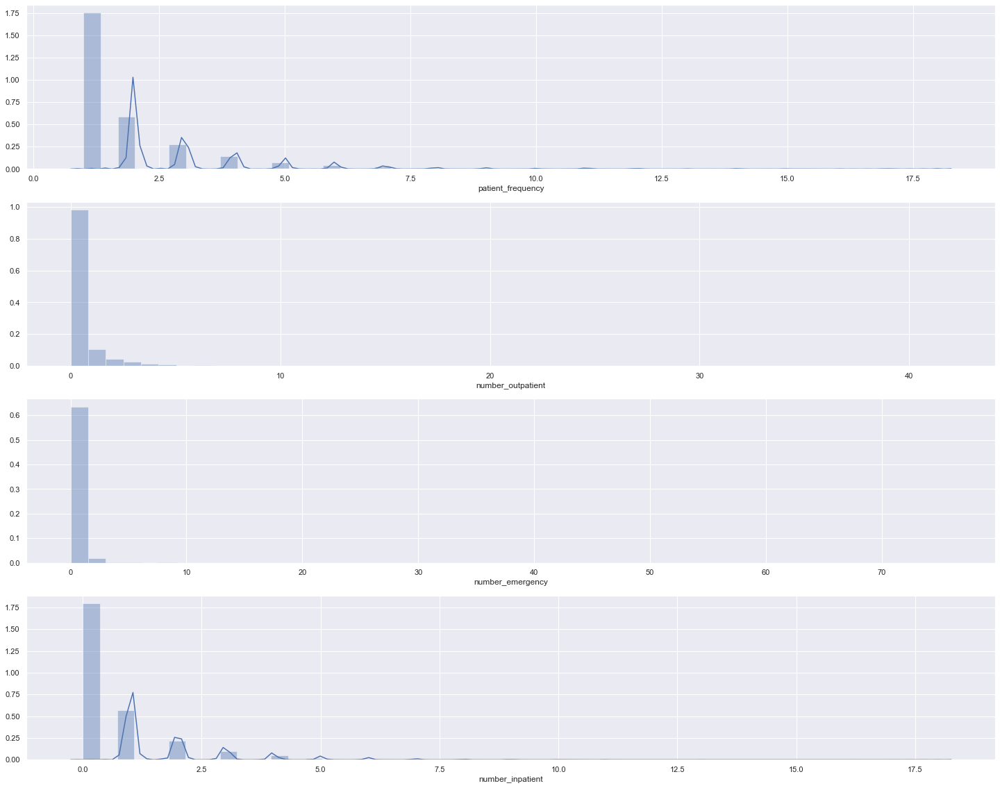

In [88]:
plt.figure(figsize=(25,20))
for i,col in enumerate(number_of_visits):
    plt.subplot(4,1,i+1)
    sns.distplot(df_visual_non_diabetic[col])

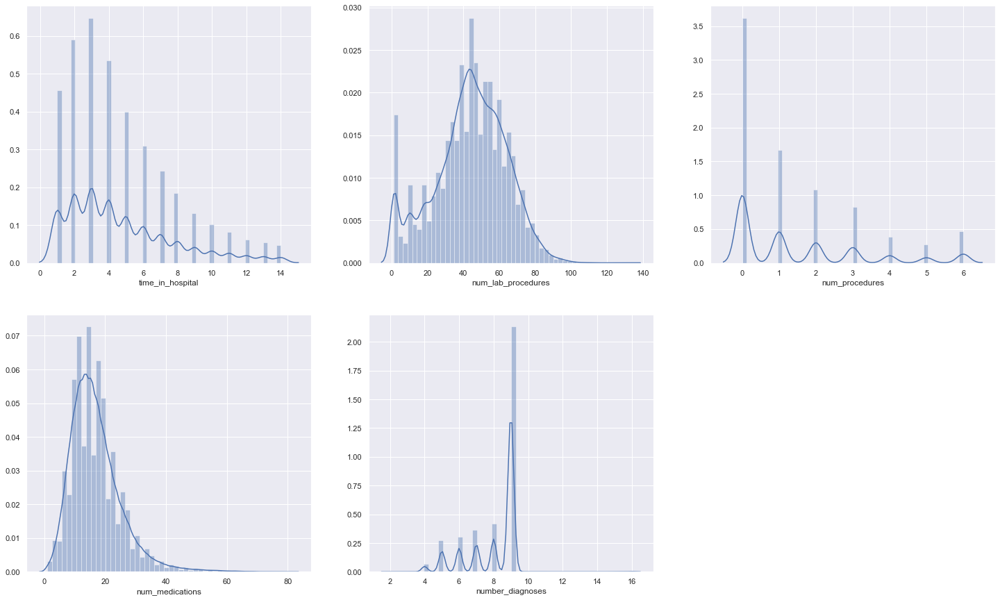

In [89]:
plt.figure(figsize=(25,15))
for i,col in enumerate(number_of_hospital_formalities):
    plt.subplot(2,3,i+1)
    sns.distplot(df_visual_non_diabetic[col])

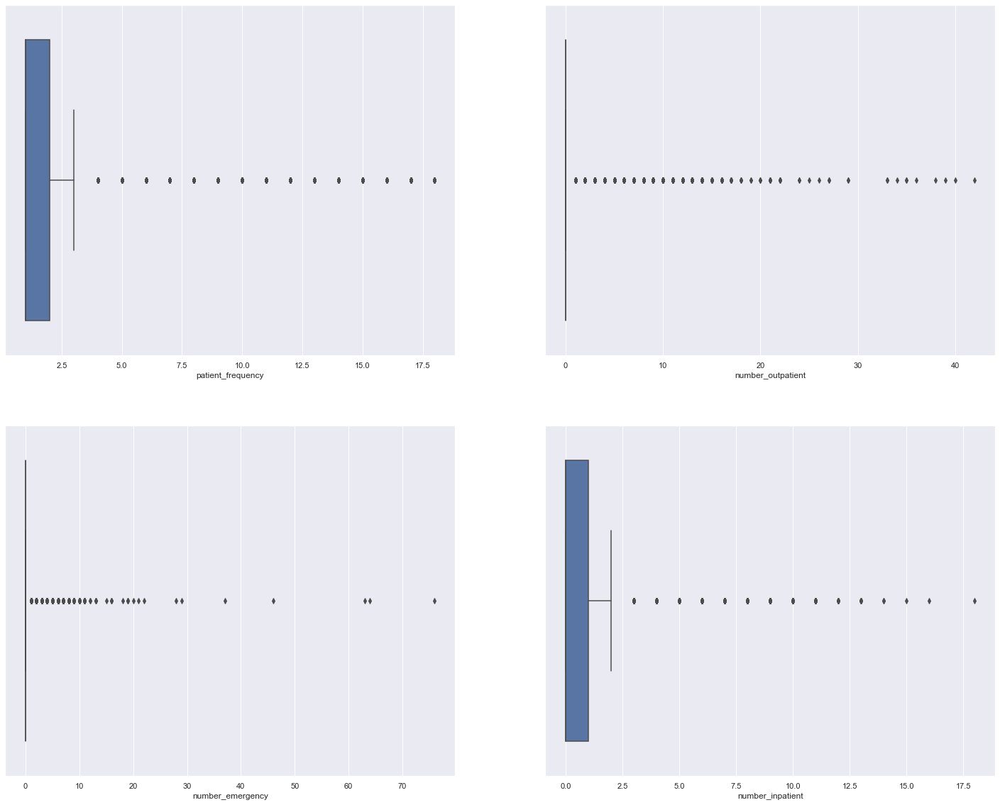

In [90]:
plt.figure(figsize=(25,20))
for i,col in enumerate(number_of_visits):
    plt.subplot(2,2,i+1)
    sns.boxplot(df_visual_non_diabetic[col])

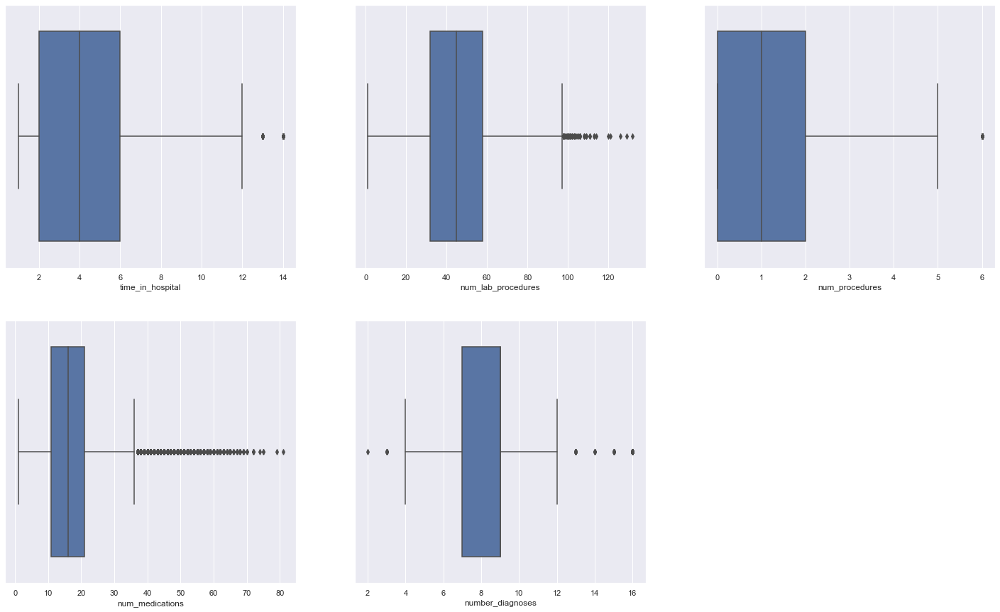

In [91]:
plt.figure(figsize=(25,15))
for i,col in enumerate(number_of_hospital_formalities):
    plt.subplot(2,3,i+1)
    sns.boxplot(df_visual_non_diabetic[col])

In [92]:
skew_of_features = pd.DataFrame([df_visual_non_diabetic[col].skew() for col in [df_visual_non_diabetic.select_dtypes(include=np.number).columns]],index=['SKEW']).T

In [93]:
skew_of_features.sort_values(by='SKEW',ascending=False)

,SKEW
number_emergency,29.969409
number_outpatient,8.870787
patient_frequency,3.573598
number_inpatient,3.122021
num_medications,1.382262
num_procedures,1.205133
time_in_hospital,1.026896
patient_nbr,0.412656
num_lab_procedures,-0.258262
number_diagnoses,-1.051460


In [94]:
# The columns that are highly skewed are number_outpatients and number_emergencys..  
# As we can see from the plots and the skew we can understand the most of the numerical columns are right skewed..

In [95]:
# Instead of transforming the variables to bring them to a normal distribution 
# and winzorizing to eliminate outliers to make the model perform better we keep
# the data as it is and analise how the model performs..
# Since these datapoints may have a significant influence on the target variable which has to be learnt by the model..

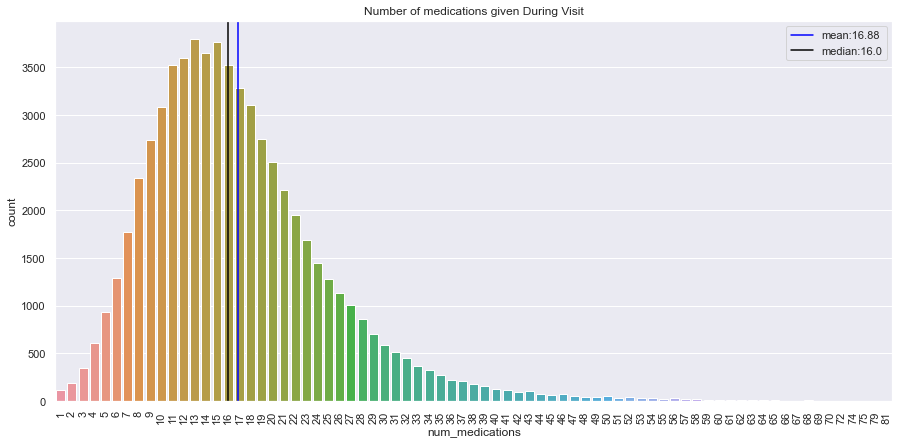

In [96]:
plt.figure(figsize=(15,7))
sns.countplot(x='num_medications', data=df_visual_non_diabetic)
mean, median = np.mean(df_visual_non_diabetic.num_medications), np.median(df_visual_non_diabetic.num_medications)
plt.axvline(mean-df_visual_non_diabetic.num_medications.min(), color='blue', label=f'mean:{round(mean,2)}')
plt.axvline(median-df_visual_non_diabetic.num_medications.min(), color='black', label=f'median:{round(median,2)}')
plt.title('Number of medications given During Visit')
plt.xticks(rotation=90)
plt.legend()
plt.show()

In [97]:
# an average of 16-17 distinct drugs has been administered per visit for each patient.
# do this wrt readmission in bivariate analysis..

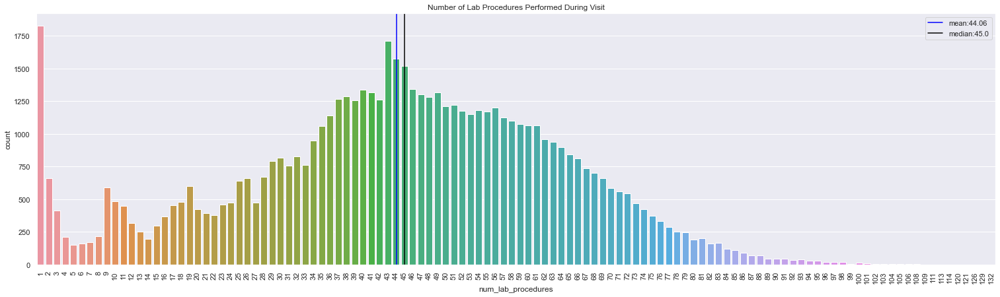

In [98]:
plt.figure(figsize=(26,7))
sns.countplot(x='num_lab_procedures', data=df_visual_non_diabetic)
mean, median = np.mean(df_visual_non_diabetic.num_lab_procedures), np.median(df_visual_non_diabetic.num_lab_procedures)
plt.axvline(mean-df_visual_non_diabetic.num_lab_procedures.min(), color='blue', label=f'mean:{round(mean,2)}')
plt.axvline(median-df_visual_non_diabetic.num_lab_procedures.min(), color='black', label=f'median:{round(median,2)}')
plt.title('Number of Lab Procedures Performed During Visit')
plt.xticks(rotation=90)
plt.legend()
plt.show()

In [99]:
# most of the time at an average 44 tests are taken on a patient, with the exception of 1....

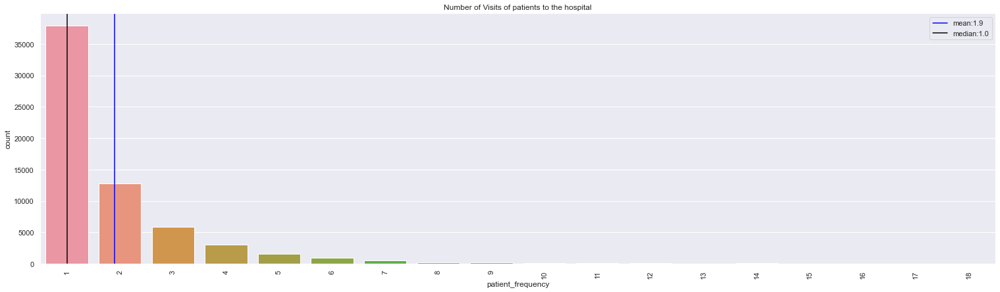

In [100]:
plt.figure(figsize=(26,7))
sns.countplot(x='patient_frequency', data=df_visual_non_diabetic)
mean, median = np.mean(df_visual_non_diabetic.patient_frequency), np.median(df_visual_non_diabetic.patient_frequency)
plt.axvline(mean-df_visual_non_diabetic.patient_frequency.min(), color='blue', label=f'mean:{round(mean,2)}')
plt.axvline(median-df_visual_non_diabetic.patient_frequency.min(), color='black', label=f'median:{round(median,2)}')
plt.title('Number of Visits of patients to the hospital')
plt.xticks(rotation=90)
plt.legend()
plt.show()

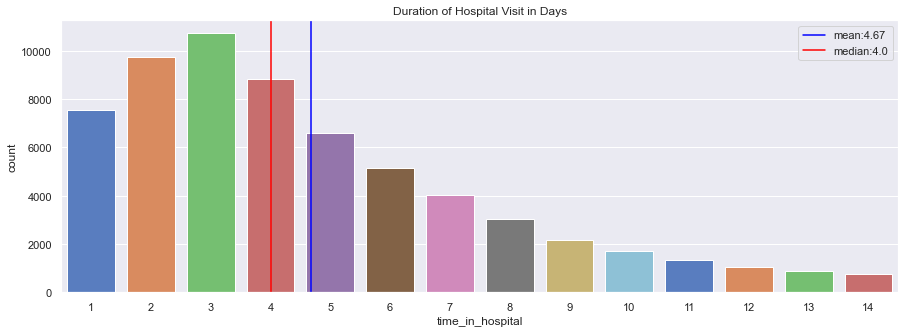

In [101]:
plt.figure(figsize=(15,5))
sns.countplot(x='time_in_hospital', palette='muted', data=df_visual_non_diabetic)
mean, median = np.mean(df_visual_non_diabetic['time_in_hospital']), np.median(df_visual_non_diabetic['time_in_hospital'])
plt.axvline(mean-df_visual_non_diabetic.time_in_hospital.min(), color='blue', label=f'mean:{round(mean,2)}')
plt.axvline(median-df_visual_non_diabetic.time_in_hospital.min(), color='red', label=f'median:{round(median,2)}')
plt.title('Duration of Hospital Visit in Days')
plt.legend()
plt.show()

In [102]:
# On an average patients spend 4 and half days in the hospital..

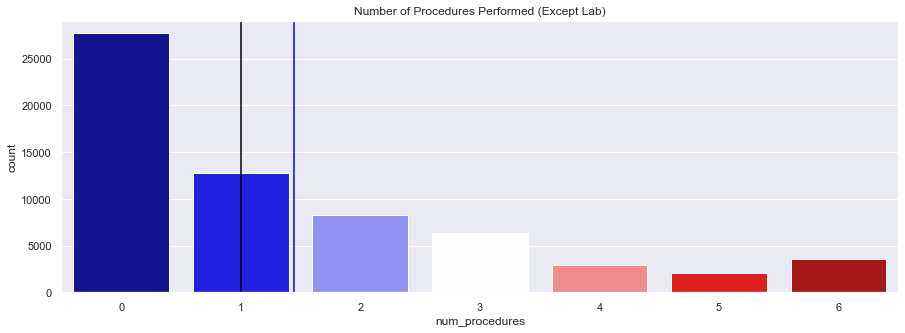

In [103]:
plt.figure(figsize=(15,5))
sns.countplot(x='num_procedures', palette='seismic', data=df_visual_non_diabetic)
mean, median = np.mean(df_visual_non_diabetic.num_procedures), np.median(df_visual_non_diabetic.num_procedures)
plt.axvline(mean, color='blue', label=f'mean:{round(mean,2)}')
plt.axvline(median, color='black', label=f'median:{round(median,2)}')
plt.title('Number of Procedures Performed (Except Lab)');

In [104]:
# For many of the patients there were no procedures performed.
# Number of manual checkups (procedures) performed by the doctor before lab procedures is usually 1 per patient.. 

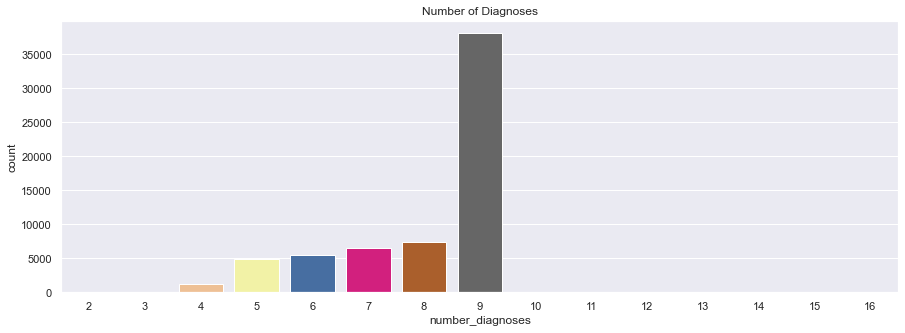

In [105]:
# number of diagnoses and readmit rate
plt.figure(figsize=(15,5))
ax = sns.countplot(x='number_diagnoses', palette='Accent', data=df_visual_non_diabetic)
plt.title('Number of Diagnoses')
plt.show()

In [106]:
# For many of the patients 9 lab diagnoses are performed...

### DISTRIBUTION OF CATEGORICAL VARIABLES

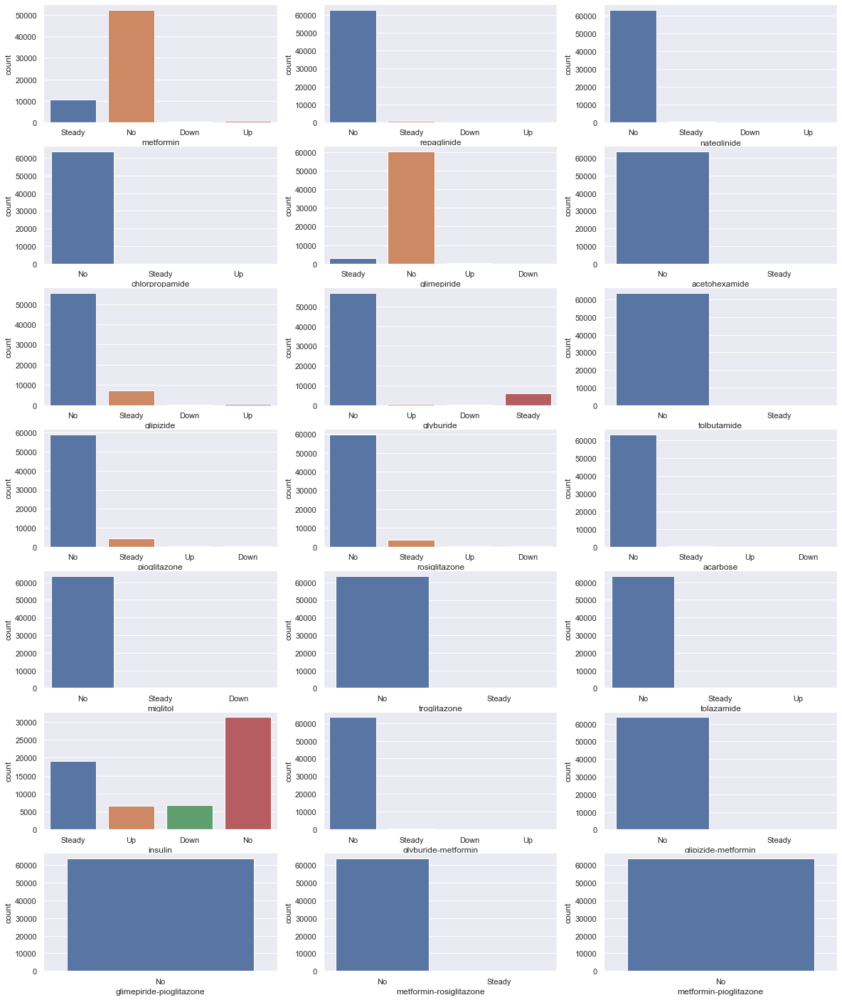

In [107]:
plt.figure(figsize=(20,25))
for i,col in enumerate(drugs_list):
    plt.subplot(7,3,i+1)
    sns.countplot(x=df_visual_non_diabetic[col])

In [108]:
# Many drugs in the dataset are not administered to patients..Only insulin seems to be administered to majority
# of the patients..
# From the domain understanding many of the drugs administered above are for type 2 diabetic patients..
# We will later perform statistical tests on these features to understand their significance wrt the target column..

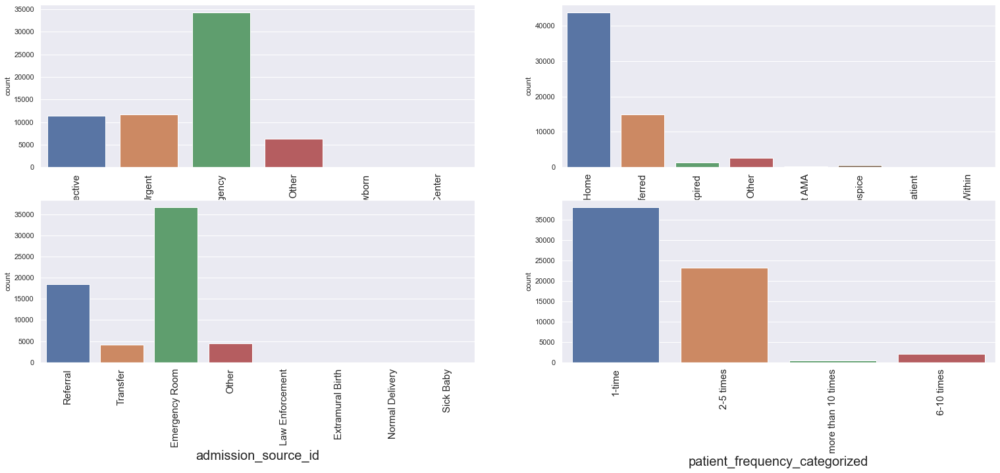

In [109]:
plt.figure(figsize=(26, 10))
for i,col in enumerate(patient_formalities_list):
    plt.subplot(2,2,i+1)
    plt.xticks(rotation=90,fontsize=15)
    plt.xlabel(col,fontsize=20)
    sns.countplot(x=df_visual_non_diabetic[col])

In [110]:
# Admission_type_id gives the information about why a patient was admitted..Many of them seem to have got admitted
# in emergency and urgent conditions..around 74000 patients..Around 20000 patients are admitted with prior formalities verified.
# Admission source id talks about how the patient got admitted..It may be because of someone's referral or transfer
# from other hospital.. It is dominated by Emergency room
# Discharge DispositionId gives the detail whether the patient was discharged to home after treatment or was transferred to
# other hospitals for various reasons..A considerably good number of patients were dischrged back home..Around 20000 patients
# were traansferred to other hospitals or care centres..
# left AMA : left against medical advice : Patient refuses to stay for continued care..

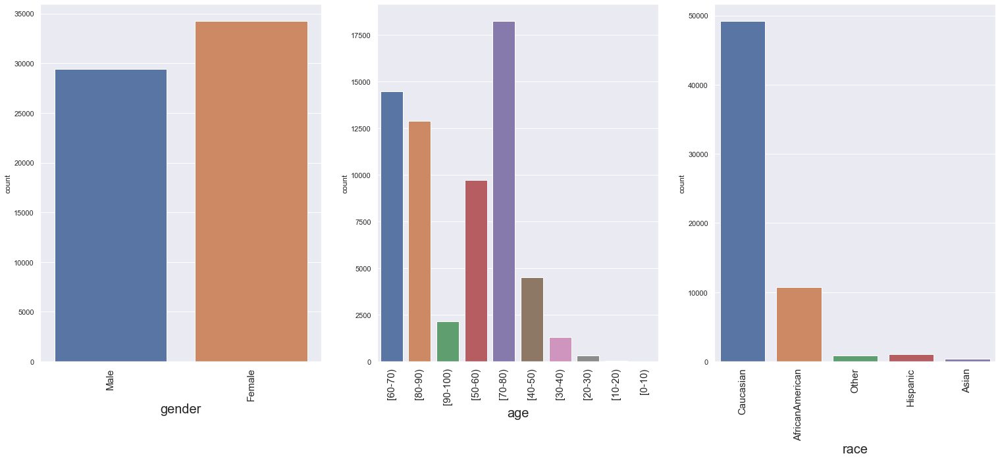

In [111]:
plt.figure(figsize=(26, 10))
for i,col in enumerate(patient_demographics_list):
    plt.subplot(1,3,i+1)
    plt.xticks(rotation=90,fontsize=15)
    plt.xlabel(col,fontsize=20)
    sns.countplot(x=df_visual_non_diabetic[col])

In [112]:
# As we can see the gender is balanced, oddly there are more females compared to that of males
# Majority of the patients are senior citizends..
# Caucasians are high..

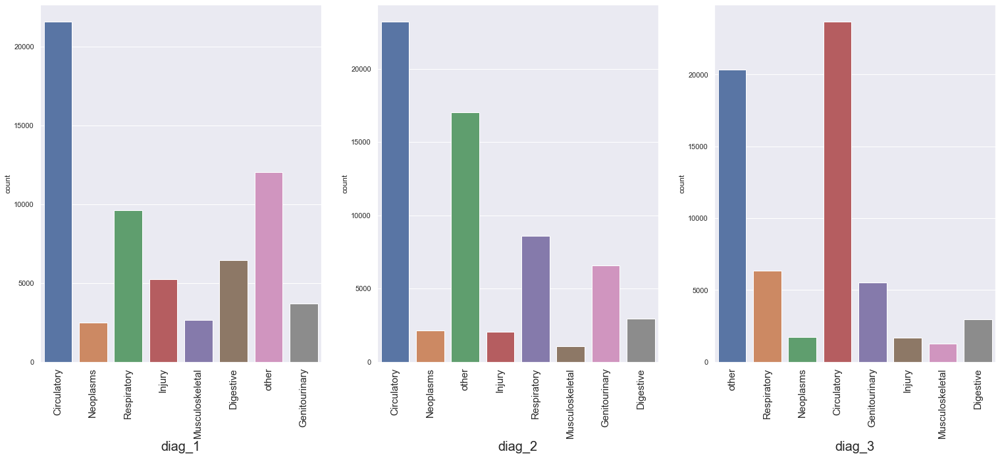

In [113]:
plt.figure(figsize=(26, 10))
for i,col in enumerate(diagnosis_list):
    plt.subplot(1,3,i+1)
    plt.xticks(rotation=90,fontsize=15)
    plt.xlabel(col,fontsize=20)
    sns.countplot(x=df_visual_non_diabetic[col])

In [114]:
#-------> Many patients have circulatory disorders...

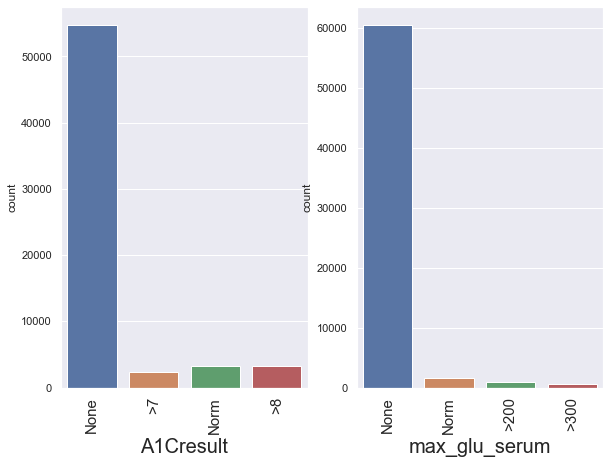

In [115]:
plt.figure(figsize=(15, 7))
for i,col in enumerate(primary_tests_list):
    plt.subplot(1,3,i+1)
    plt.xticks(rotation=90,fontsize=15)
    plt.xlabel(col,fontsize=20)
    sns.countplot(x=df_visual_non_diabetic[col])

In [116]:
# The details of the test results of A1C and maximum glucose serum is not specified for Most of the patients... 

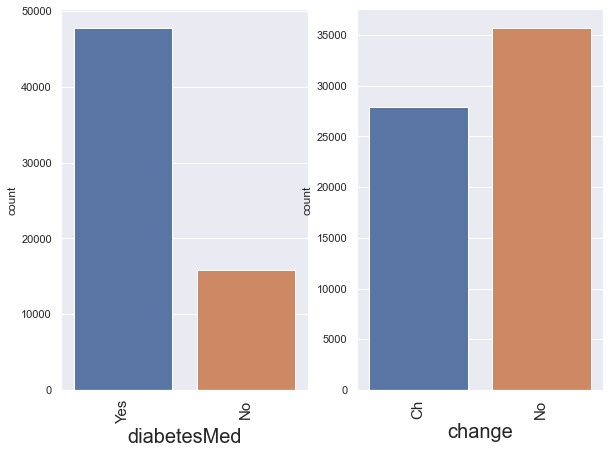

In [117]:
plt.figure(figsize=(15, 7))
for i,col in enumerate(medication_changes_list):
    plt.subplot(1,3,i+1)
    plt.xticks(rotation=90,fontsize=15)
    plt.xlabel(col,fontsize=20)
    sns.countplot(x=df_visual_non_diabetic[col])

In [118]:
# For around 23000 patients no diabetes medications were given..
# For around 46000 patients medications was changed..

### BIVARIATE ANALYSIS (NUMERICAL VS NUMERICAL)

### CORRELATION AMONG NUMERICAL VARIABLES

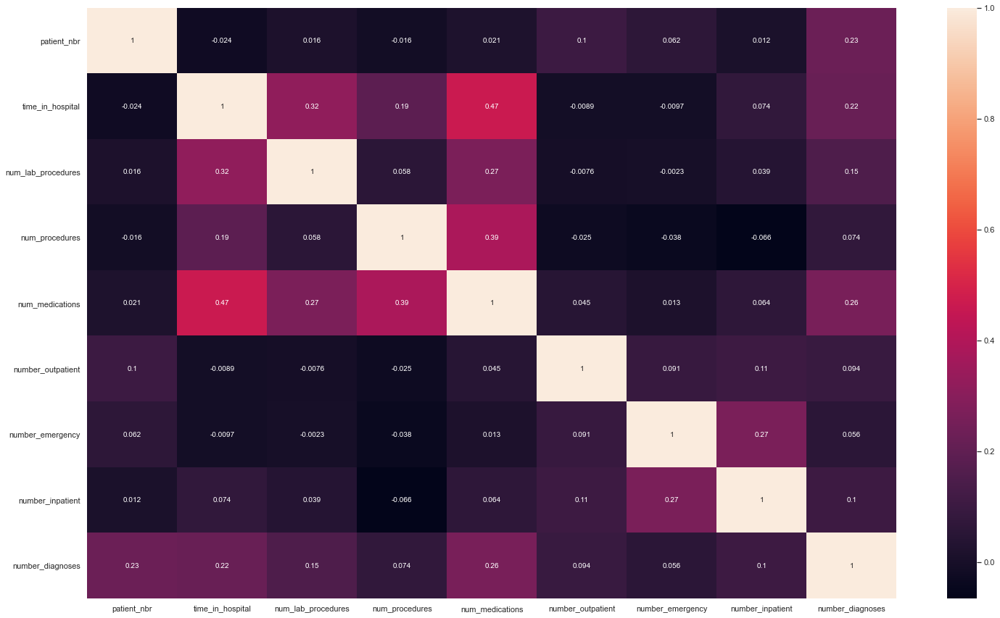

In [120]:
plt.figure(figsize=(25,15))
sns.heatmap(numerical_df_with_target.corr(),annot=True);

In [121]:
# As we can see from the heatmap there is no heavy multicollinearity among the numerical variables in the data..

In [122]:
# We analyse the relation between numerical columns that have high correlation compared to the rest..

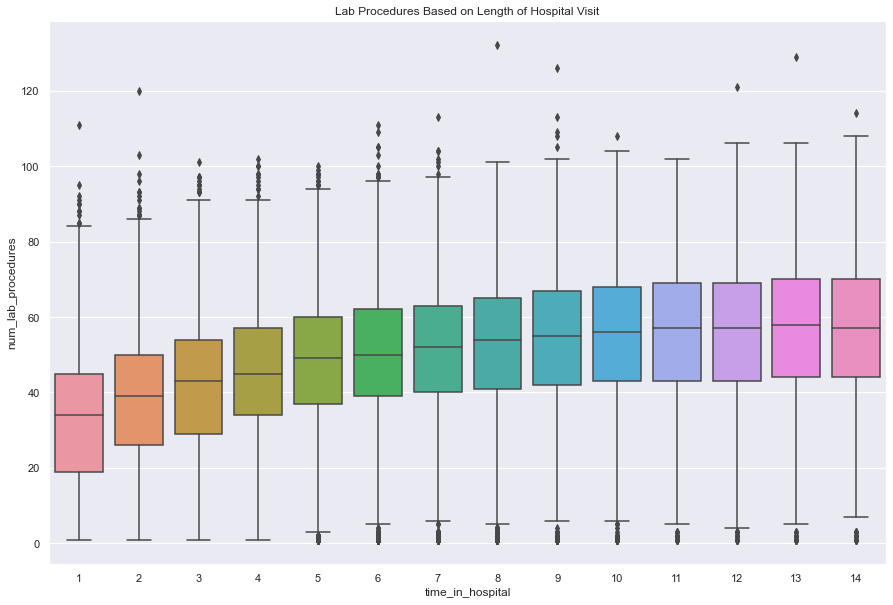

In [123]:
plt.figure(figsize=(15,10))
ax = sns.boxplot(x='time_in_hospital', y='num_lab_procedures', data=df_visual_non_diabetic.sort_values('time_in_hospital'))
# box_labels(ax, df.sort_values('time_in_hospital'),'time_in_hospital','num_lab_procedures') 
plt.title('Lab Procedures Based on Length of Hospital Visit')
plt.show()

In [124]:
# There is an increasing trend between time spent in the hospital and number of lab tests completed.
# This makes sense since patients with longer stays had more tests completed to properly diagnose their conditions.

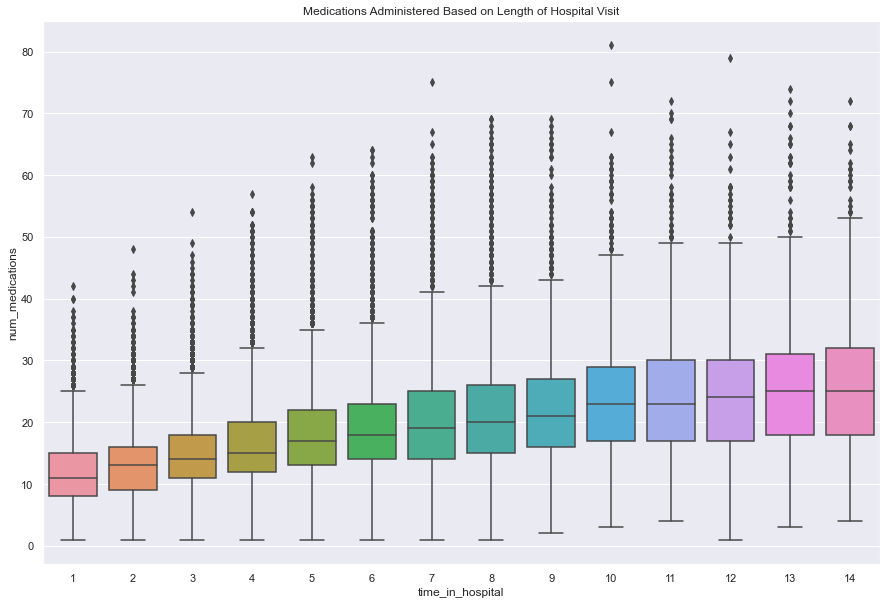

In [125]:
plt.figure(figsize=(15,10))
ax = sns.boxplot(x='time_in_hospital', y='num_medications', data=df_visual_non_diabetic)
plt.title('Medications Administered Based on Length of Hospital Visit')
plt.show()

In [126]:
# Patients who spend more time in the hospital receive more medications..

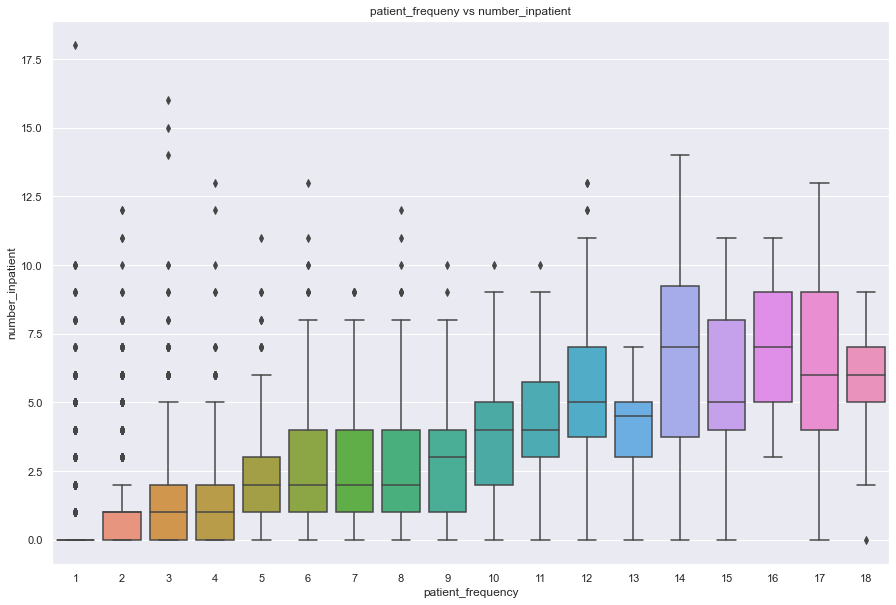

In [127]:
plt.figure(figsize=(15,10))
ax = sns.boxplot(x='patient_frequency', y='number_inpatient', data=df_visual_non_diabetic)
plt.title('patient_frequeny vs number_inpatient')
plt.show()

### NUMERICAL FEATURES VS TARGET

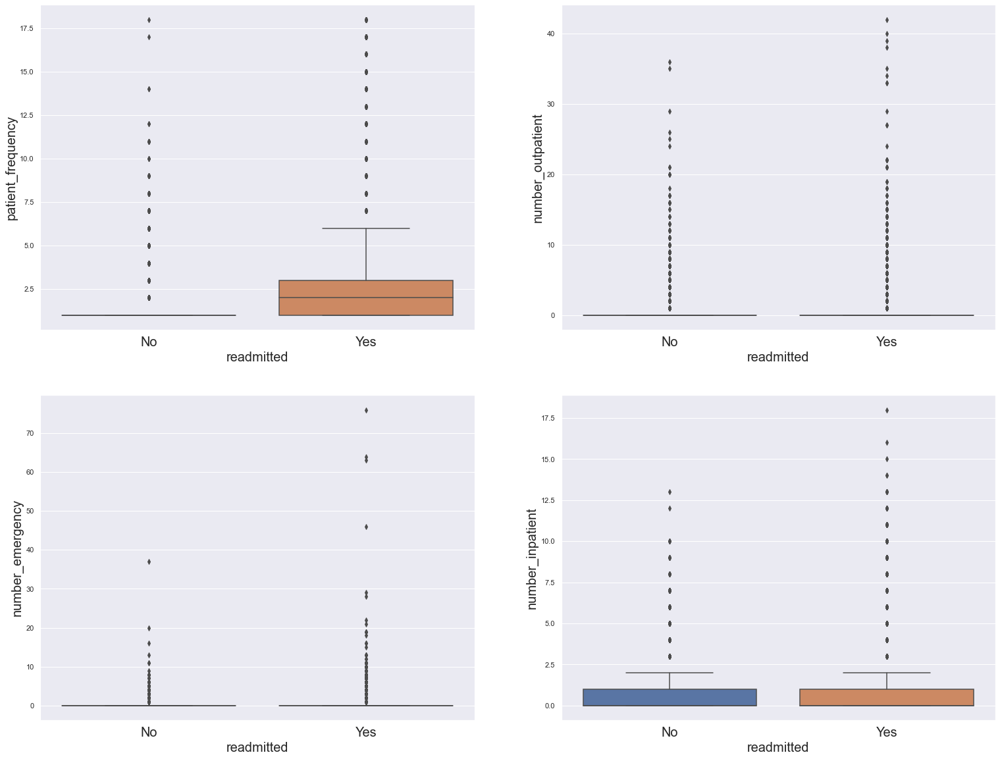

In [128]:
plt.figure(figsize=(26,20))
for i,col in enumerate(number_of_visits):
    plt.subplot(2,2,i+1)
    plt.ylabel(col,fontsize=20)
    plt.xlabel(col,fontsize=20)
    plt.xticks(fontsize=20)
    sns.boxplot(x=df_visual_non_diabetic['readmitted'],y=df_visual_non_diabetic[col])

In [129]:
# A good number of people are visiting inpatients who were re admitted within 30 days
# For majority of the inpatients there were no visitors in the previous year..
# A maximum of 21 visitors were there for one particular patient
# usually it is limited to 3 or less than 3 for majority of the patients
#----------> Number_inpatient vs diag..vs number of days

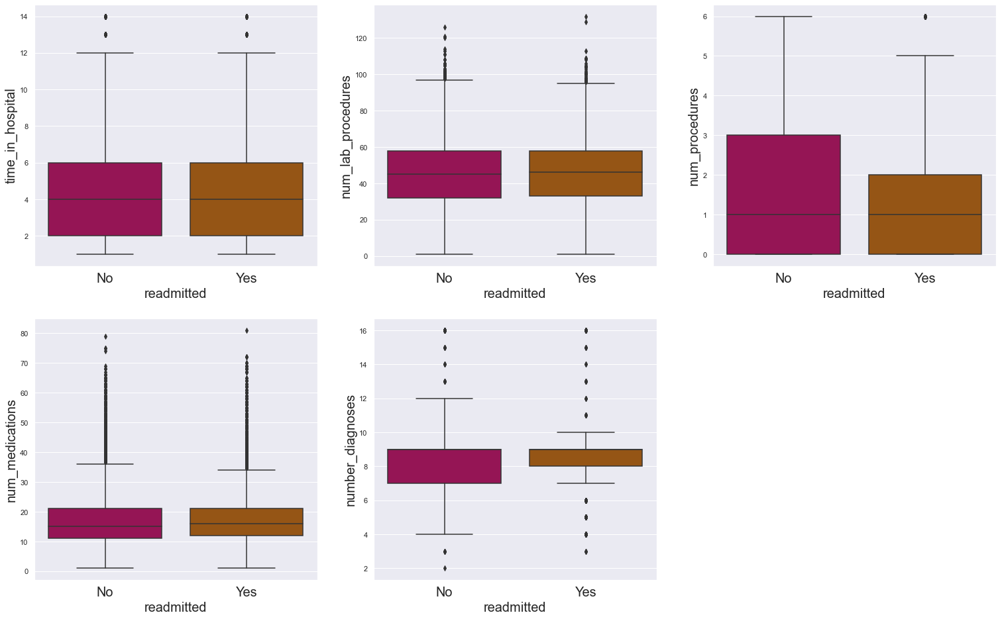

In [130]:
plt.figure(figsize=(26,16))
for i,col in enumerate(number_of_hospital_formalities):
    plt.subplot(2,3,i+1)
    plt.ylabel(col,fontsize=20)
    plt.xlabel(col,fontsize=20)
    plt.xticks(fontsize=20)
    sns.boxplot(x=df_visual_non_diabetic['readmitted'],y=df_visual_non_diabetic[col],palette='brg')

In [131]:
# From the above boxplots we get to know that certain numerical features do not have a significant impact on the target
# such as time_in_hospital, number_of_lab_procedures,number_procedures,number_of_medications and number_of_diagnoses

### CATEGORICAL FEATURES VS TARGET

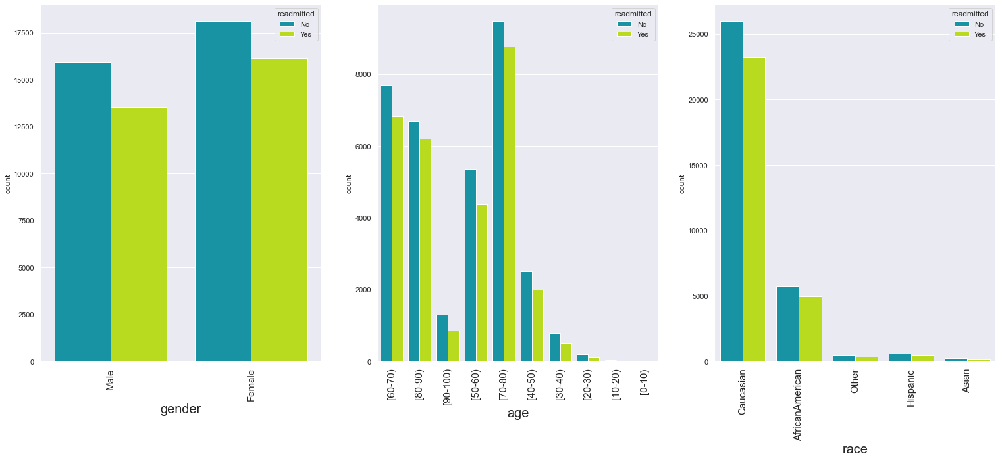

In [132]:
plt.figure(figsize=(26,10))
count =0
for i in patient_demographics_list:
    plt.subplot(1,3,count+1)
    plt.xticks(rotation=90,fontsize=15)
    plt.xlabel(i,fontsize=20)
    sns.countplot(df_visual_non_diabetic[i], hue=df_visual_non_diabetic['readmitted'], palette='nipy_spectral');
    count = count+1

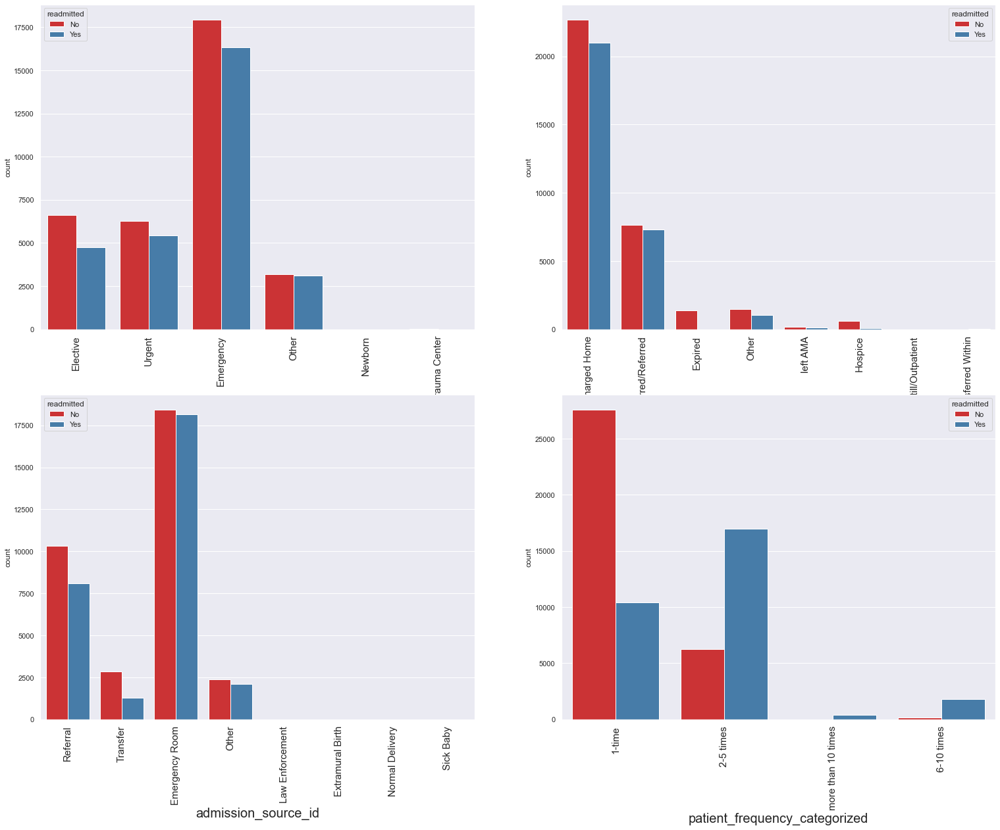

In [133]:
plt.figure(figsize=(26,20))
count =0
for i in patient_formalities_list:
    plt.subplot(2,2,count+1)
    plt.xticks(rotation=90,fontsize=15)
    plt.xlabel(i,fontsize=20)
    sns.countplot(df_visual_non_diabetic[i], hue=df_visual_non_diabetic['readmitted'], palette='Set1');
    count = count+1

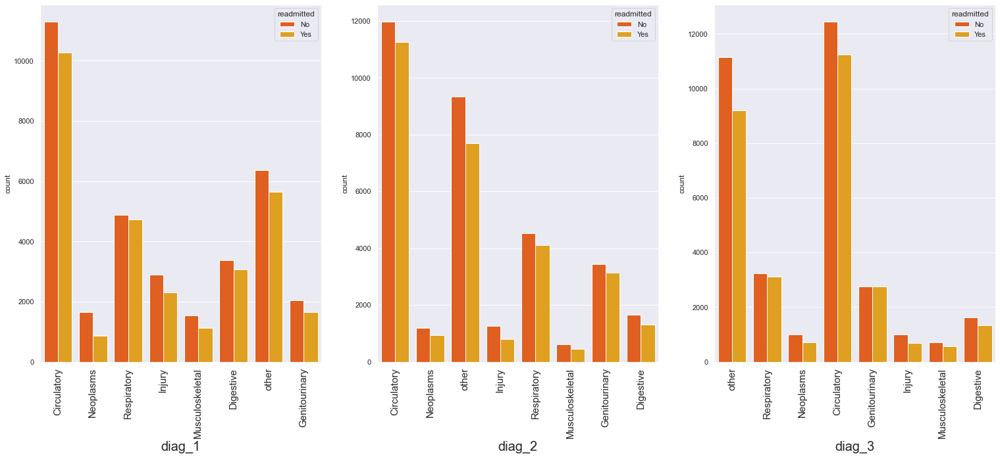

In [134]:
plt.figure(figsize=(26,10))
count =0
for i in diagnosis_list:
    plt.subplot(1,3,count+1)
    plt.xticks(rotation=90,fontsize=15)
    plt.xlabel(i,fontsize=20)
    sns.countplot(df_visual_non_diabetic[i], hue=df_visual_non_diabetic['readmitted'], palette='autumn');
    count = count+1

In [135]:
# Based on drugs

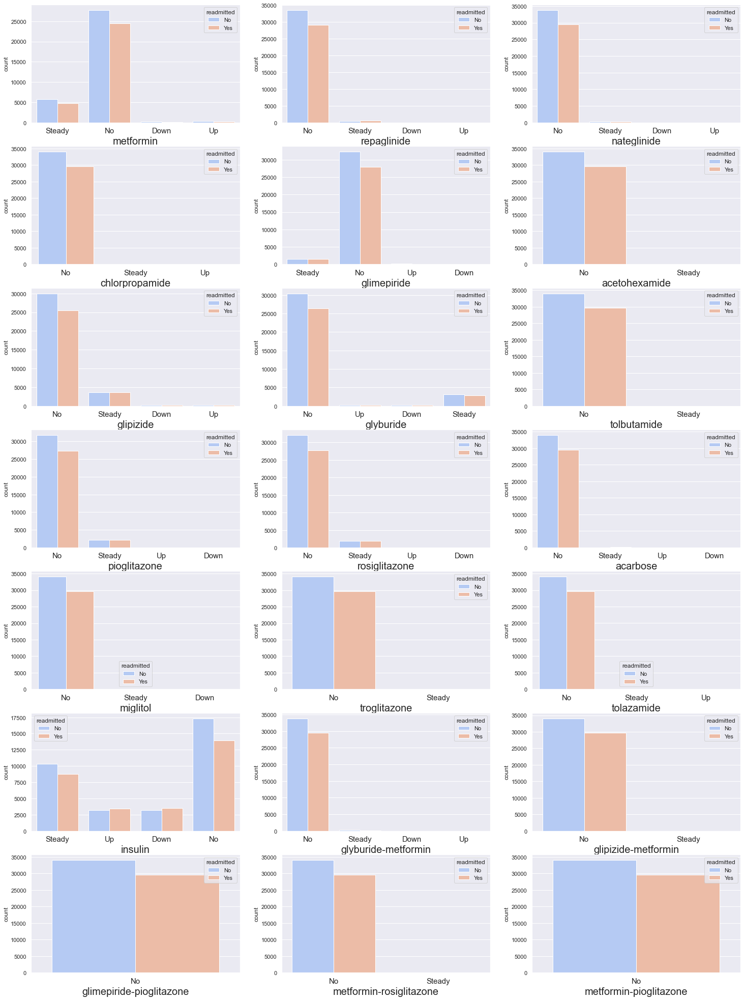

In [136]:
plt.figure(figsize=(25,35))
count =0
for i in drugs_list:
    plt.subplot(7,3,count+1)
    plt.xticks(fontsize=15)
    plt.xlabel(i,fontsize=20)
    sns.countplot(df_visual_non_diabetic[i], hue=df_visual_non_diabetic['readmitted'], palette='coolwarm');
    count = count+1

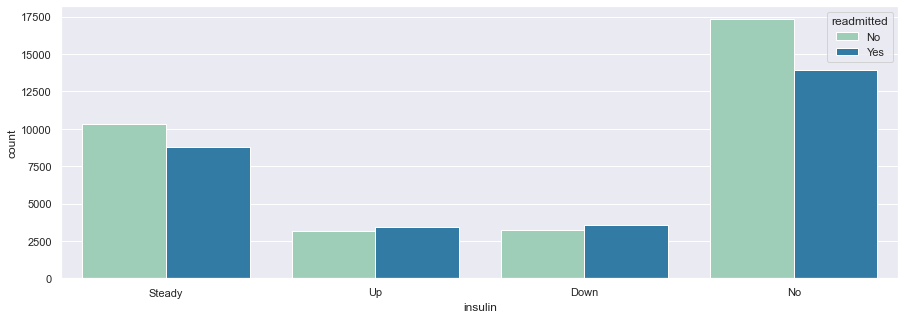

In [137]:
fig, ax =plt.subplots(figsize=(15,5))
sns.countplot(x="insulin", hue="readmitted", data=df_visual_non_diabetic, palette="YlGnBu")
plt.show()

In [138]:
# Understanding how the major drug 'Insulin' influences patient behaviour
# for majority of the patients Insulin was not administered
# people whose insulin doses were Up or down i.e increased are more likely to get re-admitted..
# Why down increases readmission???

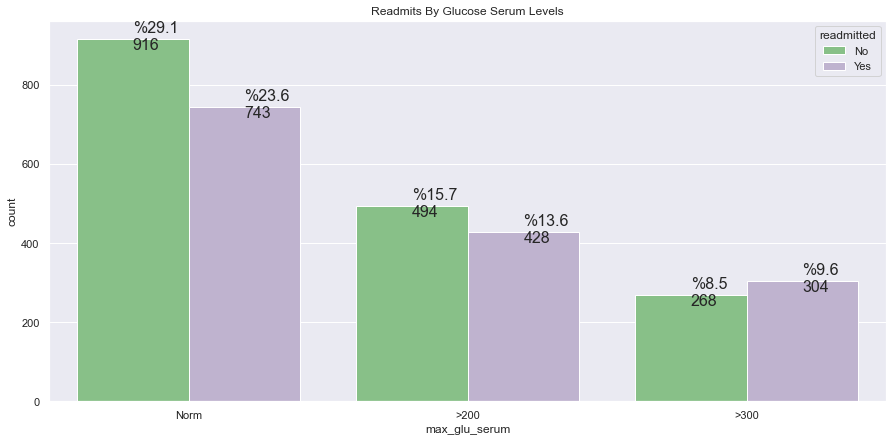

In [139]:
# exclude patients without a glucose reading
plt.figure(figsize=(15, 7))
glucose_none = df_visual_non_diabetic[df_visual_non_diabetic.max_glu_serum != 'None']

# glucose serum results and readmit impact
ax = sns.countplot(x='max_glu_serum', hue='readmitted', palette='Accent', data=glucose_none)
labels_catnum(ax,glucose_none)
plt.title('Readmits By Glucose Serum Levels')
plt.show()

In [140]:
# if the glucose serum test value with

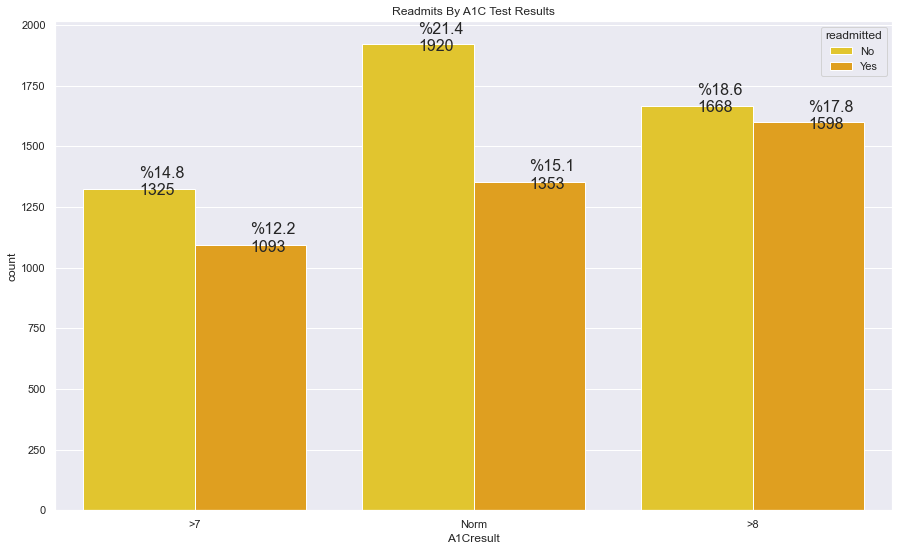

In [141]:
# exclude patients without an A1C reading
alc_none = df_visual_non_diabetic[df_visual_non_diabetic.A1Cresult != 'None']
plt.figure(figsize=(15, 9))
# A1C results and readmit impact
ax = sns.countplot(x='A1Cresult', hue='readmitted', palette='Wistia', data=alc_none)
labels_catnum(ax, alc_none)
plt.title('Readmits By A1C Test Results')
plt.show()

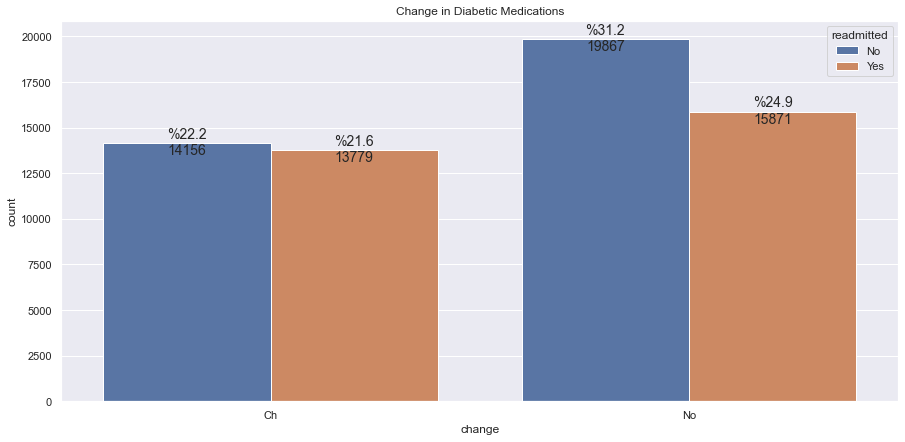

In [142]:
# change in medications
plt.figure(figsize=(15,7))
ax = sns.countplot(x='change', hue='readmitted', data=df_visual_non_diabetic)
labels(ax)
plt.title('Change in Diabetic Medications')
plt.show()

In [143]:
# if there is no change in medication the readmission rate is less..

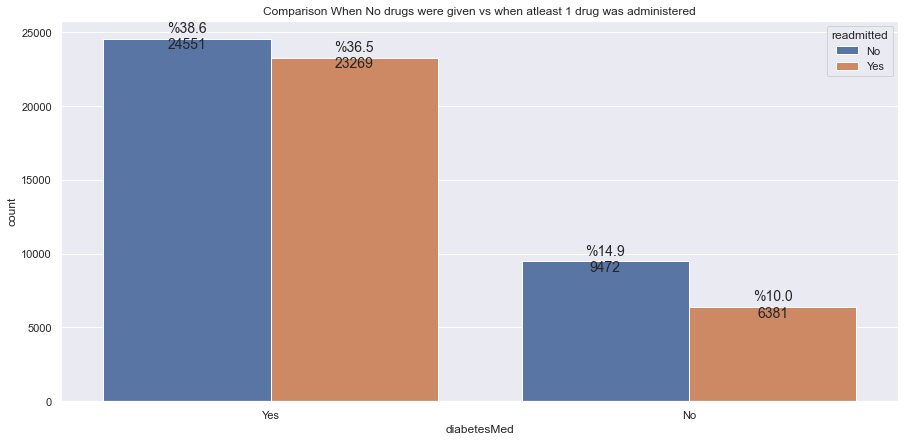

In [144]:
plt.figure(figsize=(15,7))
ax = sns.countplot(x='diabetesMed', hue='readmitted', data=df_visual_non_diabetic)
labels(ax)
plt.title('Comparison When No drugs were given vs when atleast 1 drug was administered')
plt.show()

In [145]:
#     No significant impact on patient readmission..

### CATEGORICAL VS CATEGORICAL

### PATIENT DEMOGRAPHICS VS REST

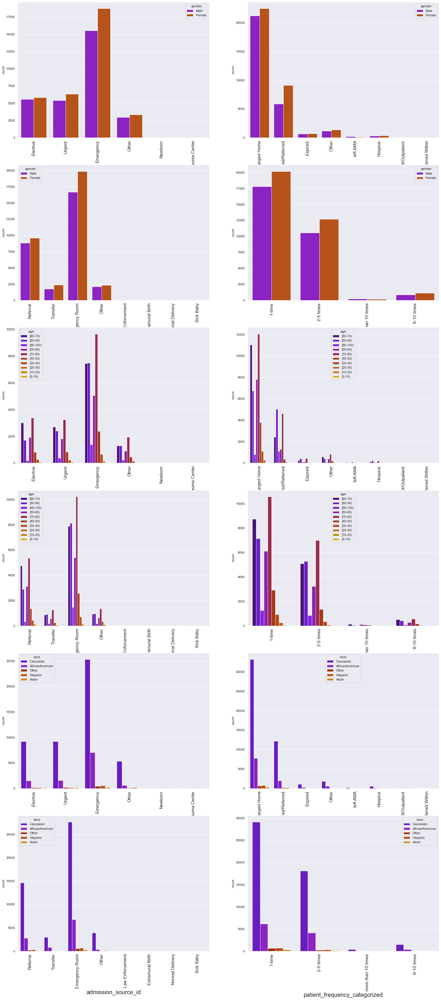

In [146]:
plt.figure(figsize=(26,60))
count =0
for i in patient_demographics_list:
    for j in patient_formalities_list:
        plt.subplot(6,2,count+1)
        plt.xticks(fontsize=15,rotation=90)
        plt.xlabel(i,fontsize=20)
        sns.countplot(x=j, hue=i,data=df_visual_non_diabetic, palette='gnuplot');
        count = count+1

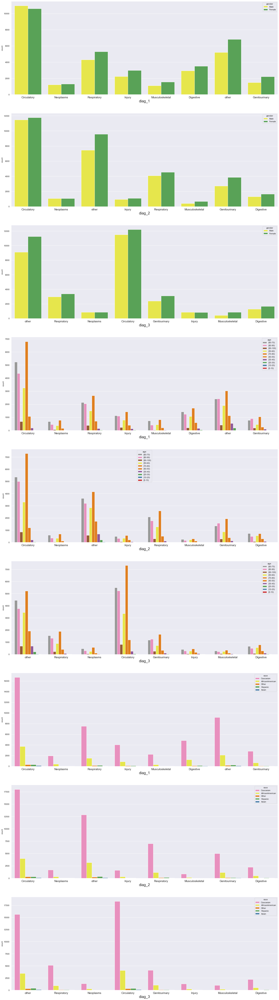

In [147]:
plt.figure(figsize=(26,99))
count =0
for i in patient_demographics_list:
    for j in diagnosis_list:
        plt.subplot(9,1,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        sns.countplot(x=j, hue=i,data=df_visual_non_diabetic, palette='Set1_r');
        count = count+1

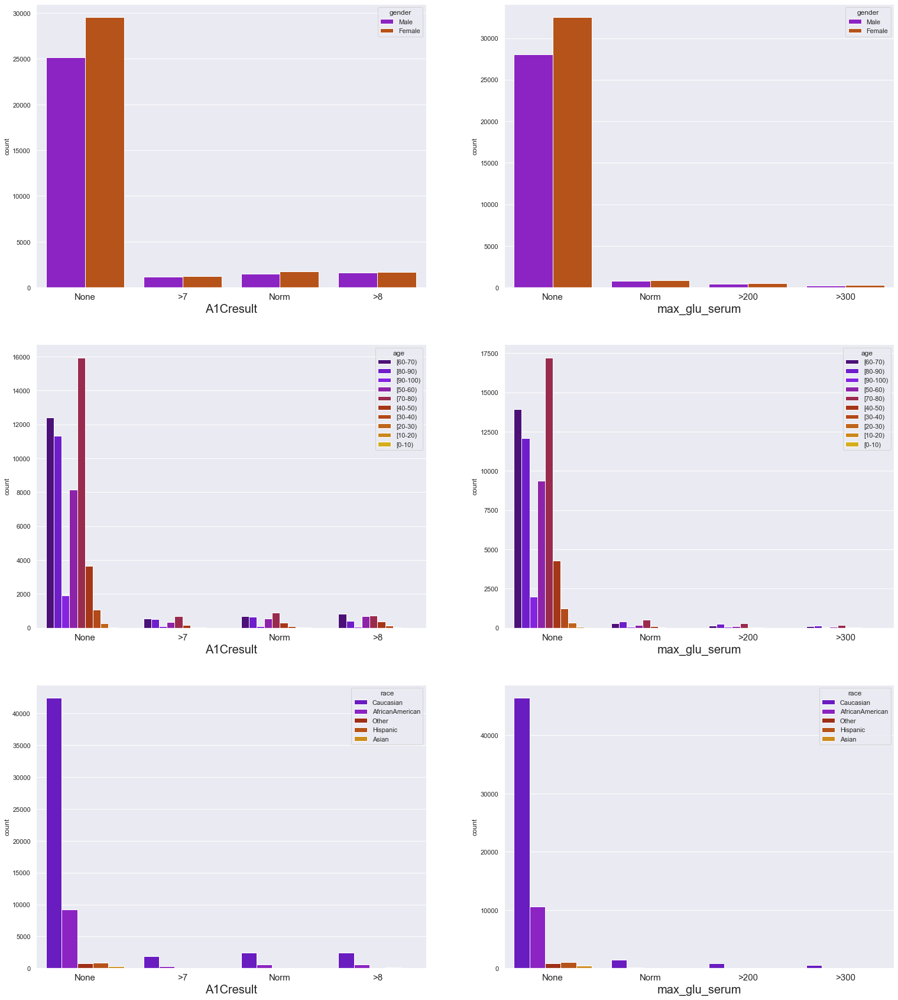

In [148]:
plt.figure(figsize=(26,30))
count =0
for i in patient_demographics_list:
    for j in primary_tests_list:
        plt.subplot(3,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        sns.countplot(x=j, hue=i,data=df_visual_non_diabetic, palette='gnuplot');
        count = count+1

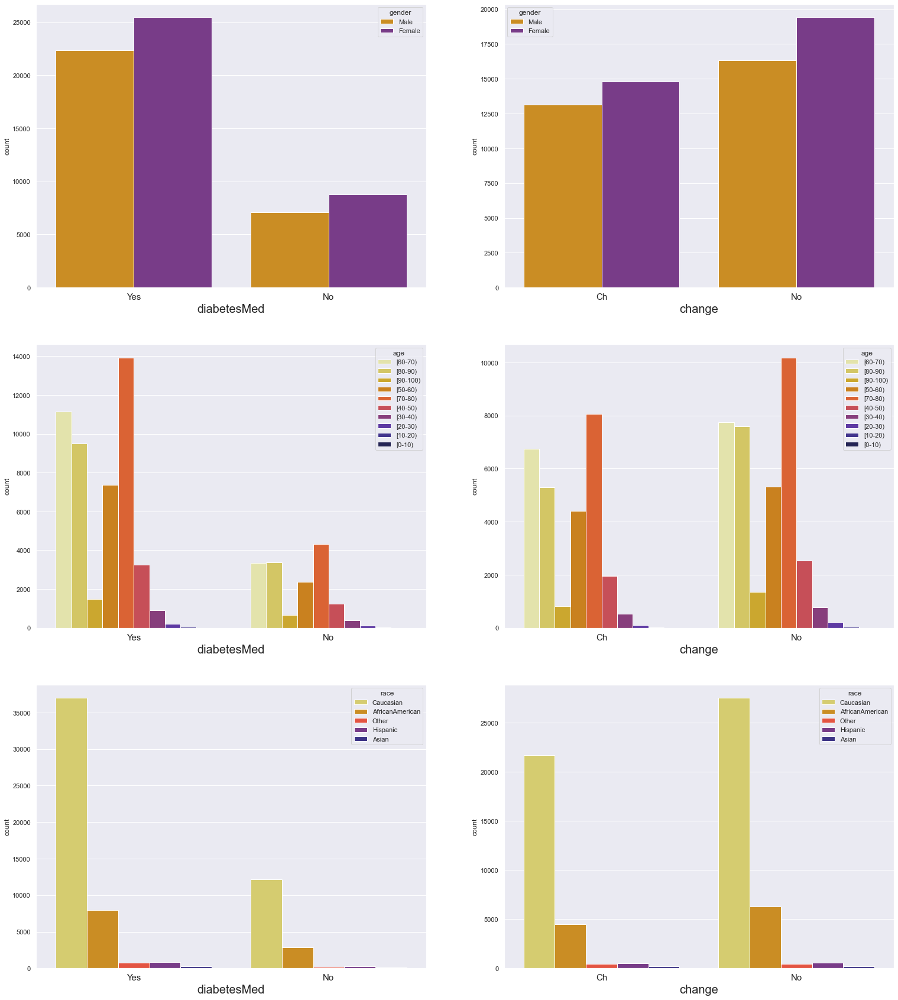

In [149]:
plt.figure(figsize=(26,30))
count =0
for i in patient_demographics_list:
    for j in medication_changes_list:
        plt.subplot(3,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        sns.countplot(x=j, hue=i,data=df_visual_non_diabetic, palette='CMRmap_r');
        count = count+1

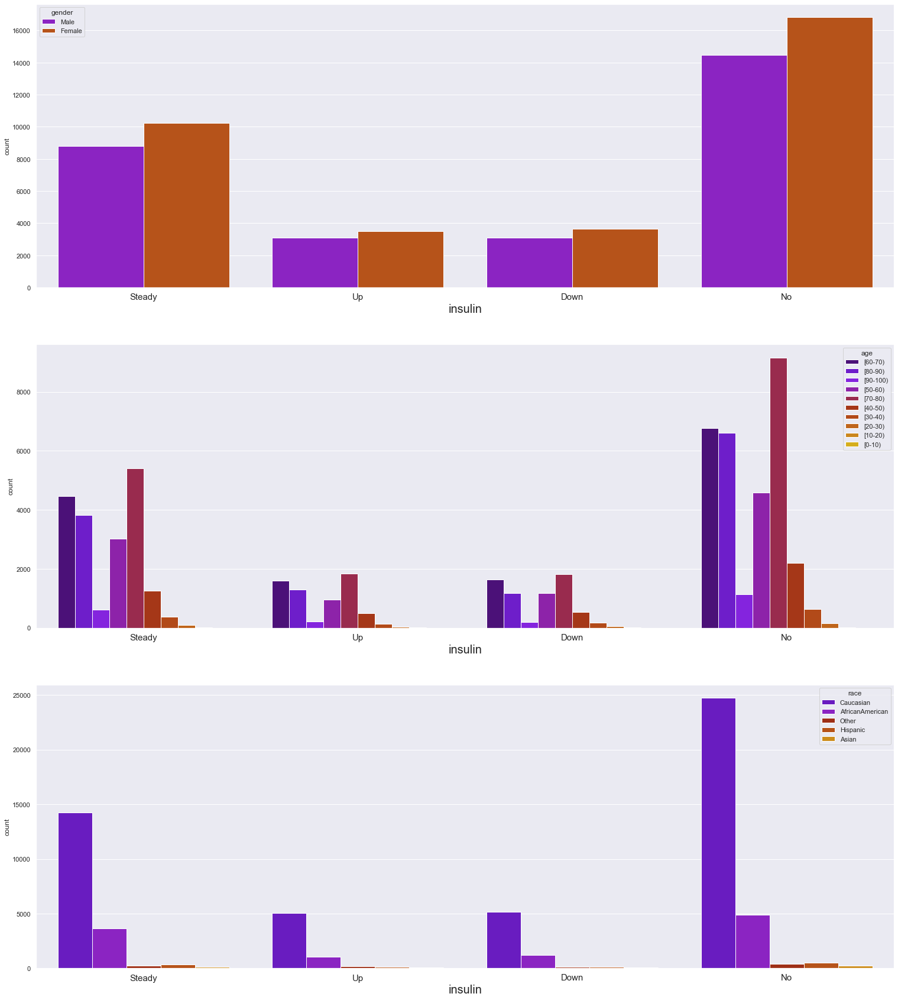

In [150]:
plt.figure(figsize=(26,30))
count =0
for i in patient_demographics_list:
    plt.subplot(3,1,count+1)
    plt.xticks(fontsize=15)
    plt.xlabel(i,fontsize=20)
    sns.countplot(x='insulin', hue=i,data=df_visual_non_diabetic, palette='gnuplot');
    count = count+1

### PATIENT FORMALITIES VS REST

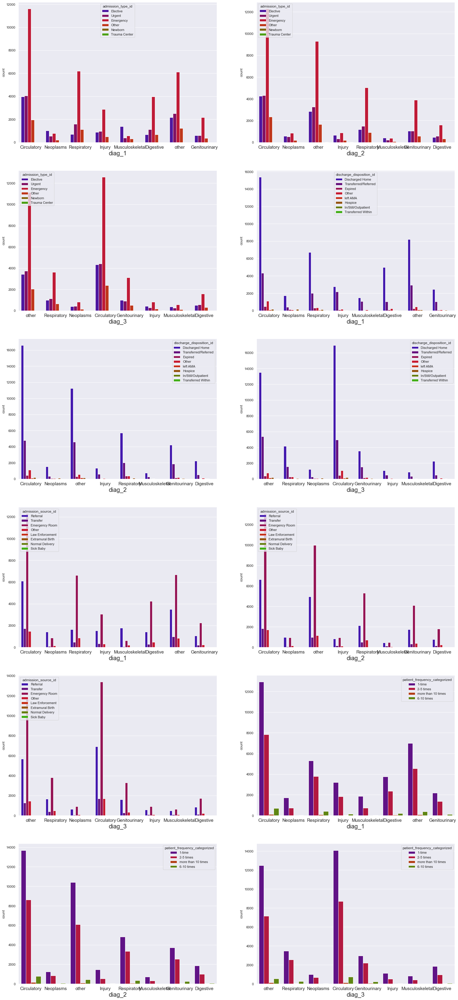

In [151]:
plt.figure(figsize=(26,60))
count =0
for i in patient_formalities_list:
    for j in diagnosis_list:
        plt.subplot(6,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.countplot(x=j, hue=i,data=df_visual_non_diabetic, palette='brg');
        count = count+1

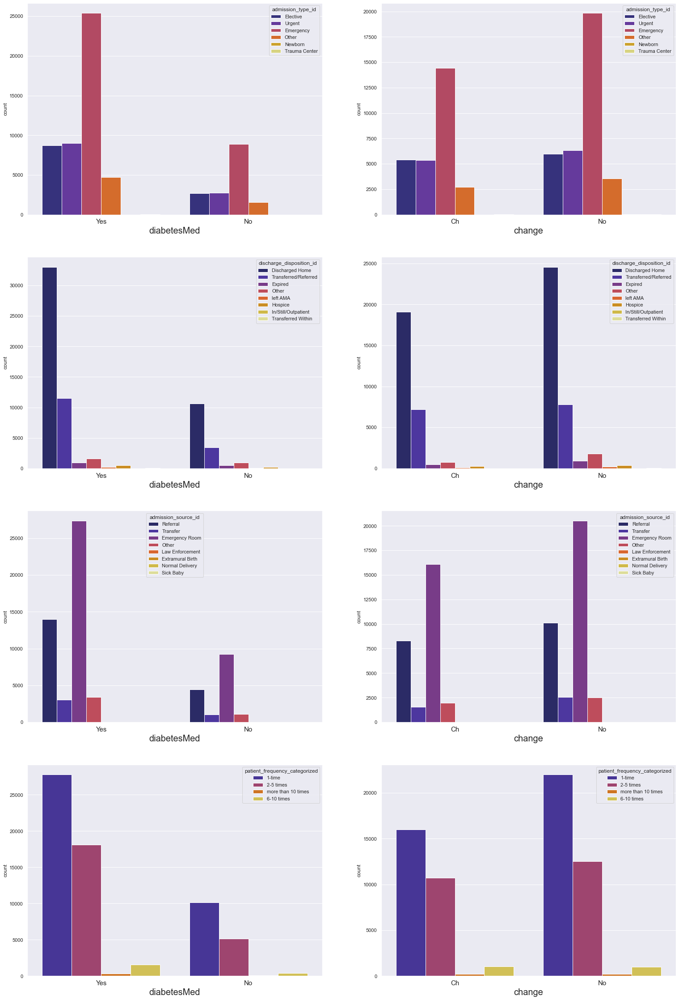

In [152]:
plt.figure(figsize=(26,40))
count =0
for i in patient_formalities_list:
    for j in medication_changes_list:
        plt.subplot(4,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        sns.countplot(x=j, hue=i,data=df_visual_non_diabetic, palette='CMRmap');
        count = count+1

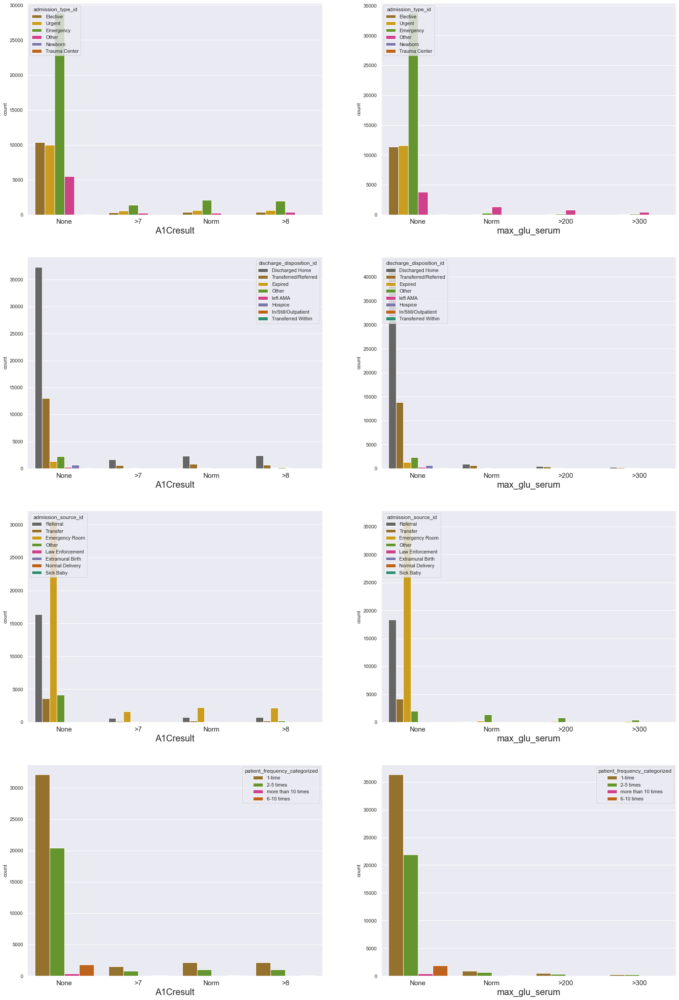

In [153]:
plt.figure(figsize=(26,40))
count =0
for i in patient_formalities_list:
    for j in primary_tests_list:
        plt.subplot(4,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.countplot(x=j, hue=i,data=df_visual_non_diabetic, palette='Dark2_r');
        count = count+1

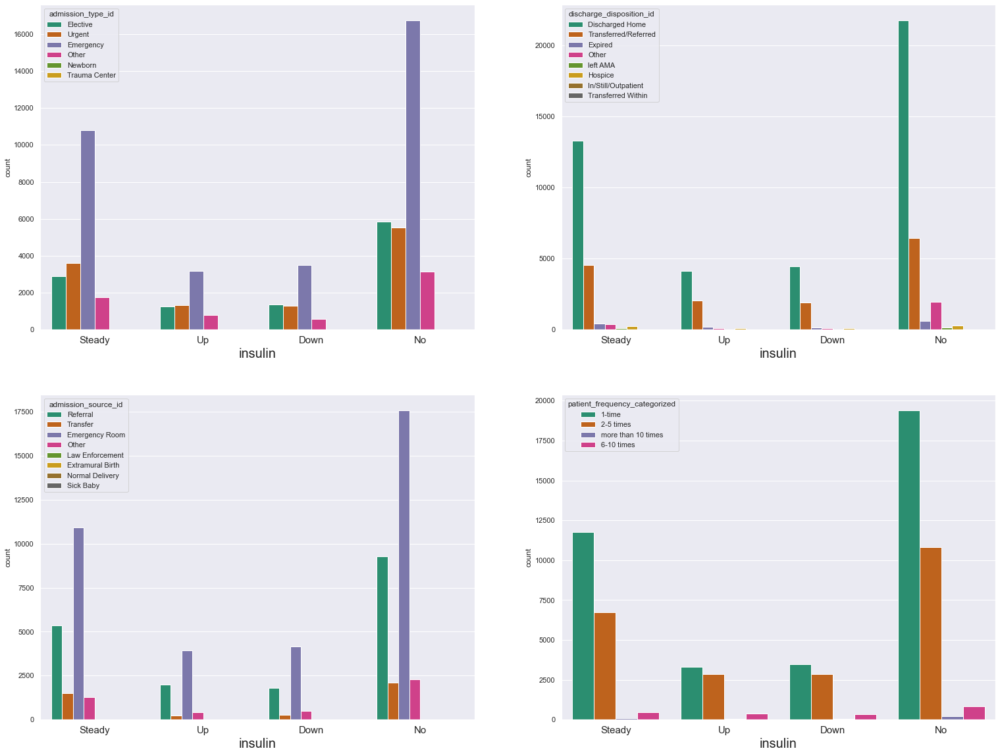

In [154]:
plt.figure(figsize=(26,20))
count =0
for i in patient_formalities_list:
    plt.subplot(2,2,count+1)
    plt.xticks(fontsize=15)
    plt.xlabel(i,fontsize=20)
    sns.countplot(x='insulin', hue=i,data=df_visual_non_diabetic, palette='Dark2');
    count = count+1

### DIAGNOSES VS REST

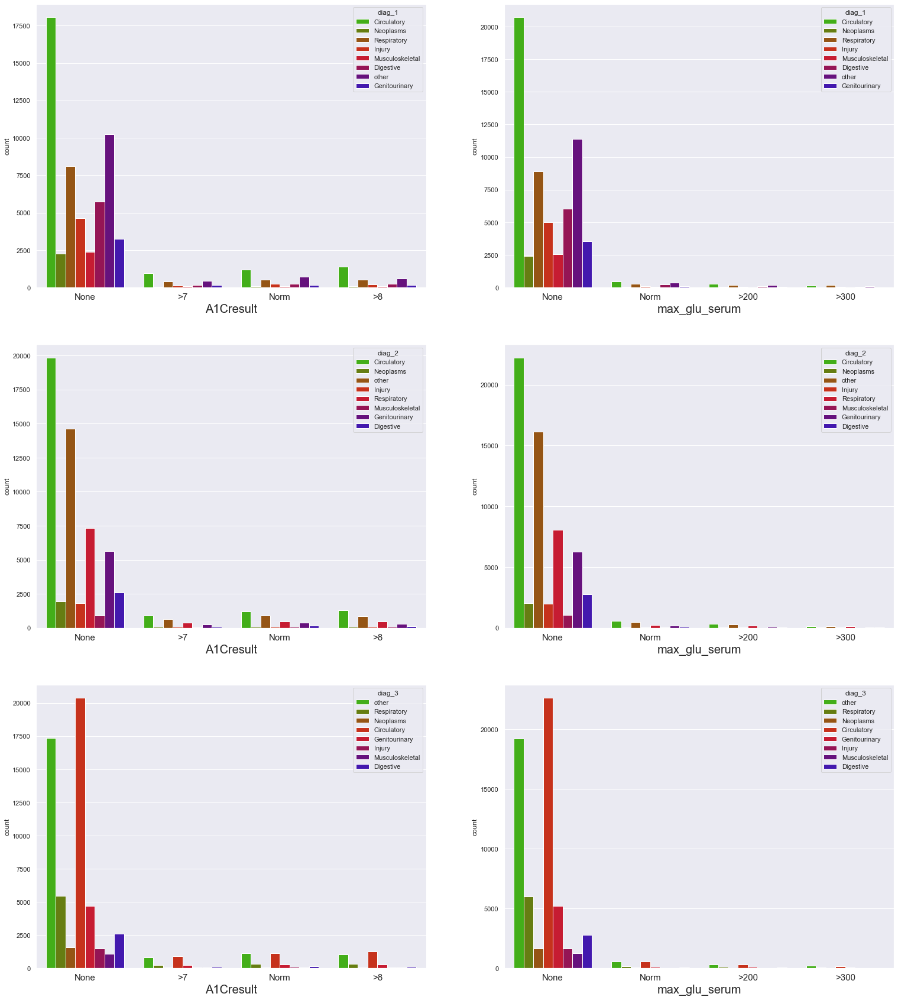

In [155]:
plt.figure(figsize=(26,30))
count =0
for i in diagnosis_list:
    for j in primary_tests_list:
        plt.subplot(3,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.countplot(x=j, hue=i,data=df_visual_non_diabetic, palette='brg_r');
        count = count+1

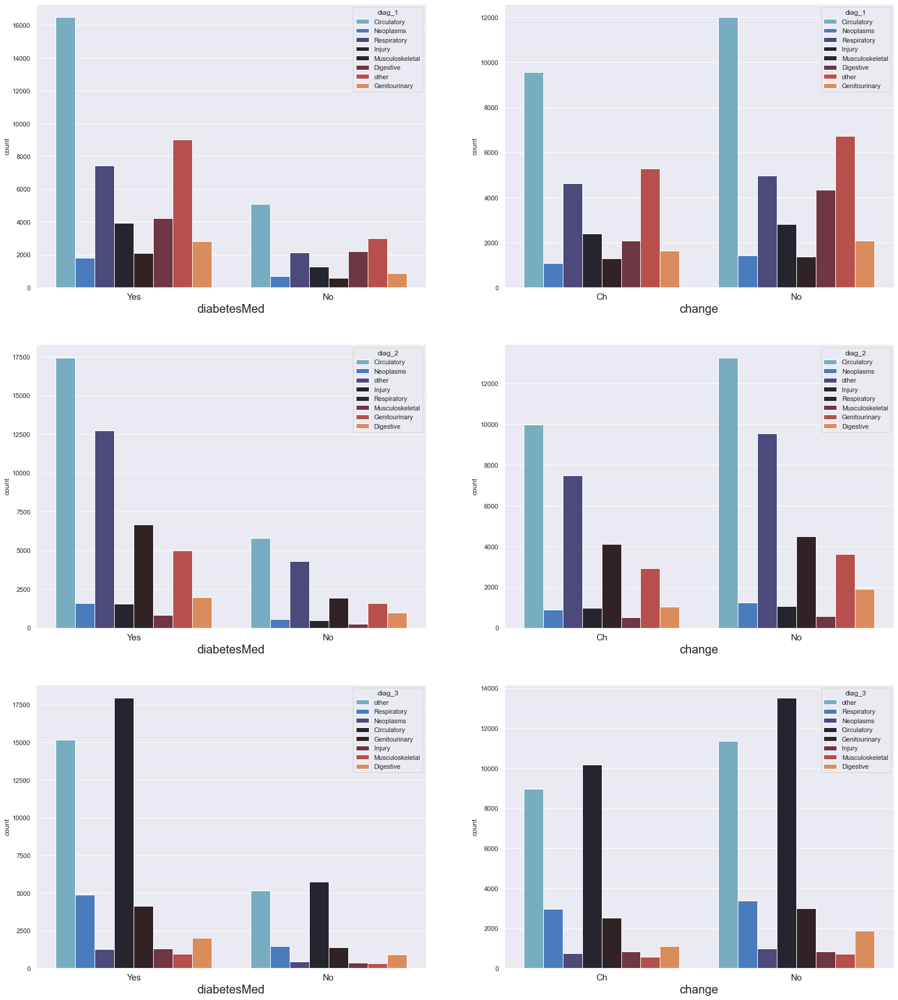

In [156]:
plt.figure(figsize=(26,30))
count =0
for i in diagnosis_list:
    for j in medication_changes_list:
        plt.subplot(3,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.countplot(x=j, hue=i,data=df_visual_non_diabetic, palette='icefire');
        count = count+1

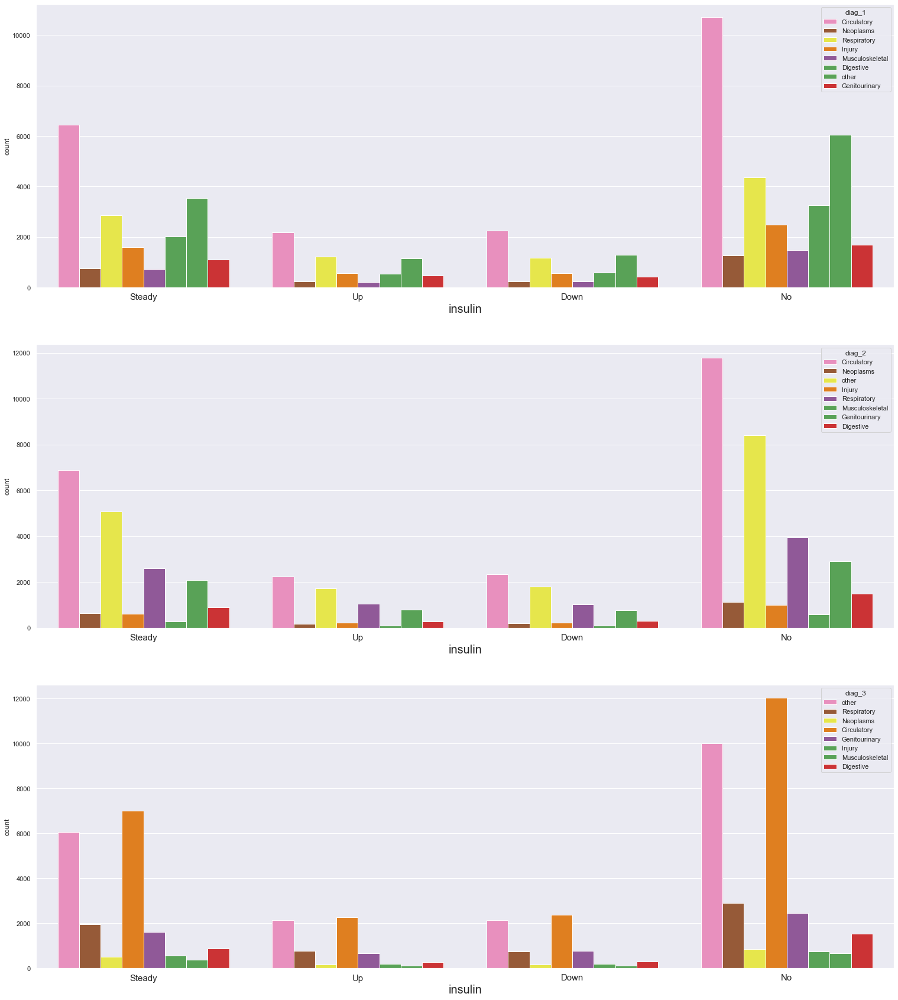

In [157]:
plt.figure(figsize=(26,30))
count =0
for i in diagnosis_list:
    plt.subplot(3,1,count+1)
    plt.xticks(fontsize=15)
    plt.xlabel(i,fontsize=20)
    sns.countplot(x='insulin', hue=i,data=df_visual_non_diabetic, palette='Set1_r');
    count = count+1

### PRIMARY TESTS VS REST

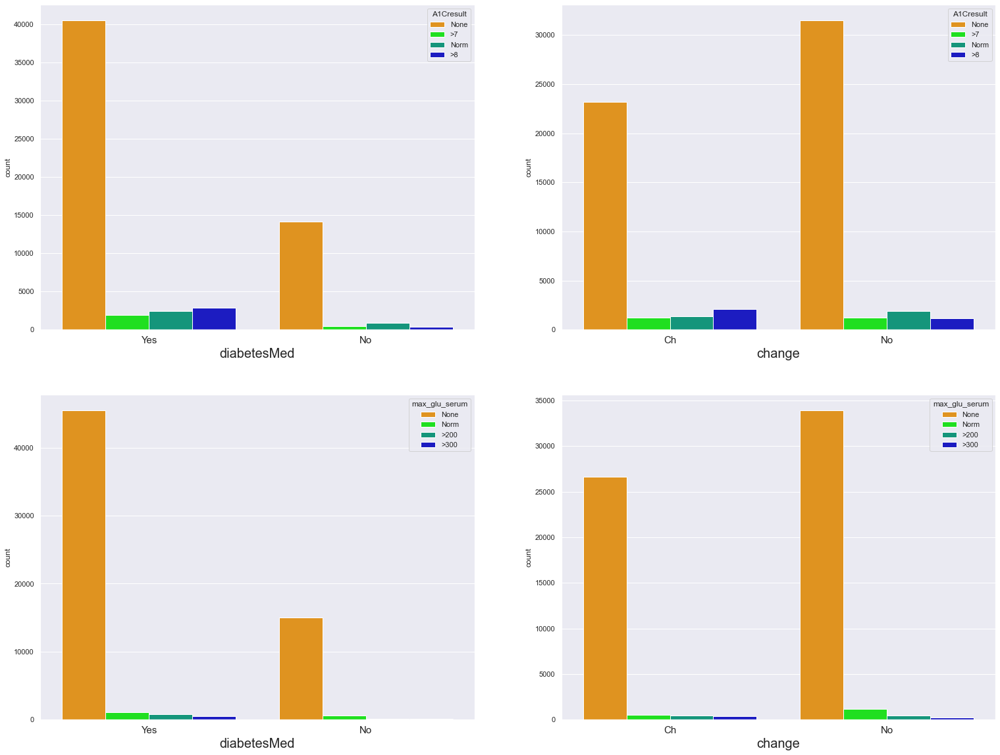

In [158]:
plt.figure(figsize=(26,20))
count =0
for i in primary_tests_list:
    for j in medication_changes_list:
        plt.subplot(2,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.countplot(x=j, hue=i,data=df_visual_non_diabetic, palette='nipy_spectral_r');
        count = count+1

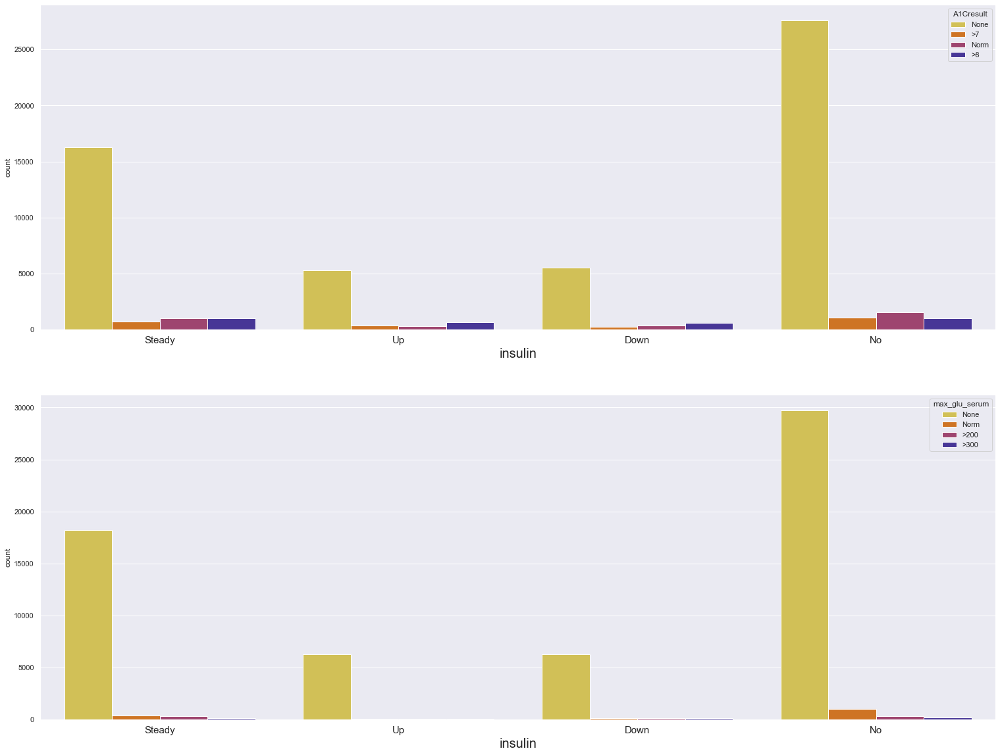

In [159]:
plt.figure(figsize=(26,20))
count =0
for i in primary_tests_list:
    plt.subplot(2,1,count+1)
    plt.xticks(fontsize=15)
    plt.xlabel(i,fontsize=20)
    sns.countplot(x='insulin', hue=i,data=df_visual_non_diabetic, palette='CMRmap_r');
    count = count+1

In [160]:
# reduced level of insulin for older people should be taken into consideration..doctors have to study..

In [161]:
# patient_demographics_list,hospital_formalities , drugs,diagnosis_list,primary_tests_list,medication_changes_list

In [162]:
# Have all the diabetic patients provided with insulin?

In [163]:
# comparison between patients who were not administered any drug and their diagnosis

### NUMERICAL FEATURES VS CATEGORICAL FEATURES

### patient_demographics_list vs Number_of_hospital_formalities 

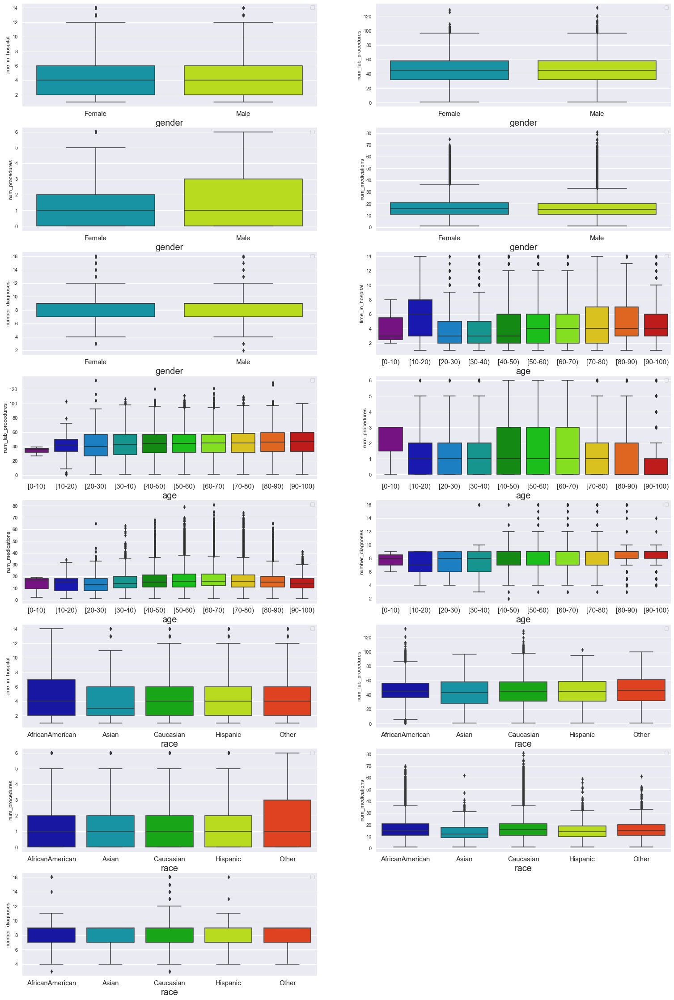

In [164]:
plt.figure(figsize=(26,40))
count =0
for i in patient_demographics_list:
    for j in number_of_hospital_formalities:
        plt.subplot(8,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='nipy_spectral')
        count += 1

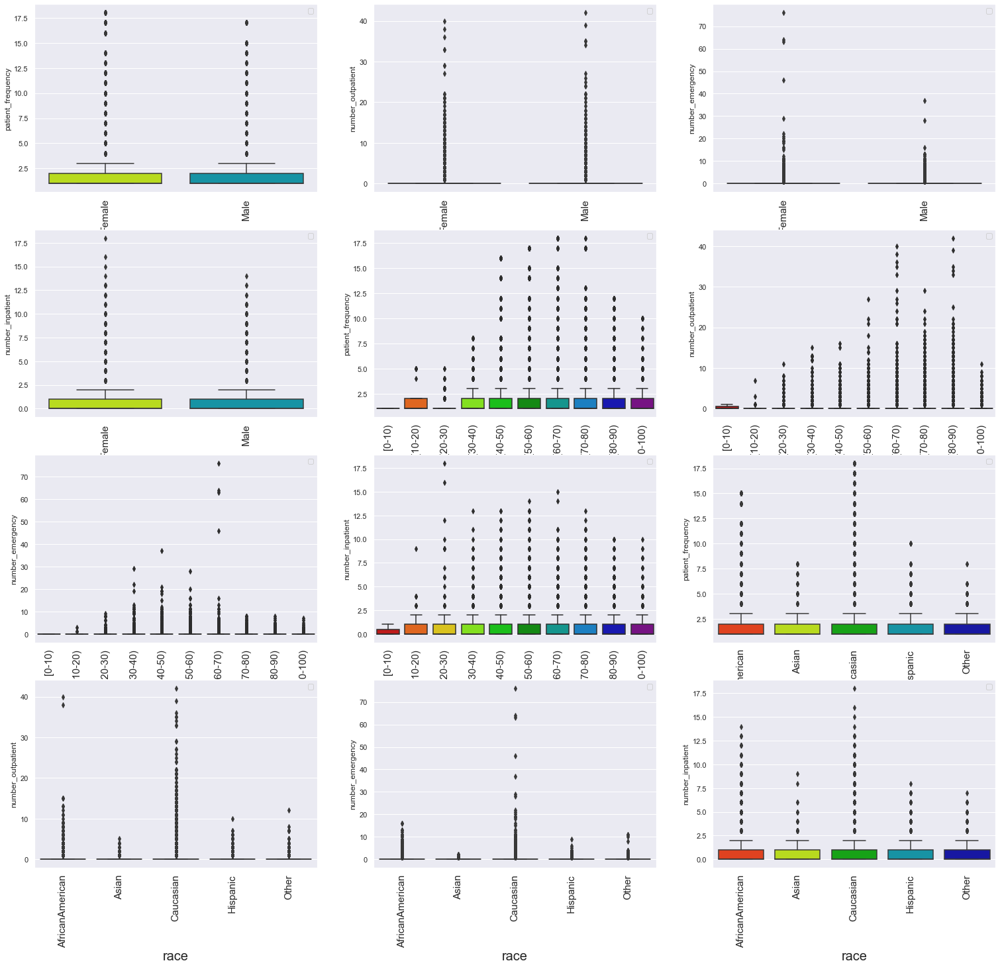

In [165]:
plt.figure(figsize=(26,24))
count =0
for i in patient_demographics_list:
    for j in number_of_visits:
        plt.subplot(4,3,count+1)
        plt.xticks(rotation=90,fontsize=15)
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='nipy_spectral_r')
        count += 1

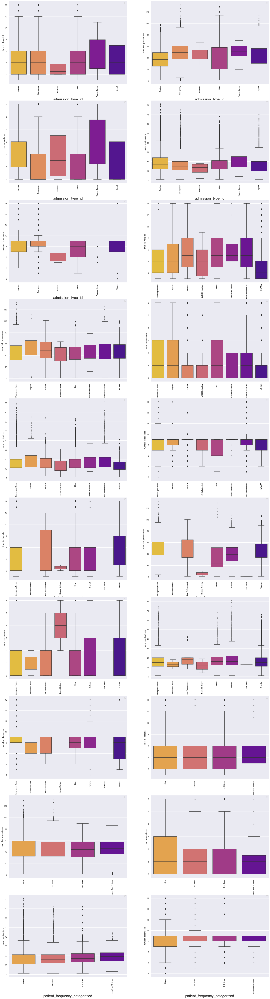

In [166]:
plt.figure(figsize=(26,100))
count =0
for i in patient_formalities_list:
    for j in number_of_hospital_formalities:
        plt.subplot(10,2,count+1)
        plt.xticks(rotation=90,fontsize=9,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='plasma_r')
        count += 1

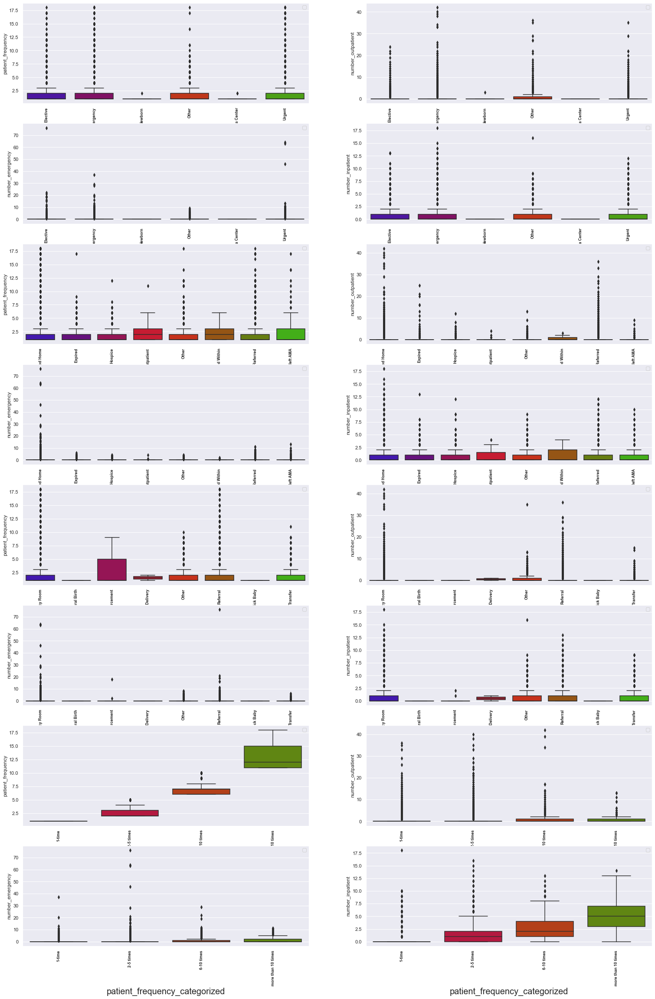

In [167]:
plt.figure(figsize=(26,40))
fig.tight_layout()
count =0
for i in patient_formalities_list:
    for j in number_of_visits:
        plt.subplot(8,2,count+1,)
        plt.xticks(rotation=90,fontsize=9,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='brg')
        count += 1

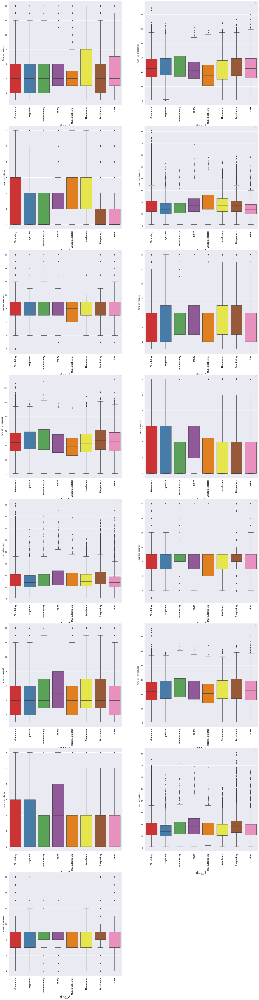

In [168]:
plt.figure(figsize=(26,104))
fig.tight_layout()
count =0
for i in diagnosis_list:
    for j in number_of_hospital_formalities:
        plt.subplot(8,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='Set1')
        count += 1

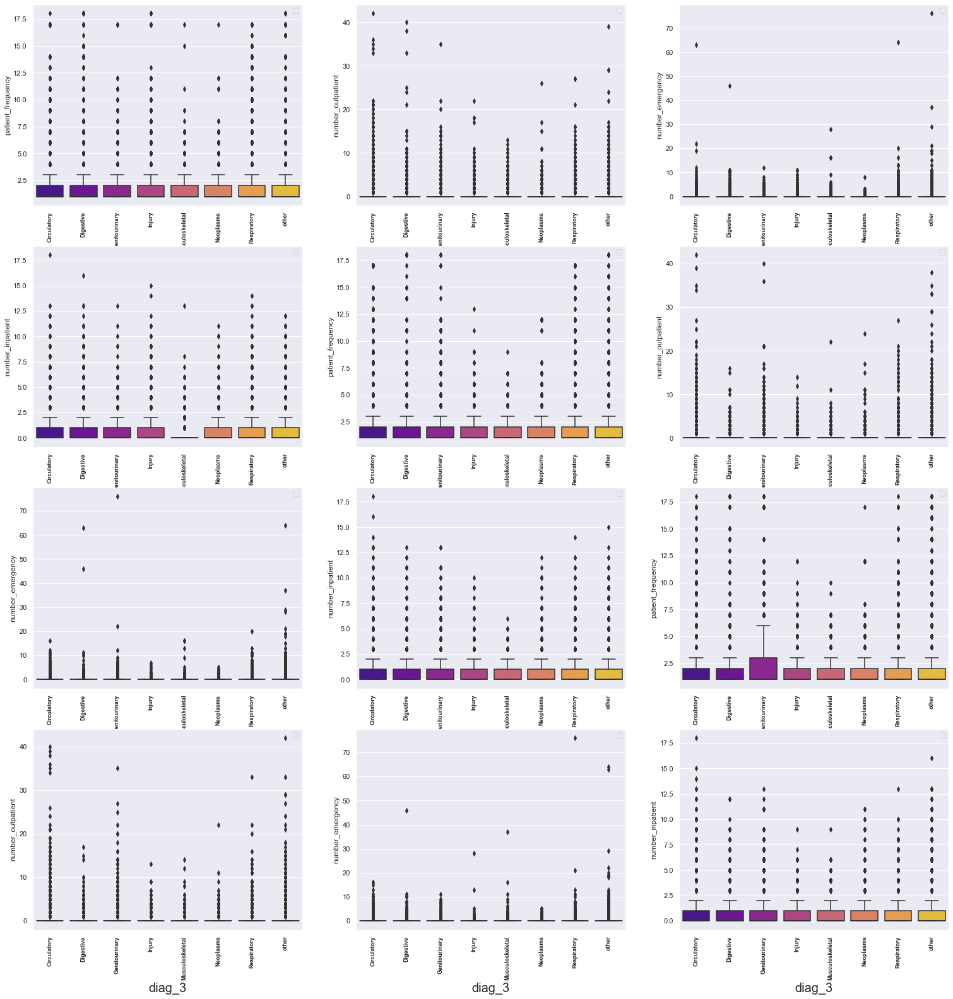

In [169]:
plt.figure(figsize=(26,27))
fig.tight_layout()
count =0
for i in diagnosis_list:
    for j in number_of_visits:
        plt.subplot(4,3,count+1,)
        plt.xticks(rotation=90,fontsize=9,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='plasma')
        count += 1

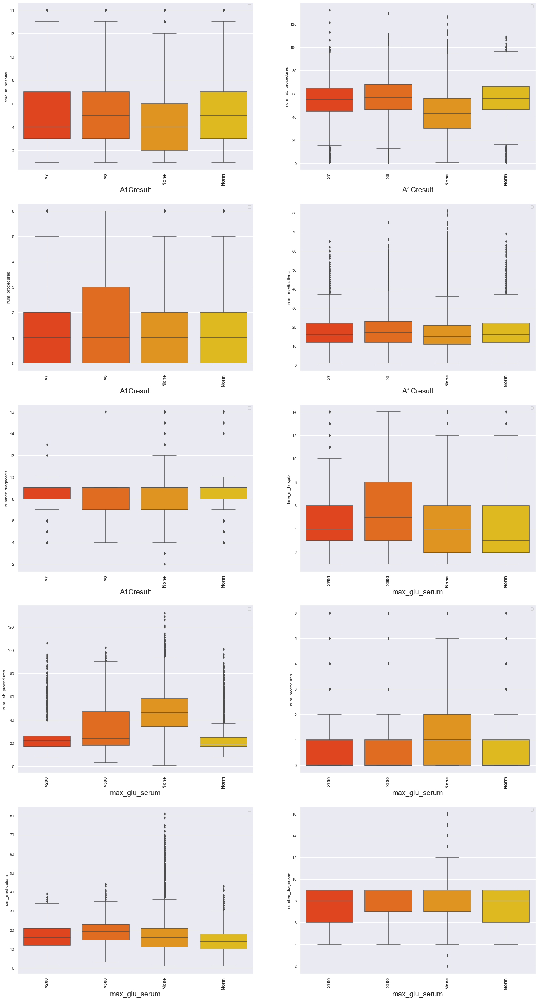

In [170]:
plt.figure(figsize=(26,50))
fig.tight_layout()
count =0
for i in primary_tests_list:
    for j in number_of_hospital_formalities:
        plt.subplot(5,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='autumn')
        count += 1

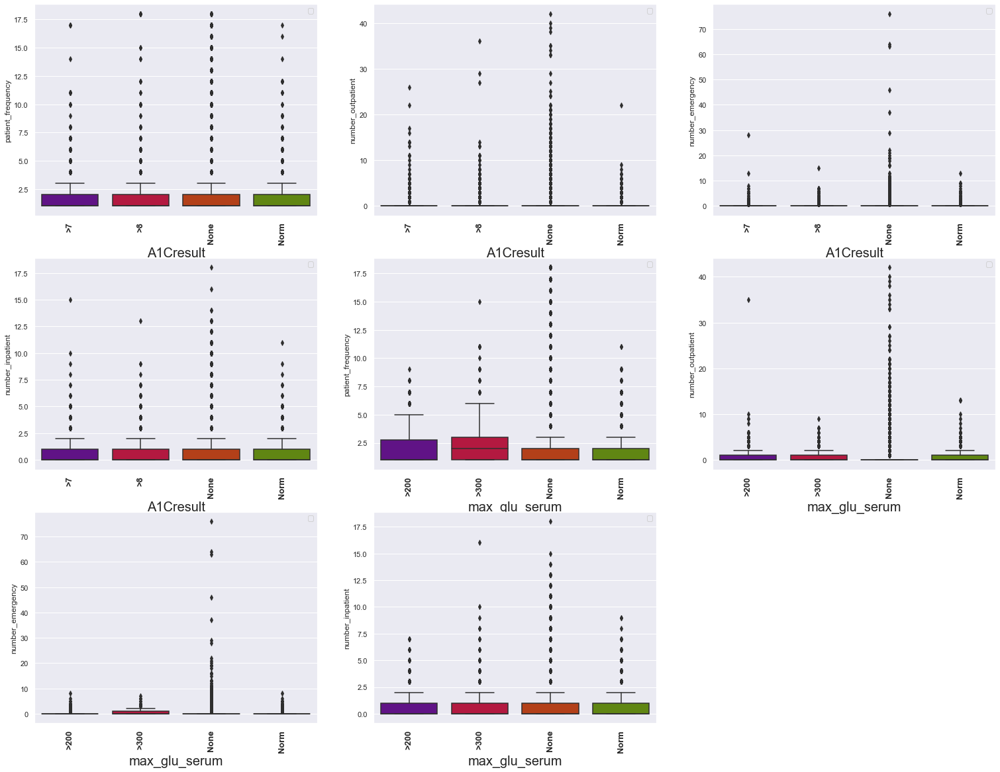

In [171]:
plt.figure(figsize=(26,20))
fig.tight_layout()
count =0
for i in primary_tests_list:
    for j in number_of_visits:
        plt.subplot(3,3,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='brg')
        count += 1

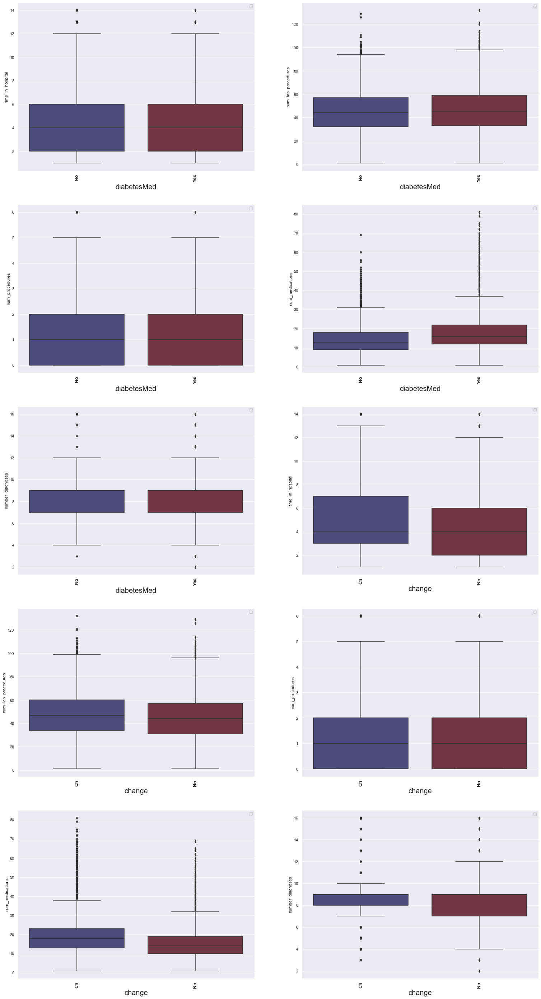

In [172]:
plt.figure(figsize=(26,50))
fig.tight_layout()
count =0
for i in medication_changes_list:
    for j in number_of_hospital_formalities:
        plt.subplot(5,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='icefire')
        count += 1

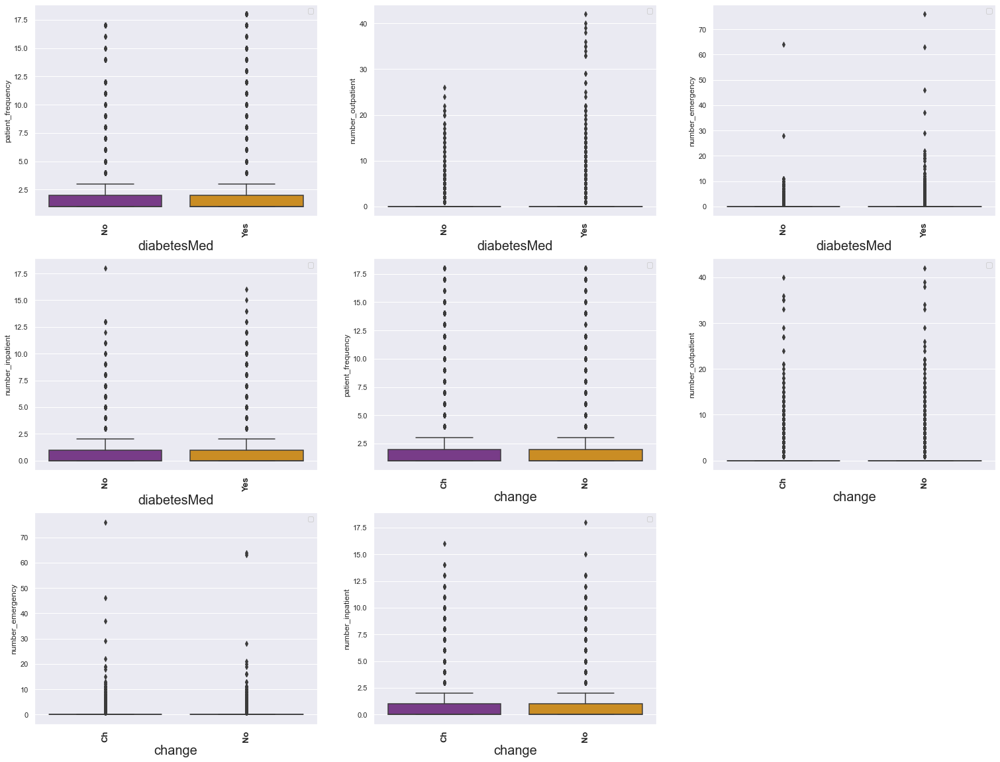

In [173]:
plt.figure(figsize=(26,20))
fig.tight_layout()
count =0
for i in medication_changes_list:
    for j in number_of_visits:
        plt.subplot(3,3,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='CMRmap')
        count += 1

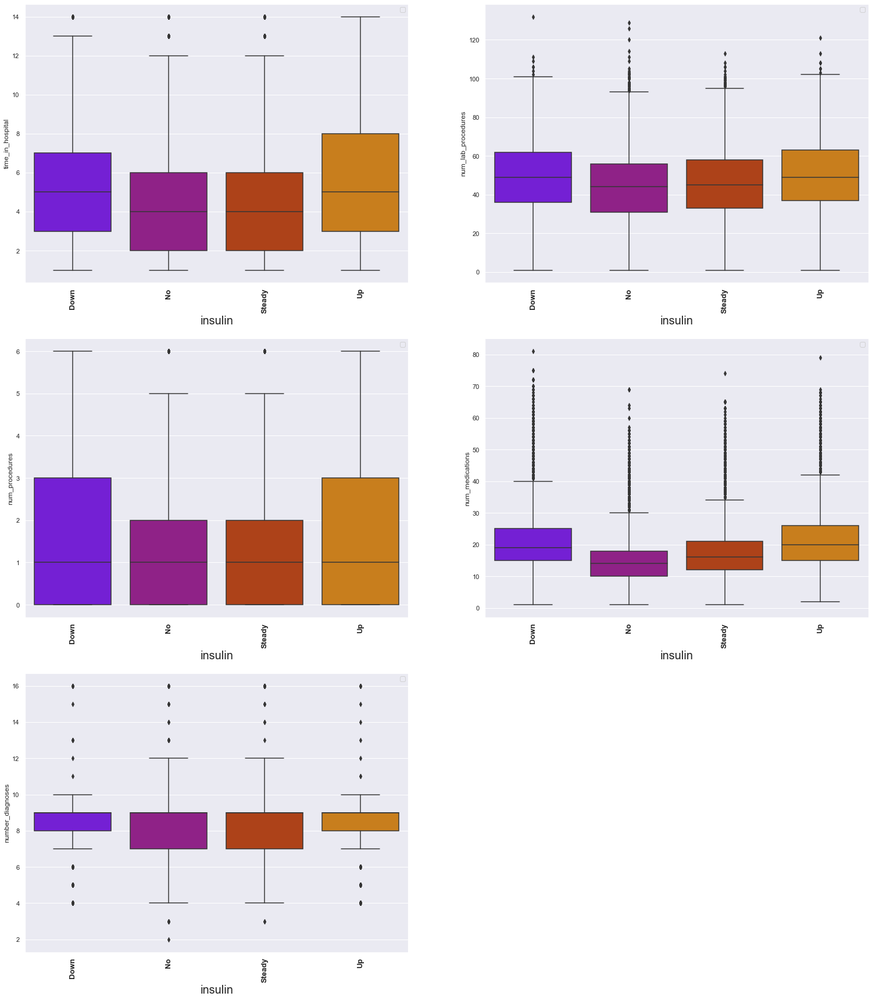

In [174]:
plt.figure(figsize=(26,30))
fig.tight_layout()
count =0
for i in ['insulin']:
    for j in number_of_hospital_formalities:
        plt.subplot(3,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='gnuplot')
        count += 1

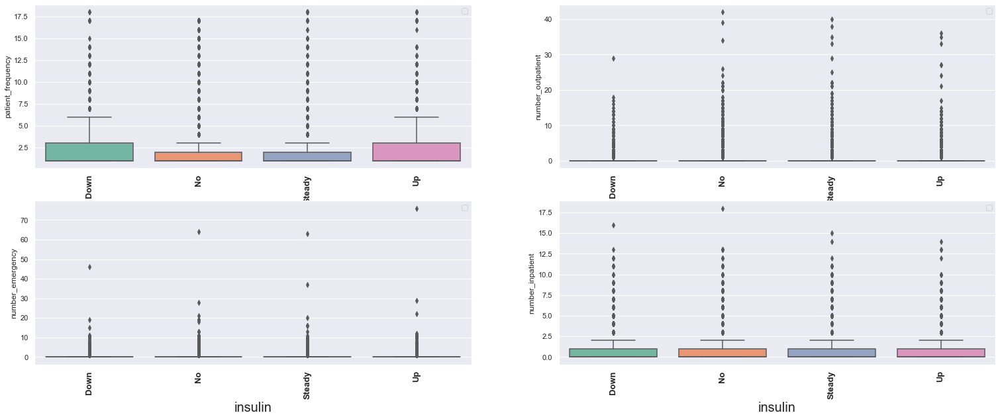

In [175]:
plt.figure(figsize=(26,10))
fig.tight_layout()
count =0
for i in ['insulin']:
    for j in number_of_visits:
        plt.subplot(2,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='Set2')
        count += 1

# MULTIVARIATE ANALYSIS

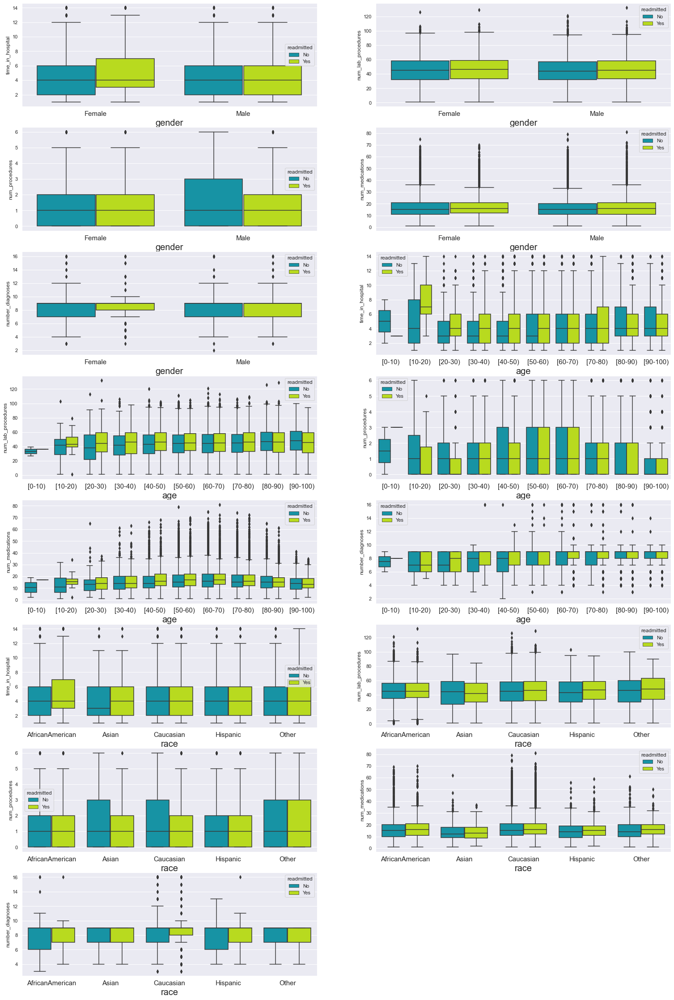

In [176]:
plt.figure(figsize=(26,40))
count =0
for i in patient_demographics_list:
    for j in number_of_hospital_formalities:
        plt.subplot(8,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),hue='readmitted',palette='nipy_spectral')
        count += 1

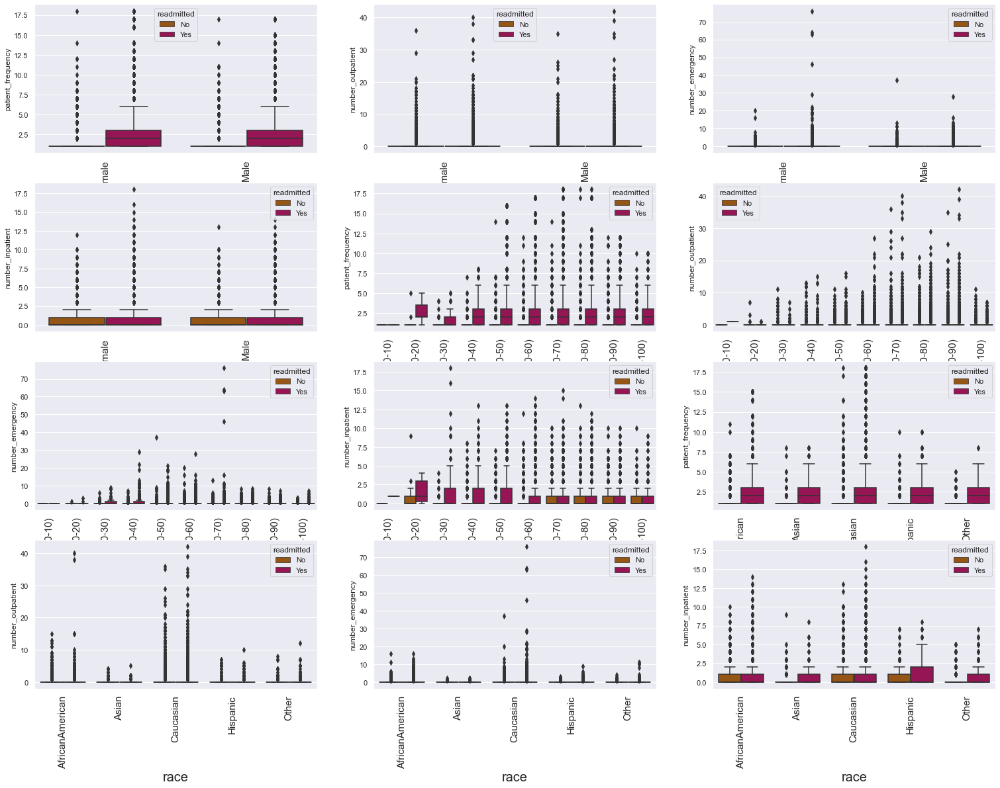

In [177]:
plt.figure(figsize=(26,24))
count =0
for i in patient_demographics_list:
    for j in number_of_visits:
        plt.subplot(5,3,count+1)
        plt.xticks(rotation=90,fontsize=15)
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='brg_r',hue='readmitted')
        count += 1

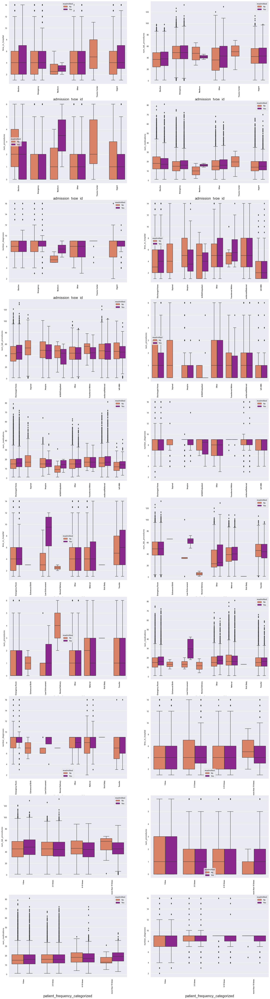

In [178]:
plt.figure(figsize=(26,100))
count =0
for i in patient_formalities_list:
    for j in number_of_hospital_formalities:
        plt.subplot(10,2,count+1)
        plt.xticks(rotation=90,fontsize=9,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='plasma_r',hue='readmitted')
        count += 1

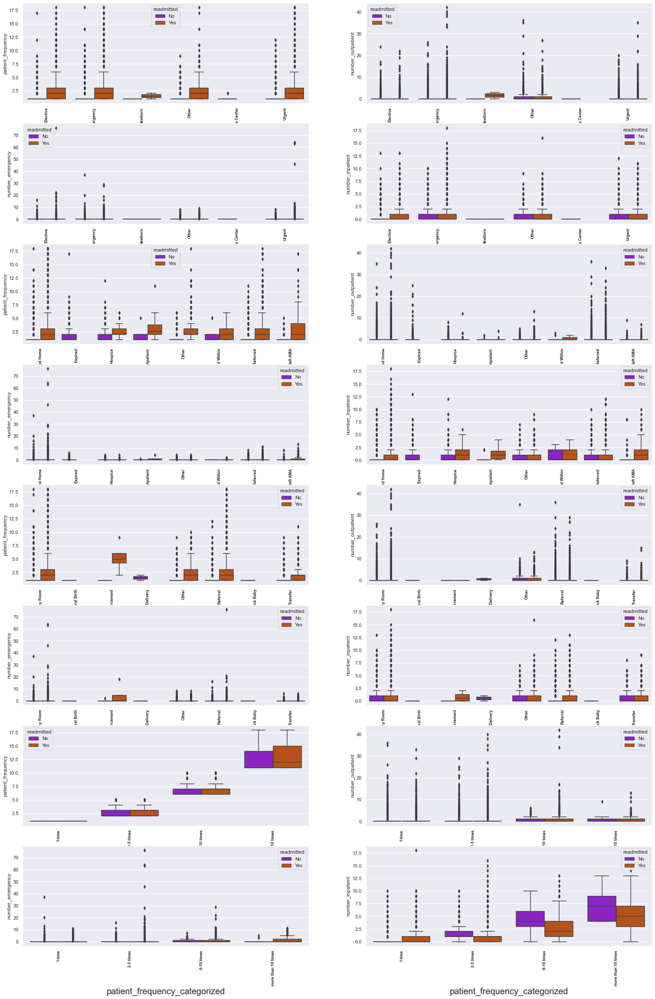

In [179]:
plt.figure(figsize=(26,40))
fig.tight_layout()
count =0
for i in patient_formalities_list:
    for j in number_of_visits:
        plt.subplot(8,2,count+1,)
        plt.xticks(rotation=90,fontsize=9,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='gnuplot',hue='readmitted')
        count += 1

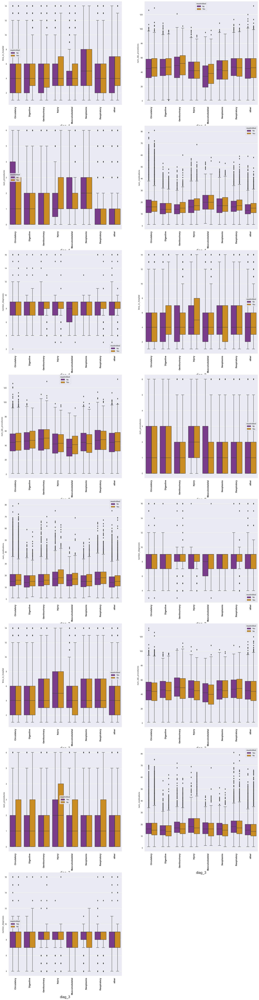

In [180]:
plt.figure(figsize=(26,104))
fig.tight_layout()
count =0
for i in diagnosis_list:
    for j in number_of_hospital_formalities:
        plt.subplot(8,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='CMRmap',hue='readmitted')
        count += 1

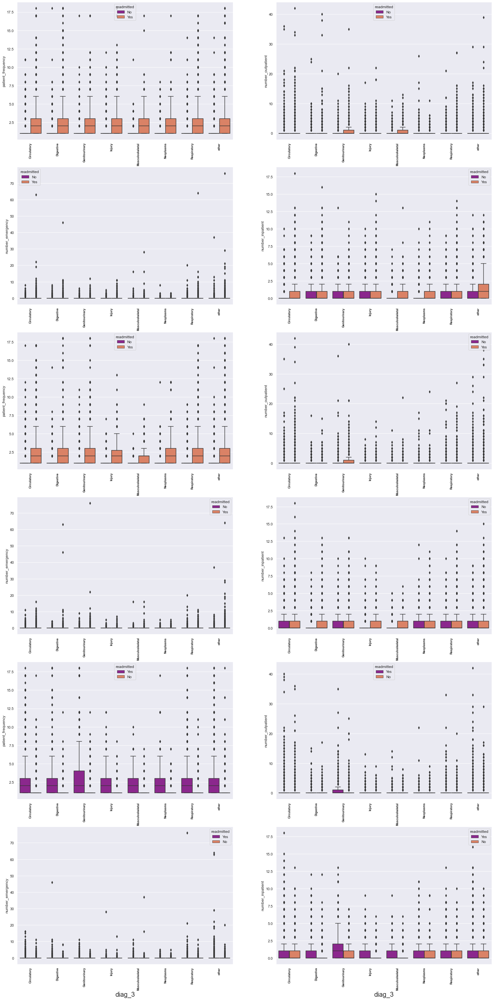

In [181]:
plt.figure(figsize=(26,54))
fig.tight_layout()
count =0
for i in diagnosis_list:
    for j in number_of_visits:
        plt.subplot(6,2,count+1,)
        plt.xticks(rotation=90,fontsize=9,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='plasma',hue='readmitted')
        count += 1

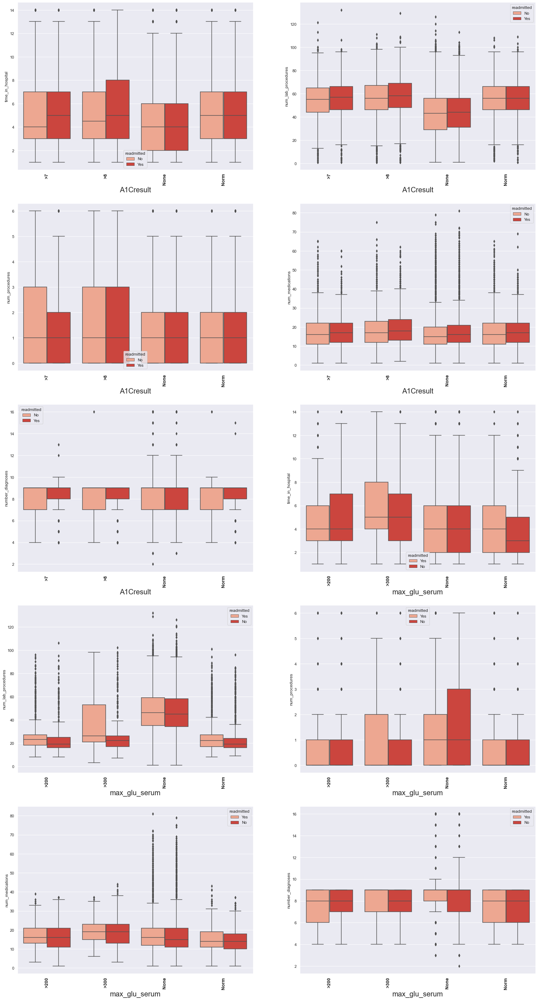

In [182]:
plt.figure(figsize=(26,50))
fig.tight_layout()
count =0
for i in primary_tests_list:
    for j in number_of_hospital_formalities:
        plt.subplot(5,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='Reds',hue='readmitted')
        count += 1

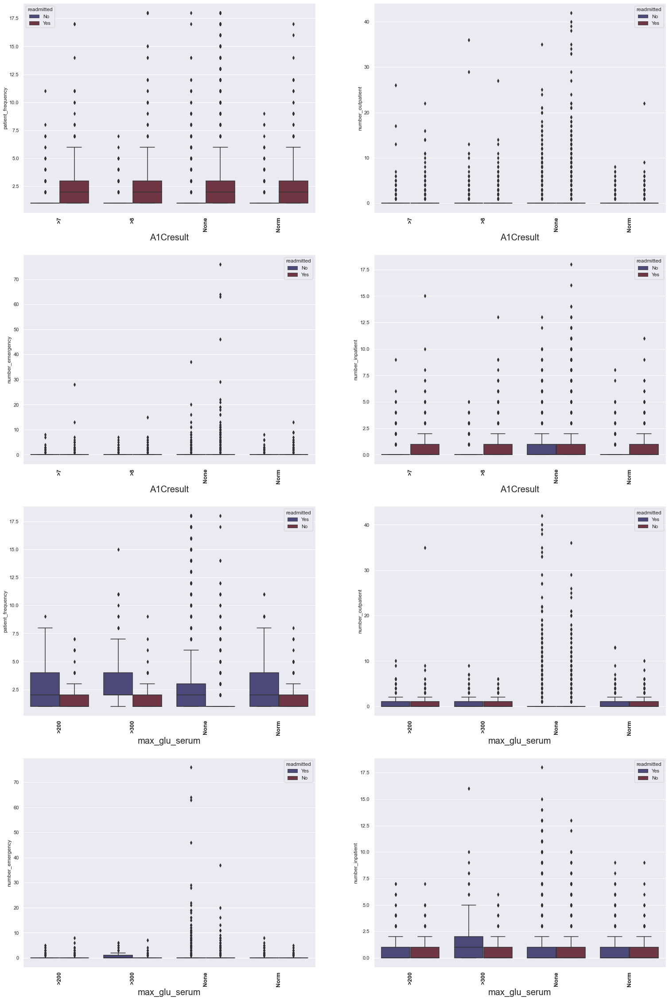

In [183]:
plt.figure(figsize=(26,40))
fig.tight_layout()
count =0
for i in primary_tests_list:
    for j in number_of_visits:
        plt.subplot(4,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='icefire',hue='readmitted')
        count += 1

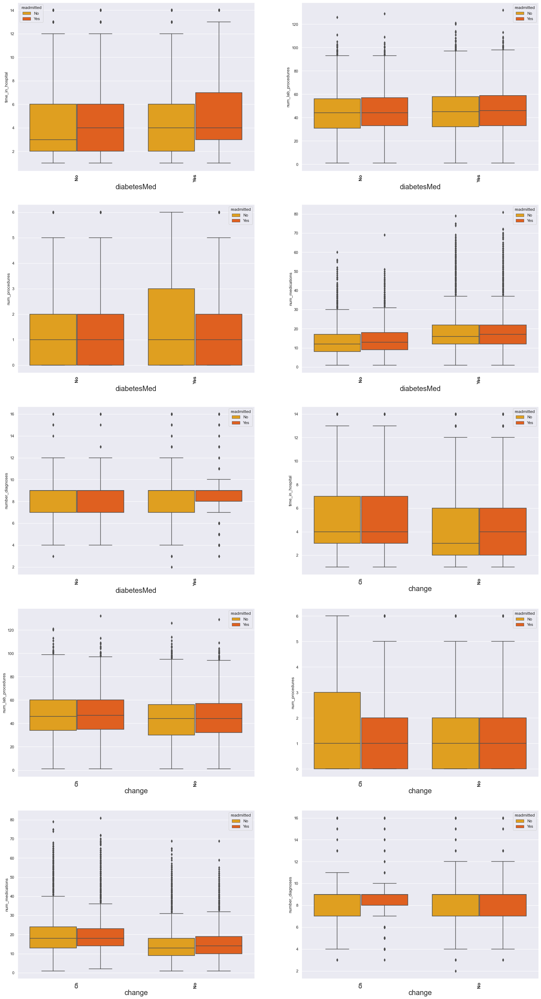

In [184]:
plt.figure(figsize=(26,50))
fig.tight_layout()
count =0
for i in medication_changes_list:
    for j in number_of_hospital_formalities:
        plt.subplot(5,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='autumn_r',hue='readmitted')
        count += 1

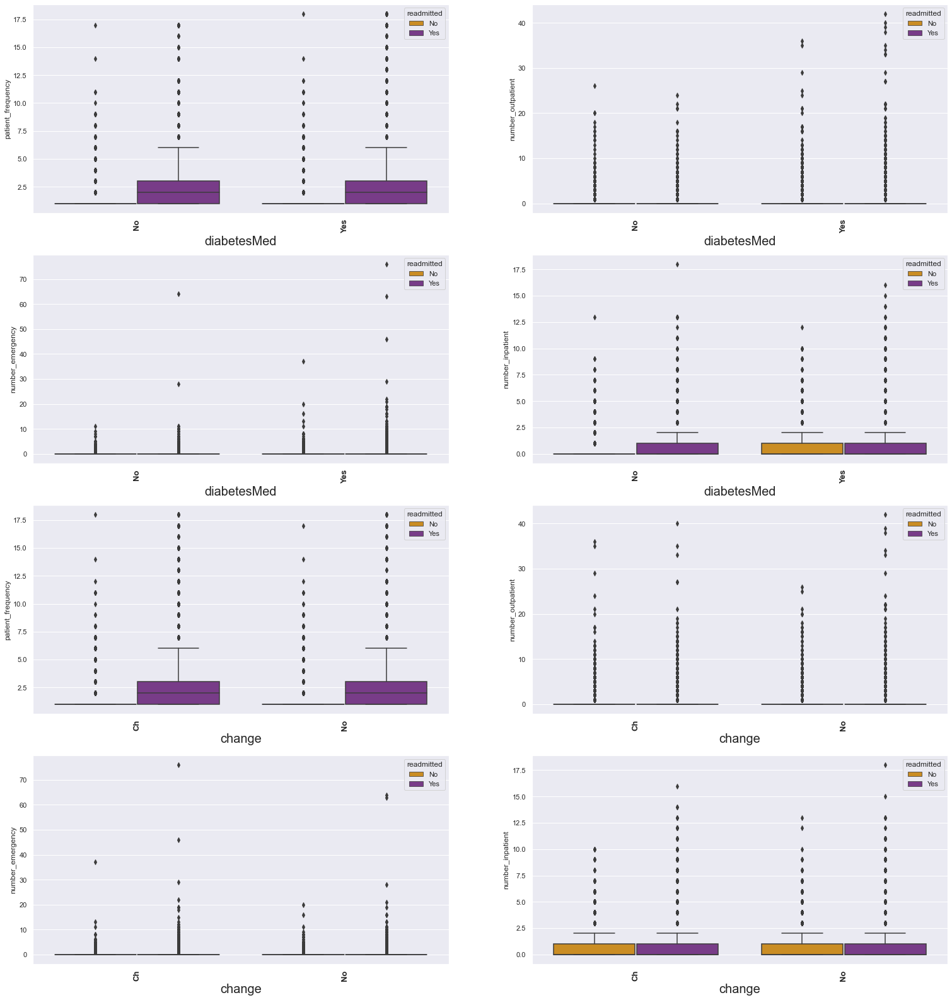

In [185]:
plt.figure(figsize=(26,28))
fig.tight_layout()
count =0
for i in medication_changes_list:
    for j in number_of_visits:
        plt.subplot(4,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='CMRmap_r',hue='readmitted')
        count += 1

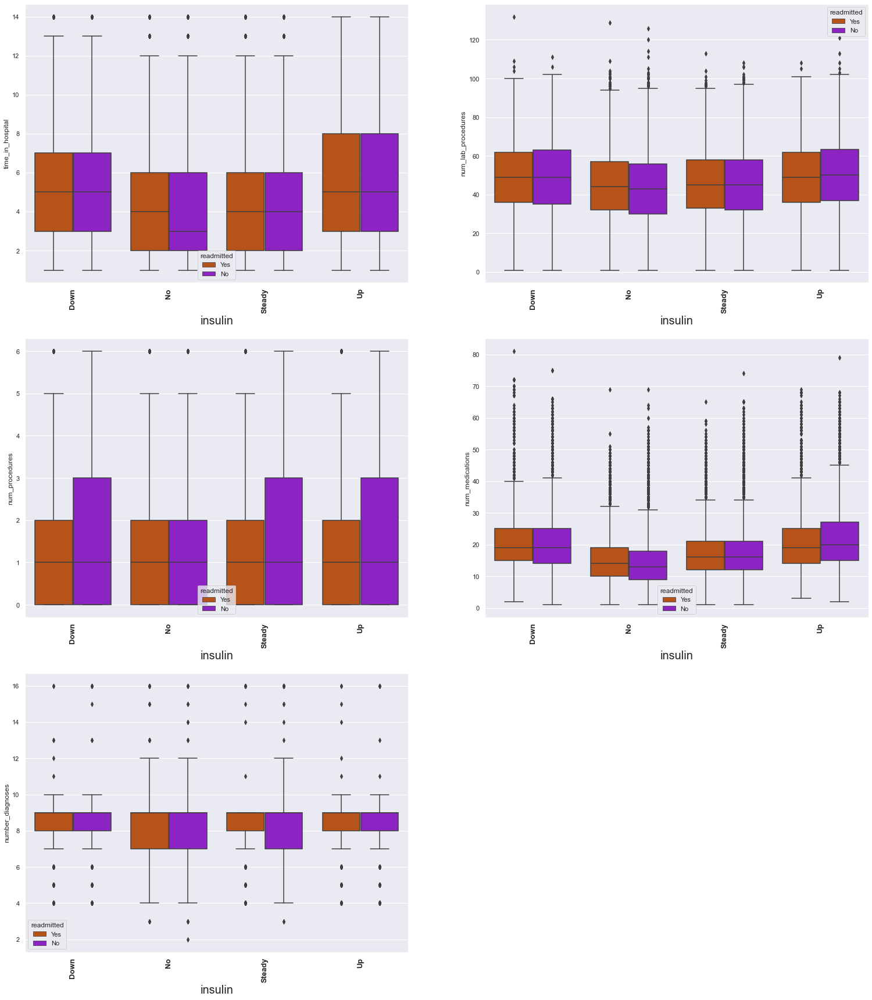

In [186]:
plt.figure(figsize=(26,30))
fig.tight_layout()
count =0
for i in ['insulin']:
    for j in number_of_hospital_formalities:
        plt.subplot(3,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='gnuplot_r',hue='readmitted')
        count += 1

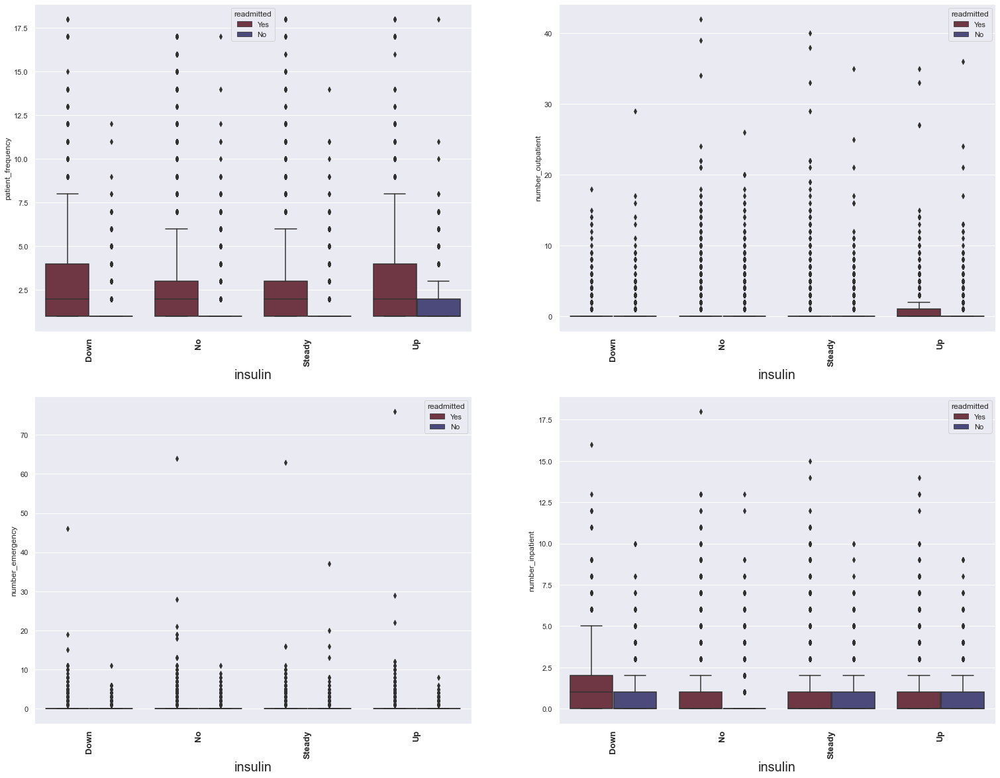

In [187]:
plt.figure(figsize=(26,20))
fig.tight_layout()
count =0
for i in ['insulin']:
    for j in number_of_visits:
        plt.subplot(2,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_non_diabetic.sort_values(i),palette='icefire_r',hue='readmitted')
        count += 1

### BUSINESS INTERPRETATION AND INSIGHTS

### INSIGHTS THAT ARE FOUND USING PREVIOUS ANALYSIS

### FINDING THE CAUSE FOR EVENTS.. 

In [188]:
df_visual_non_diabetic[(df_visual_non_diabetic['diag_1'].isnull()) & (df_visual_non_diabetic['diag_1'].isnull()) & (df_visual_non_diabetic['diag_1'].isnull())]

,patient_frequency,patient_nbr,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,patient_frequency_categorized


In [189]:
# Understanding Expired Patients wrt their disorders

In [190]:
df_visual_non_diabetic[df_visual_non_diabetic['discharge_disposition_id']=='Expired']['readmitted'].value_counts()

No    1388
Name: readmitted, dtype: int64

In [191]:
df_visual_non_diabetic[df_visual_non_diabetic['discharge_disposition_id']=='Hospice']['readmitted'].value_counts()

No     604
Yes     70
Name: readmitted, dtype: int64

In [192]:
diag_tab_expired = pd.DataFrame(df_visual_non_diabetic[df_visual_non_diabetic['discharge_disposition_id']=='Expired']['diag_1'].value_counts())

In [193]:
diag_tab_expired['diag_2'] = df_visual_non_diabetic[df_visual_non_diabetic['discharge_disposition_id']=='Expired']['diag_2'].value_counts()

In [194]:
diag_tab_expired['diag_3'] = df_visual_non_diabetic[df_visual_non_diabetic['discharge_disposition_id']=='Expired']['diag_3'].value_counts()

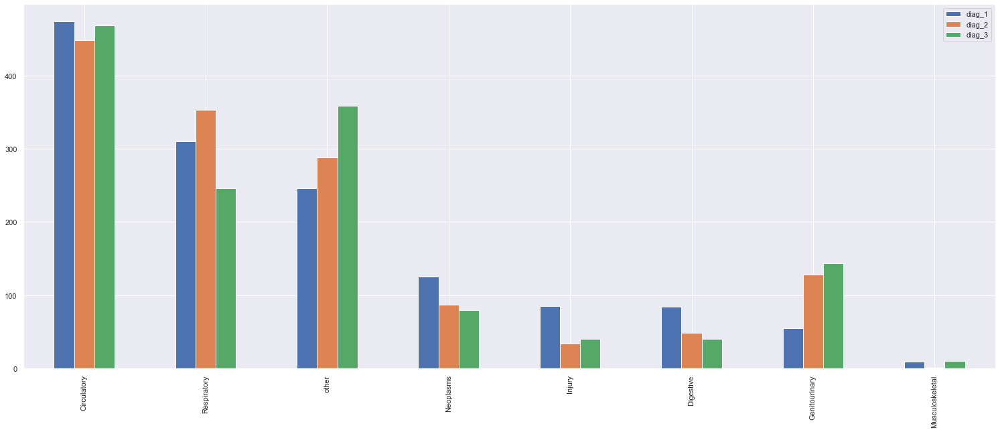

In [195]:
diag_tab_expired.plot(kind='bar',figsize=(26,10));

In [196]:
# From the above graph we could say that many patients who expired had Circulatory disorder...But the ratio of circulatory
# patients is also considerably high

In [197]:
fatality_percent_diag_1 = {}
fatality_percent_diag_2 = {}
fatality_percent_diag_3 = {}
for cat in df_visual_non_diabetic['diag_1'].unique():
    fatality_percent_diag_1.update({cat:100*(len(df_visual_non_diabetic[(df_visual_non_diabetic['diag_1']==cat) & (df_visual_non_diabetic['discharge_disposition_id']=='Expired')])/len(df_visual_non_diabetic[df_visual_non_diabetic['diag_1']==cat]))})
    fatality_percent_diag_2.update({cat:100*(len(df_visual_non_diabetic[(df_visual_non_diabetic['diag_2']==cat) & (df_visual_non_diabetic['discharge_disposition_id']=='Expired')])/len(df_visual_non_diabetic[df_visual_non_diabetic['diag_2']==cat]))})
    fatality_percent_diag_3.update({cat:100*(len(df_visual_non_diabetic[(df_visual_non_diabetic['diag_3']==cat) & (df_visual_non_diabetic['discharge_disposition_id']=='Expired')])/len(df_visual_non_diabetic[df_visual_non_diabetic['diag_3']==cat]))})
    

In [198]:
fatality_percent = pd.DataFrame()
for key in fatality_percent_diag_1:
    fatality_percent[key]=[fatality_percent_diag_1[key],fatality_percent_diag_2[key],fatality_percent_diag_3[key]]
    

In [199]:
fatality_percent = fatality_percent.T

In [200]:
fatality_percent.columns=['diag_1','diag_2','diag_3']

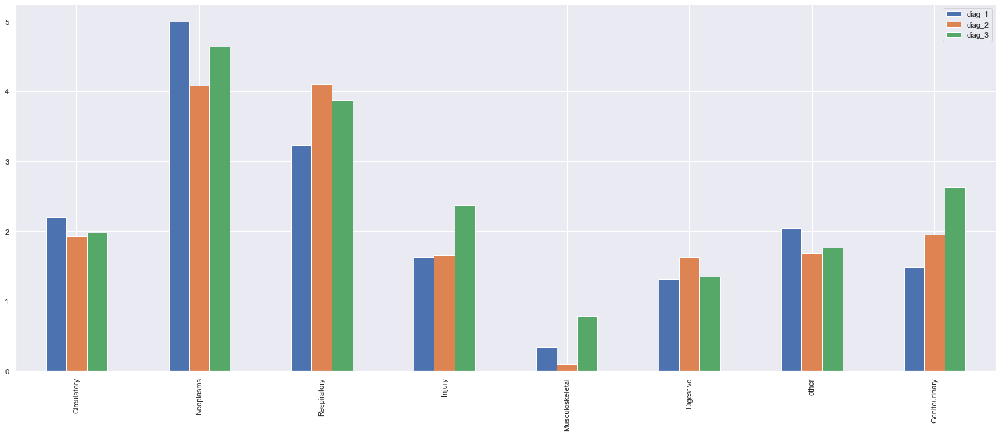

In [201]:
fatality_percent.plot(kind='bar',figsize=(26,10));

In [202]:
# the above plot shows the rate of expiration in terms of disease..

In [203]:
# Understandiing transferred Patients wrt their disorders

In [204]:
diag_tab_transferred = pd.DataFrame(df_visual_non_diabetic[df_visual_non_diabetic['discharge_disposition_id']=='Transferred/Referred']['diag_1'].value_counts())

In [205]:
diag_tab_transferred['diag_2'] = df_visual_non_diabetic[df_visual_non_diabetic['discharge_disposition_id']=='Transferred/Referred']['diag_2'].value_counts()

In [206]:
diag_tab_transferred['diag_3'] = df_visual_non_diabetic[df_visual_non_diabetic['discharge_disposition_id']=='Transferred/Referred']['diag_3'].value_counts()

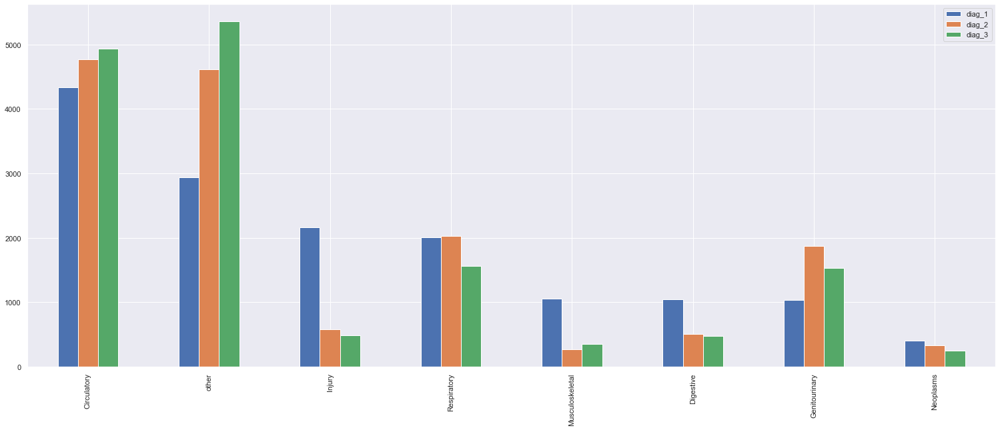

In [207]:
diag_tab_transferred.plot(kind='bar',figsize=(26,10));

In [208]:
# Many patients who were transferred had a circulatory disorder..

In [209]:
transfer_percent_diag_1 = {}
transfer_percent_diag_2 = {}
transfer_percent_diag_3 = {}
for cat in df_visual_non_diabetic['diag_1'].unique():
    transfer_percent_diag_1.update({cat:100*(len(df_visual_non_diabetic[(df_visual_non_diabetic['diag_1']==cat) & (df_visual_non_diabetic['discharge_disposition_id']=='Transferred/Referred')])/len(df_visual_non_diabetic[df_visual_non_diabetic['diag_1']==cat]))})
    transfer_percent_diag_2.update({cat:100*(len(df_visual_non_diabetic[(df_visual_non_diabetic['diag_2']==cat) & (df_visual_non_diabetic['discharge_disposition_id']=='Transferred/Referred')])/len(df_visual_non_diabetic[df_visual_non_diabetic['diag_2']==cat]))})
    transfer_percent_diag_3.update({cat:100*(len(df_visual_non_diabetic[(df_visual_non_diabetic['diag_3']==cat) & (df_visual_non_diabetic['discharge_disposition_id']=='Transferred/Referred')])/len(df_visual_non_diabetic[df_visual_non_diabetic['diag_3']==cat]))})
    

In [210]:
transfer_percent = pd.DataFrame()
for key in transfer_percent_diag_1:
    transfer_percent[key]=[transfer_percent_diag_1[key],transfer_percent_diag_2[key],transfer_percent_diag_3[key]]
    

In [211]:
transfer_percent = transfer_percent.T

In [212]:
transfer_percent.columns=['diag_1','diag_2','diag_3']

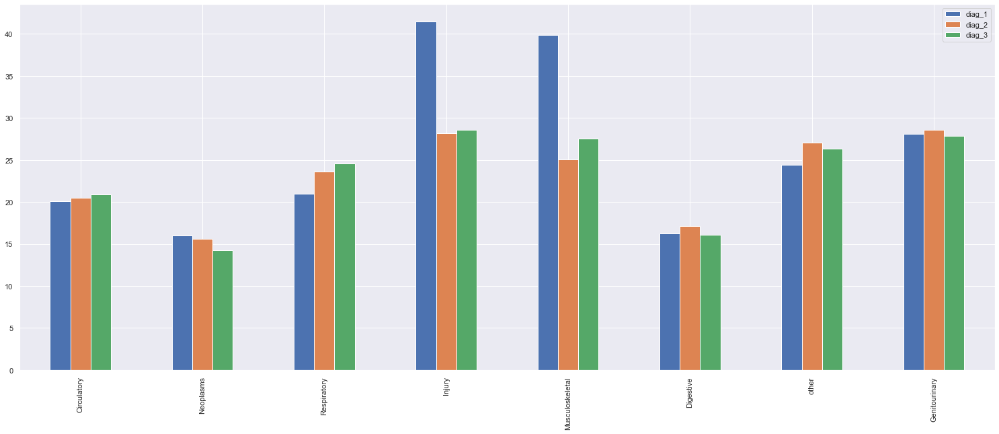

In [213]:
transfer_percent.plot(kind='bar',figsize=(26,10));

In [214]:
# the rate of transfer of patients who were injured and patients who had musculoskeletal disorders is high..

In [215]:
# insulin vs age vs diagnoses vs discharge_disposition_id vs patient_frequency_categorized

In [216]:
pd.crosstab(df_visual_non_diabetic['insulin'],df_visual_non_diabetic['age'])

age,[0-10),[10-20),[20-30),[30-40),[40-50),[50-60),[60-70),[70-80),[80-90),[90-100)
insulin,,,,,,,,,,
Down,0,9,46,168,538,1172,1642,1818,1173,194
No,2,22,151,633,2202,4590,6773,9157,6609,1135
Steady,0,16,85,370,1260,3017,4467,5409,3814,618
Up,1,6,39,125,495,957,1608,1845,1296,211


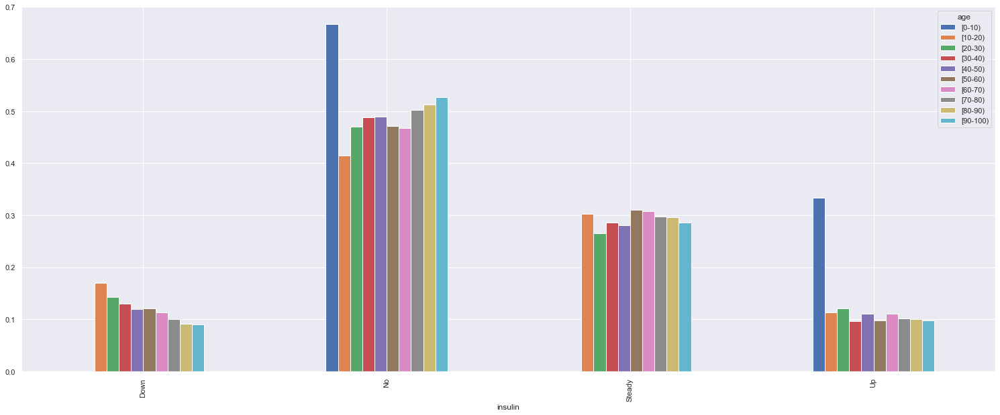

In [217]:
pd.crosstab(df_visual_non_diabetic['insulin'],df_visual_non_diabetic['age'],normalize='columns').plot(kind='bar',figsize=(26,10));

In [218]:
pd.crosstab(df_visual_non_diabetic['insulin'],df_visual_non_diabetic['diag_1'])

diag_1,Circulatory,Digestive,Genitourinary,Injury,Musculoskeletal,Neoplasms,Respiratory,other
insulin,,,,,,,,
Down,2247,587,419,574,227,249,1172,1285
No,10700,3265,1695,2476,1488,1262,4349,6039
Steady,6456,2023,1113,1596,726,746,2864,3532
Up,2174,549,470,567,209,245,1210,1159


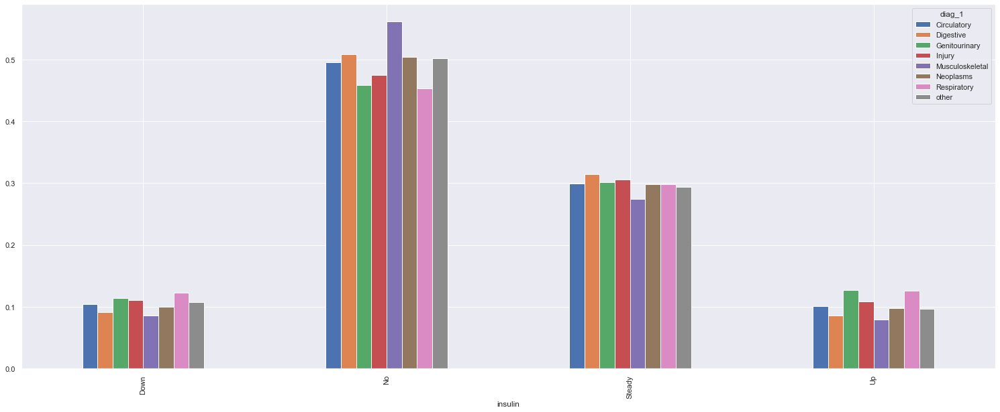

In [219]:
pd.crosstab(df_visual_non_diabetic['insulin'],df_visual_non_diabetic['diag_1'],normalize='columns').plot(kind='bar',figsize=(26,10));

In [220]:
pd.crosstab(df_visual_non_diabetic['insulin'],df_visual_non_diabetic['patient_frequency_categorized'])

patient_frequency_categorized,1-time,2-5 times,6-10 times,more than 10 times
insulin,,,,
Down,3487,2867,333,73
No,19407,10827,822,218
Steady,11763,6725,480,88
Up,3308,2847,372,56


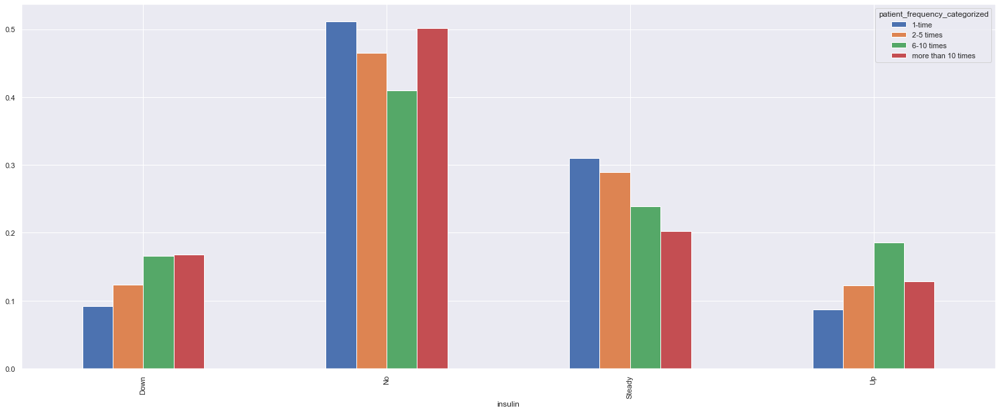

In [221]:
pd.crosstab(df_visual_non_diabetic['insulin'],df_visual_non_diabetic['patient_frequency_categorized'],normalize='columns').plot(kind='bar',figsize=(26,10));

In [222]:
pd.crosstab(df_visual_non_diabetic['age'],df_visual_non_diabetic['diag_1'])

diag_1,Circulatory,Digestive,Genitourinary,Injury,Musculoskeletal,Neoplasms,Respiratory,other
age,,,,,,,,
[0-10),0,0,0,0,0,0,1,2
[10-20),2,4,1,15,0,1,11,19
[20-30),13,41,17,31,5,3,30,181
[30-40),180,155,99,128,35,18,147,534
[40-50),1069,595,249,392,200,160,707,1123
[50-60),3250,1068,446,790,430,361,1492,1899
[60-70),5231,1415,771,1122,730,673,2141,2407
[70-80),6797,1702,1040,1420,816,777,2654,3023
[80-90),4352,1241,895,1094,405,458,2033,2414


In [223]:
# the age group of 1-10 are least prone to any of these diseases..

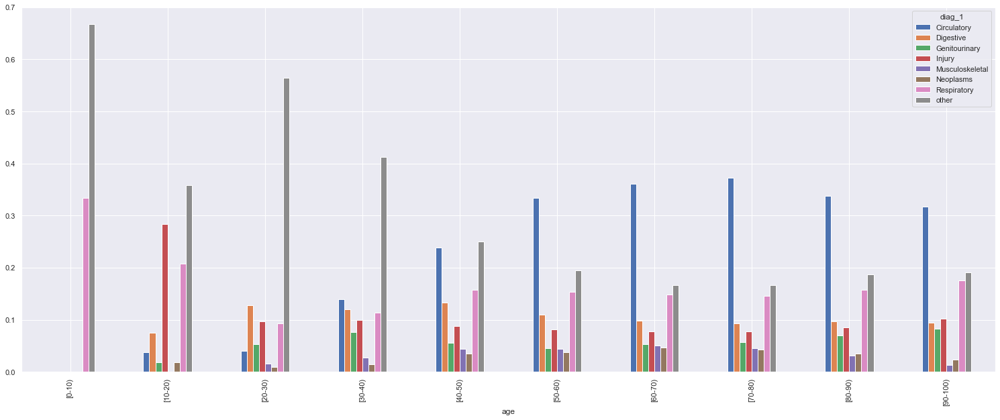

In [224]:
pd.crosstab(df_visual_non_diabetic['age'],df_visual_non_diabetic['diag_1'],normalize='index').plot(kind='bar',figsize=(26,10));

In [225]:
# As age increases people are more prone to circulatory disorder..

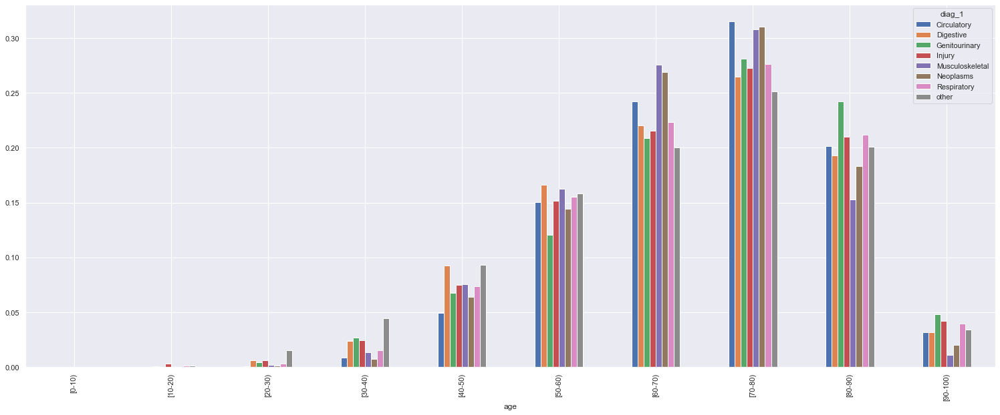

In [226]:
pd.crosstab(df_visual_non_diabetic['age'],df_visual_non_diabetic['diag_1'],normalize='columns').plot(kind='bar',figsize=(26,10));

In [227]:
pd.crosstab(df_visual_non_diabetic['age'],df_visual_non_diabetic['discharge_disposition_id'])

discharge_disposition_id,Discharged Home,Expired,Hospice,In/Still/Outpatient,Other,Transferred Within,Transferred/Referred,left AMA
age,,,,,,,,
[0-10),3,0,0,0,0,0,0,0
[10-20),48,1,0,0,1,0,2,1
[20-30),282,4,1,0,5,0,22,7
[30-40),1109,6,1,0,53,0,102,25
[40-50),3793,44,14,2,198,3,374,67
[50-60),7813,111,39,0,400,1,1277,95
[60-70),11032,260,110,8,594,7,2420,59
[70-80),12051,444,207,5,834,13,4635,40
[80-90),6735,414,233,3,425,18,5044,20


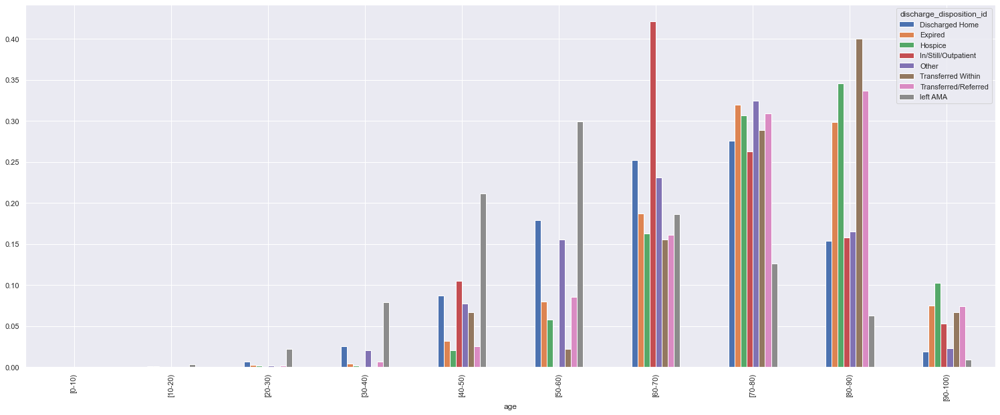

In [228]:
pd.crosstab(df_visual_non_diabetic['age'],df_visual_non_diabetic['discharge_disposition_id'],normalize='columns').plot(kind='bar',figsize=(26,10));

In [229]:
# Many of the inpatients are of the age 60 and above..

In [230]:
pd.crosstab(df_visual_non_diabetic['age'],df_visual_non_diabetic['patient_frequency_categorized'])

patient_frequency_categorized,1-time,2-5 times,6-10 times,more than 10 times
age,,,,
[0-10),3,0,0,0
[10-20),37,16,0,0
[20-30),253,68,0,0
[30-40),907,355,34,0
[40-50),2930,1358,153,54
[50-60),6121,3242,270,103
[60-70),8750,5087,513,140
[70-80),10579,7008,551,91
[80-90),7132,5290,423,47


In [231]:
# add this without inference..

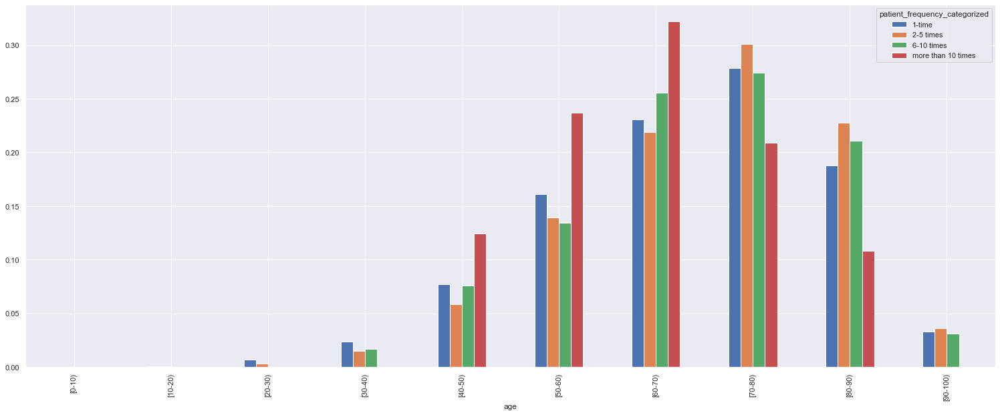

In [232]:
pd.crosstab(df_visual_non_diabetic['age'],df_visual_non_diabetic['patient_frequency_categorized'],normalize='columns').plot(kind='bar',figsize=(26,10));

In [233]:
# Patientss who are 50 and above tend to visit the hospital more often..

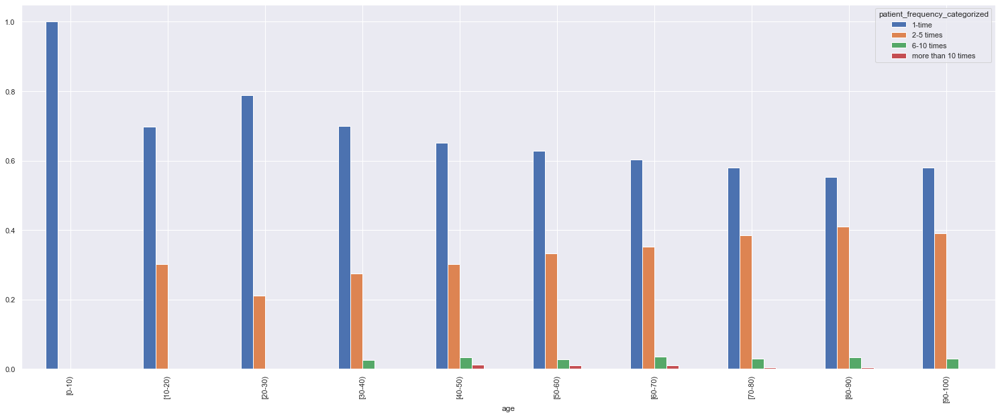

In [234]:
pd.crosstab(df_visual_non_diabetic['age'],df_visual_non_diabetic['patient_frequency_categorized'],normalize='index').plot(kind='bar',figsize=(26,10));

In [235]:
# Many patients in all age group visit the hospital only once..

In [236]:
pd.crosstab(df_visual_non_diabetic['diag_1'],df_visual_non_diabetic['discharge_disposition_id'])

discharge_disposition_id,Discharged Home,Expired,Hospice,In/Still/Outpatient,Other,Transferred Within,Transferred/Referred,left AMA
diag_1,,,,,,,,
Circulatory,15381,474,182,4,1109,7,4334,86
Digestive,4983,84,44,1,225,4,1046,37
Genitourinary,2439,55,48,0,91,7,1038,19
Injury,2748,85,24,2,168,4,2161,21
Musculoskeletal,1467,9,9,1,96,2,1057,9
Neoplasms,1714,125,156,1,95,4,401,6
Respiratory,6723,310,127,2,353,10,2011,59
other,8221,246,84,8,431,7,2938,80


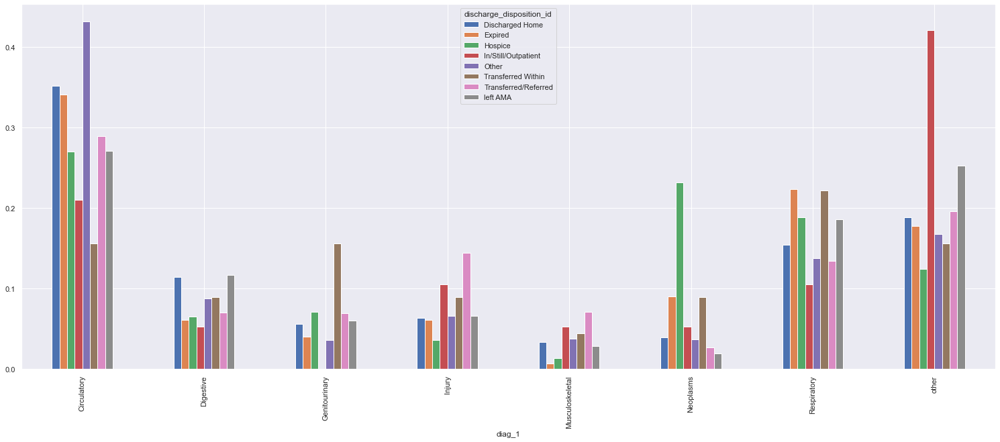

In [237]:
pd.crosstab(df_visual_non_diabetic['diag_1'],df_visual_non_diabetic['discharge_disposition_id'],normalize='columns').plot(kind='bar',figsize=(26,10));

In [238]:
# many of the inpatients are because of other disorders like headache etc..

In [239]:
pd.crosstab(df_visual_non_diabetic['diag_1'],df_visual_non_diabetic['patient_frequency_categorized'])

patient_frequency_categorized,1-time,2-5 times,6-10 times,more than 10 times
diag_1,,,,
Circulatory,12920,7838,698,121
Digestive,3773,2373,202,76
Genitourinary,2185,1382,115,15
Injury,3201,1848,140,24
Musculoskeletal,1879,731,37,3
Neoplasms,1719,737,37,9
Respiratory,5290,3797,408,100
other,6998,4560,370,87


In [240]:
# circulatory respiratory and patients with other disorders tend to visit the hospital more number of times..

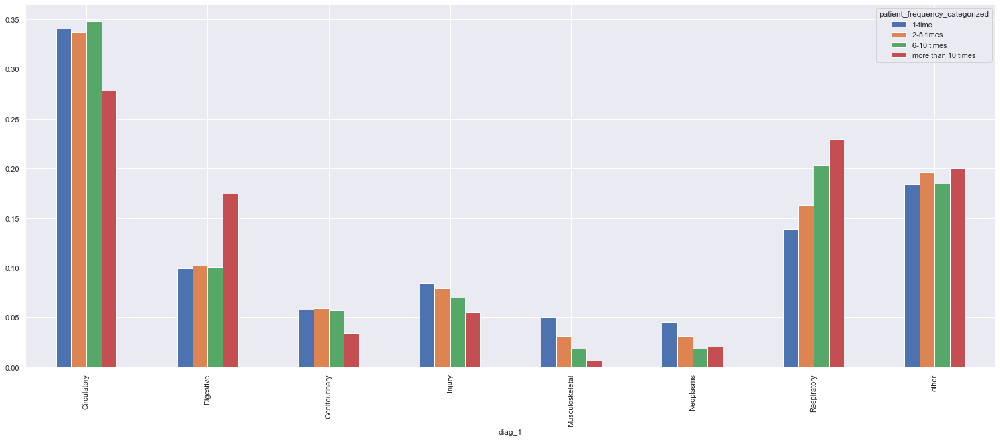

In [241]:
pd.crosstab(df_visual_non_diabetic['diag_1'],df_visual_non_diabetic['patient_frequency_categorized'],normalize='columns').plot(kind='bar',figsize=(26,10));

In [242]:
# 

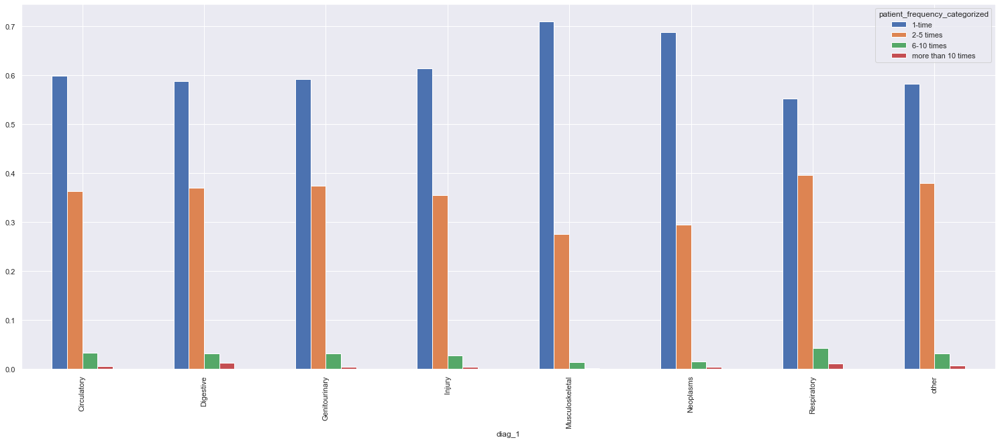

In [243]:
pd.crosstab(df_visual_non_diabetic['diag_1'],df_visual_non_diabetic['patient_frequency_categorized'],normalize='index').plot(kind='bar',figsize=(26,10));

In [244]:
# patients with respiratory and other illness tend to visit the hospital often..

In [245]:
pd.crosstab(df_visual_non_diabetic['discharge_disposition_id'],df_visual_non_diabetic['patient_frequency_categorized'])

patient_frequency_categorized,1-time,2-5 times,6-10 times,more than 10 times
discharge_disposition_id,,,,
Discharged Home,26758,15201,1371,346
Expired,993,370,24,1
Hospice,415,246,12,1
In/Still/Outpatient,8,9,1,1
Other,1480,994,81,13
Transferred Within,20,24,1,0
Transferred/Referred,8105,6317,496,68
left AMA,186,105,21,5


In [246]:
# add anyways..

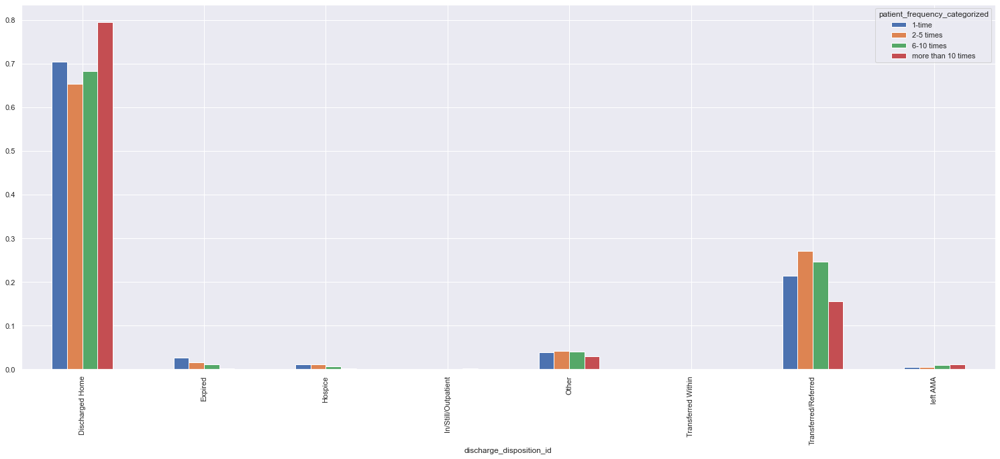

In [247]:
pd.crosstab(df_visual_non_diabetic['discharge_disposition_id'],df_visual_non_diabetic['patient_frequency_categorized'],normalize='columns').plot(kind='bar',figsize=(26,10));

In [248]:
pd.crosstab(df_visual_non_diabetic['diag_1'],df_visual_non_diabetic['readmitted'])

readmitted,No,Yes
diag_1,,
Circulatory,11302,10275
Digestive,3363,3061
Genitourinary,2041,1656
Injury,2899,2314
Musculoskeletal,1534,1116
Neoplasms,1645,857
Respiratory,4877,4718
other,6362,5653


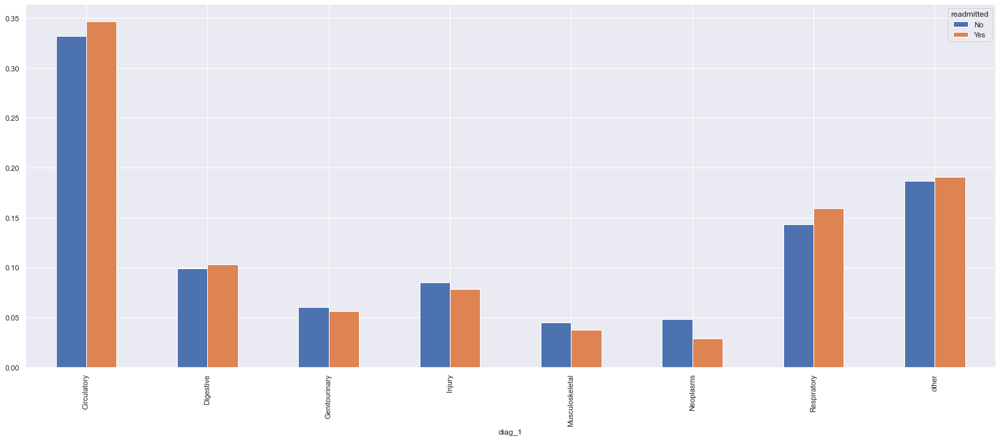

In [249]:
pd.crosstab(df_visual_non_diabetic['diag_1'],df_visual_non_diabetic['readmitted'],normalize='columns').plot(kind='bar',figsize=(26,10));

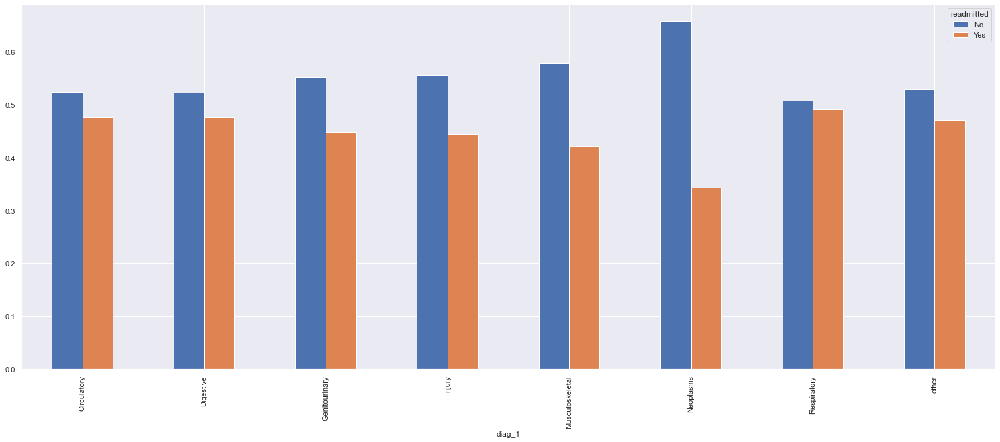

In [250]:
pd.crosstab(df_visual_non_diabetic['diag_1'],df_visual_non_diabetic['readmitted'],normalize='index').plot(kind='bar',figsize=(26,10));

In [251]:
# readmission rate is very high for circulatory,respiratory other and digestive disorders

In [252]:
pd.crosstab(df_visual_non_diabetic['discharge_disposition_id'],df_visual_non_diabetic['readmitted'])

readmitted,No,Yes
discharge_disposition_id,,
Discharged Home,22676,21000
Expired,1388,0
Hospice,604,70
In/Still/Outpatient,9,10
Other,1507,1061
Transferred Within,11,34
Transferred/Referred,7669,7317
left AMA,159,158


In [253]:
# add anyways..

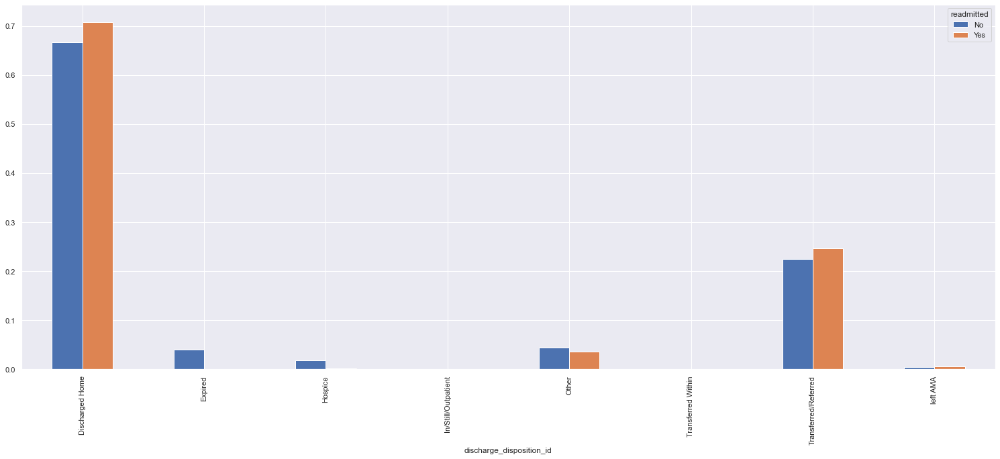

In [254]:
pd.crosstab(df_visual_non_diabetic['discharge_disposition_id'],df_visual_non_diabetic['readmitted'],normalize='columns').plot(kind='bar',figsize=(26,10));

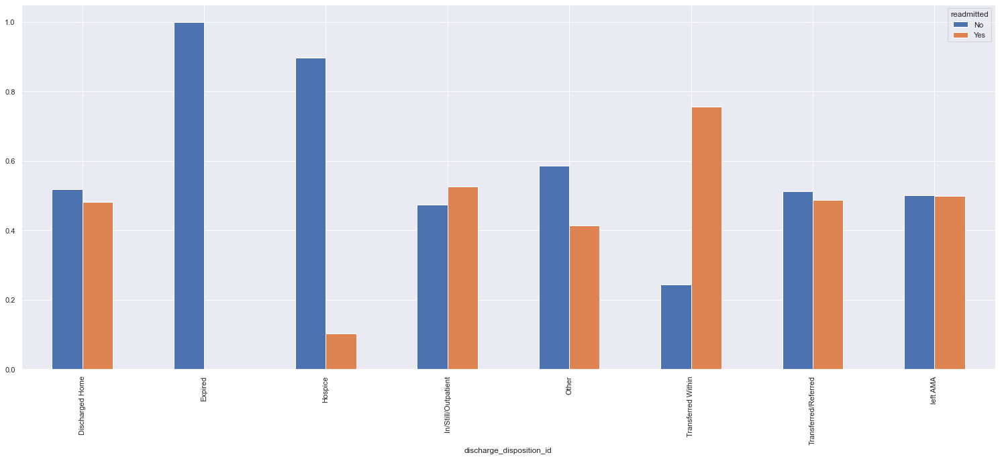

In [255]:
pd.crosstab(df_visual_non_diabetic['discharge_disposition_id'],df_visual_non_diabetic['readmitted'],normalize='index').plot(kind='bar',figsize=(26,10));

In [256]:
pd.crosstab(df_visual_non_diabetic['patient_frequency_categorized'],df_visual_non_diabetic['readmitted'])

readmitted,No,Yes
patient_frequency_categorized,,
1-time,27564,10401
2-5 times,6266,17000
6-10 times,180,1827
more than 10 times,13,422


In [257]:
# 7640 patients were readmitted in the first instance itself..

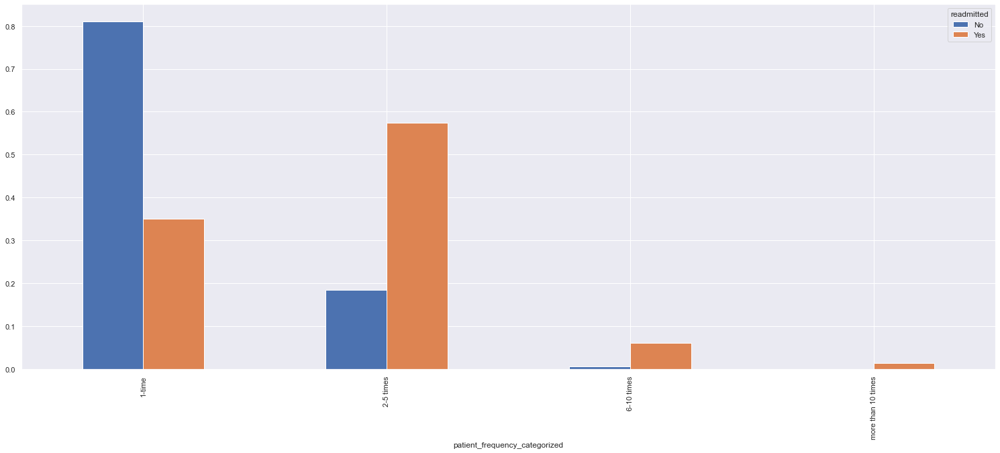

In [258]:
pd.crosstab(df_visual_non_diabetic['patient_frequency_categorized'],df_visual_non_diabetic['readmitted'],normalize='columns').plot(kind='bar',figsize=(26,10));

In [259]:
# patients who visit the hospital more than once are more likely to be readmitted..

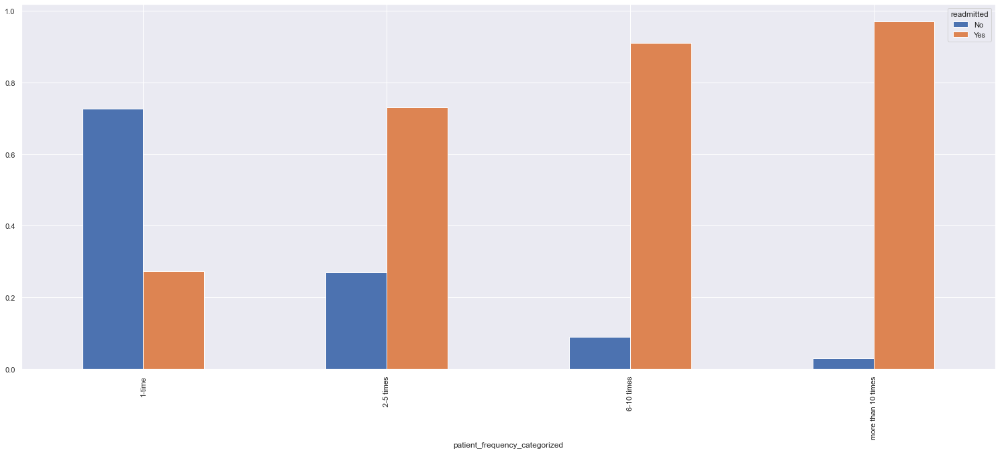

In [260]:
pd.crosstab(df_visual_non_diabetic['patient_frequency_categorized'],df_visual_non_diabetic['readmitted'],normalize='index').plot(kind='bar',figsize=(26,10));

## Dropping Expired Records and patient_frequency_categorized feature.

In [261]:
index_to_be_dropped = df_visual_non_diabetic[df_visual_non_diabetic['discharge_disposition_id']=='Expired'].index

In [262]:
df_visual_non_diabetic.drop(index_to_be_dropped,inplace=True)

In [263]:
df_visual_non_diabetic.drop(columns=['patient_nbr'],inplace=True)

In [264]:
df_visual_non_diabetic.drop(columns=['patient_frequency_categorized'],inplace=True)

In [265]:
df_visual_non_diabetic.to_csv('Non_diabetic_data_for_stats.csv')

# STATISTICAL ANALYSIS

In [266]:
data_preprocessed = pd.read_csv('Non_diabetic_data_for_stats.csv',index_col=0)
df_stats = data_preprocessed.copy()

df_stats.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
6,1,4,70,1,21,0,0,0,7,Caucasian,Male,[60-70),Elective,Discharged Home,Referral,Circulatory,Circulatory,other,None,None,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,No
8,1,13,68,2,28,0,0,0,8,Caucasian,Female,[80-90),Urgent,Discharged Home,Transfer,Circulatory,Circulatory,other,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,No
9,1,12,33,3,18,0,0,0,8,Caucasian,Female,[90-100),Elective,Transferred/Referred,Transfer,Circulatory,Neoplasms,Respiratory,None,None,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,No
11,1,7,62,0,11,0,0,0,7,AfricanAmerican,Male,[60-70),Urgent,Discharged Home,Transfer,Neoplasms,other,Neoplasms,None,None,No,No,No,No,No,No,No,Up,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,Yes
13,1,10,55,1,31,0,0,0,8,Caucasian,Male,[80-90),Emergency,Discharged Home,Emergency Room,Circulatory,Circulatory,Circulatory,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,No


In [267]:
# mode imputation for statistical analysis

In [268]:
for col in ['race','diag_2','diag_3']:
    df_stats[col] = df_stats[col].fillna(df_stats[col].mode()[0])

In [269]:
df_stats.isnull().sum()

patient_frequency           0
time_in_hospital            0
num_lab_procedures          0
num_procedures              0
num_medications             0
number_outpatient           0
number_emergency            0
number_inpatient            0
number_diagnoses            0
race                        0
gender                      0
age                         0
admission_type_id           0
discharge_disposition_id    0
admission_source_id         0
diag_1                      0
diag_2                      0
diag_3                      0
max_glu_serum               0
A1Cresult                   0
metformin                   0
repaglinide                 0
nateglinide                 0
chlorpropamide              0
glimepiride                 0
acetohexamide               0
glipizide                   0
glyburide                   0
tolbutamide                 0
pioglitazone                0
rosiglitazone               0
acarbose                    0
miglitol                    0
troglitazo

In [270]:
df_stats.shape

(62285, 44)

### FINDING CONSTANT AND QUASI-CONSTANT FEATURES USING A VARIANCE THRESHOLD OF 0.995

In [271]:
quasi_constant_feat = []


for feature in df_stats.columns:

    predominant = (df_stats[feature].value_counts() / np.float(len(df_stats))).sort_values(ascending=False).values[0]

    if predominant > 0.995:
        
        
        quasi_constant_feat.append(feature)

len(quasi_constant_feat)

11

In [272]:
quasi_constant_feat

['chlorpropamide',
 'acetohexamide',
 'tolbutamide',
 'acarbose',
 'miglitol',
 'troglitazone',
 'tolazamide',
 'glipizide-metformin',
 'glimepiride-pioglitazone',
 'metformin-rosiglitazone',
 'metformin-pioglitazone']

# CHI-SQUARED TEST FOR INDEPENDENCE

We want to analyze the variables in this dataset to understand any relationships between them and their overall effects.
To do this,
  * `Chi-square test` for categorical variables relationship
  * We have to analyze numerical variables using `analysis of variance` or `ANOVA test`.
The purpose of these tests is to determine whether there is a statistically significant relationship between 
the target variable, readmissions and independent variable. 
Considering p-value as 0.05, if anything above that, we cannot reject the null hypothesis.
This takes the string values ​​in a variable and converts them to columns labeled 0 or 1 relative to the string.
We will also standardize the original numerical variables with a mean of 0 and a standard deviation of 1.
Finally, we look at the correlation coefficients between the independent variables to make sure they do not have a
strong influence on each other. The threshold we used is -0.7 <x <0.7.

This test is used to test whether the categorical variables are independent or not.

<p style='text-indent:20em'> <strong> $H_{0}$: The variables are independent</strong></p>
<p style='text-indent:20em'> <strong> $H_{1}$: The variables are not independent (i.e. variables are dependent)</strong></p>

Consider a categorical variable `A` with `r` levels and variable `B` with `c` levels. Let us test the independence of variables A and B.

The test statistic is given as:
<p style='text-indent:25em'> <strong> $\chi^{2} = \sum_{i= 1}^{r}\sum_{j = 1}^{c}\frac{O_{ij}^{2}}{E_{ij}} - N$</strong></p>

Where, <br>
$O_{ij}$: Observed frequency for category (i,j) <br>
$E_{ij}$: Expected frequency for category (i,j)<br>
$N$: Total number of observations

Under $H_{0}$, the test statistic follows a chi-square distribution with $(r-1)(c-1)$ degrees of freedom.

In [273]:
categorical_columns = df_stats.select_dtypes(include='object').columns.tolist()

In [274]:
# define a function that returns a table, a chi-square value, and a p value
def chisquare_test(df, var_list, target, null_list=[]):
    for var in var_list:
        print('\n\n',var.upper())
        chi_test = pd.crosstab(df[var], df[target])
        display(chi_test)
        
        chisq_value, pvalue, dof, expected = chi2_contingency(chi_test)
        print('---'*10,'\nExpected Chi table ')
        display(pd.DataFrame(expected,index=chi_test.index,columns=chi_test.columns))
        print(f"""Chi-square value: {chisq_value:.2f}
p-value\t\t: {pvalue:.3f}         for      {var.upper()}\n""")
        print('===='*30)
        
        if pvalue > 0.05: # adds variables that fail to reject the null hypothesis
            null_list.append(var)
            
    print(f'Failed to Reject null hypothesis: {null_list}')

In [275]:
cols_cat = df_stats.select_dtypes(exclude=np.number).columns.to_list()
chi_squared_failed_features=[]
chisquare_test(df_stats, cols_cat,'readmitted',chi_squared_failed_features)



 RACE


readmitted,No,Yes
race,,
AfricanAmerican,5520,4974
Asian,256,148
Caucasian,25753,23680
Hispanic,598,479
Other,508,369


------------------------------ 
Expected Chi table 


readmitted,No,Yes
race,,
AfricanAmerican,5498.461748,4995.538252
Asian,211.680822,192.319178
Caucasian,25901.034840,23531.965160
Hispanic,564.307538,512.692462
Other,459.515052,417.484948


Chi-square value: 36.42
p-value		: 0.000         for      RACE



 GENDER


readmitted,No,Yes
gender,,
Female,17373,16121
Male,15262,13529


------------------------------ 
Expected Chi table 


readmitted,No,Yes
gender,,
Female,17549.597656,15944.402344
Male,15085.402344,13705.597656


Chi-square value: 8.03
p-value		: 0.005         for      GENDER



 AGE


readmitted,No,Yes
age,,
[0-10),2,1
[10-20),34,18
[20-30),199,118
[30-40),777,513
[40-50),2462,1989
[50-60),5249,4376
[60-70),7415,6815
[70-80),9023,8762
[80-90),6276,6202


------------------------------ 
Expected Chi table 


readmitted,No,Yes
age,,
[0-10),1.571887,1.428113
[10-20),27.246046,24.753954
[20-30),166.096091,150.903909
[30-40),675.911536,614.088464
[40-50),2332.156779,2118.843221
[50-60),5043.138396,4581.861604
[60-70),7455.985390,6774.014610
[70-80),9318.671831,8466.328169
[80-90),6538.003211,5939.996789


Chi-square value: 153.24
p-value		: 0.000         for      AGE



 ADMISSION_TYPE_ID


readmitted,No,Yes
admission_type_id,,
Elective,6511,4764
Emergency,16990,16339
Newborn,4,2
Other,3047,3100
Trauma Center,16,0
Urgent,6067,5445


------------------------------ 
Expected Chi table 


readmitted,No,Yes
admission_type_id,,
Elective,5907.676407,5367.323593
Emergency,17463.143855,15865.856145
Newborn,3.143775,2.856225
Other,3220.797062,2926.202938
Trauma Center,8.383399,7.616601
Urgent,6031.855503,5480.144497


Chi-square value: 191.52
p-value		: 0.000         for      ADMISSION_TYPE_ID



 DISCHARGE_DISPOSITION_ID


readmitted,No,Yes
discharge_disposition_id,,
Discharged Home,22676,21000
Hospice,604,70
In/Still/Outpatient,9,10
Other,1507,1061
Transferred Within,11,34
Transferred/Referred,7669,7317
left AMA,159,158


------------------------------ 
Expected Chi table 


readmitted,No,Yes
discharge_disposition_id,,
Discharged Home,22884.583126,20791.416874
Hospice,353.150678,320.849322
In/Still/Outpatient,9.955286,9.044714
Other,1345.535522,1222.464478
Transferred Within,23.578309,21.421691
Transferred/Referred,7852.100987,7133.899013
left AMA,166.096091,150.903909


Chi-square value: 442.89
p-value		: 0.000         for      DISCHARGE_DISPOSITION_ID



 ADMISSION_SOURCE_ID


readmitted,No,Yes
admission_source_id,,
Emergency Room,17468,18173
Extramural Birth,2,0
Law Enforcement,4,4
Normal Delivery,2,0
Other,2279,2094
Referral,10120,8105
Sick Baby,1,0
Transfer,2759,1274


------------------------------ 
Expected Chi table 


readmitted,No,Yes
admission_source_id,,
Emergency Room,18674.544995,16966.455005
Extramural Birth,1.047925,0.952075
Law Enforcement,4.191699,3.808301
Normal Delivery,1.047925,0.952075
Other,2291.287710,2081.712290
Referral,9549.215301,8675.784699
Sick Baby,0.523962,0.476038
Transfer,2113.140483,1919.859517


Chi-square value: 654.80
p-value		: 0.000         for      ADMISSION_SOURCE_ID



 DIAG_1


readmitted,No,Yes
diag_1,,
Circulatory,10828,10275
Digestive,3279,3061
Genitourinary,1986,1656
Injury,2814,2314
Musculoskeletal,1525,1116
Neoplasms,1520,857
Respiratory,4567,4718
other,6116,5653


------------------------------ 
Expected Chi table 


readmitted,No,Yes
diag_1,,
Circulatory,11057.179176,10045.820824
Digestive,3321.921811,3018.078189
Genitourinary,1908.271173,1733.728827
Injury,2686.879345,2441.120655
Musculoskeletal,1383.784780,1257.215220
Neoplasms,1245.458698,1131.541302
Respiratory,4864.991170,4420.008830
other,6166.513848,5602.486152


Chi-square value: 227.04
p-value		: 0.000         for      DIAG_1



 DIAG_2


readmitted,No,Yes
diag_2,,
Circulatory,11575,11259
Digestive,1601,1297
Genitourinary,3298,3128
Injury,1218,794
Musculoskeletal,612,459
Neoplasms,1115,932
Respiratory,4163,4097
other,9053,7684


------------------------------ 
Expected Chi table 


readmitted,No,Yes
diag_2,,
Circulatory,11964.158144,10869.841856
Digestive,1518.443124,1379.556876
Genitourinary,3366.982580,3059.017420
Injury,1054.212411,957.787589
Musculoskeletal,561.163763,509.836237
Neoplasms,1072.551096,974.448904
Respiratory,4327.929678,3932.070322
other,8769.559204,7967.440796


Chi-square value: 138.10
p-value		: 0.000         for      DIAG_2



 DIAG_3


readmitted,No,Yes
diag_3,,
Circulatory,12101,11274
Digestive,1574,1344
Genitourinary,2599,2754
Injury,960,683
Musculoskeletal,703,563
Neoplasms,927,716
Respiratory,2991,3117
other,10780,9199


------------------------------ 
Expected Chi table 


readmitted,No,Yes
diag_3,,
Circulatory,12247.621819,11127.378181
Digestive,1528.922373,1389.077627
Genitourinary,2804.770892,2548.229108
Injury,860.870274,782.129726
Musculoskeletal,663.336437,602.663563
Neoplasms,860.870274,782.129726
Respiratory,3200.362527,2907.637473
other,10468.245404,9510.754596


Chi-square value: 126.10
p-value		: 0.000         for      DIAG_3



 MAX_GLU_SERUM


readmitted,No,Yes
max_glu_serum,,
>200,454,428
>300,227,304
None,31060,28175
Norm,894,743


------------------------------ 
Expected Chi table 


readmitted,No,Yes
max_glu_serum,,
>200,462.134864,419.865136
>300,278.224051,252.775949
None,31036.914586,28198.085414
Norm,857.726499,779.273501


Chi-square value: 23.37
p-value		: 0.000         for      MAX_GLU_SERUM



 A1CRESULT


readmitted,No,Yes
A1Cresult,,
>7,1302,1093
>8,1631,1598
None,27823,25606
Norm,1879,1353


------------------------------ 
Expected Chi table 


readmitted,No,Yes
A1Cresult,,
>7,1254.890022,1140.109978
>8,1691.874689,1537.125311
None,27994.788713,25434.211287
Norm,1693.446576,1538.553424


Chi-square value: 53.24
p-value		: 0.000         for      A1CRESULT



 METFORMIN


readmitted,No,Yes
metformin,,
Down,164,144
No,26445,24495
Steady,5727,4759
Up,299,252


------------------------------ 
Expected Chi table 


readmitted,No,Yes
metformin,,
Down,161.380429,146.619571
No,26690.646223,24249.353777
Steady,5494.270049,4991.729951
Up,288.703299,262.296701


Chi-square value: 26.32
p-value		: 0.000         for      METFORMIN



 REPAGLINIDE


readmitted,No,Yes
repaglinide,,
Down,19,18
No,32180,29050
Steady,406,548
Up,30,34


------------------------------ 
Expected Chi table 


readmitted,No,Yes
repaglinide,,
Down,19.386610,17.613390
No,32082.219636,29147.780364
Steady,499.860159,454.139841
Up,33.533596,30.466404


Chi-square value: 38.45
p-value		: 0.000         for      REPAGLINIDE



 NATEGLINIDE


readmitted,No,Yes
nateglinide,,
Down,3,3
No,32407,29412
Steady,218,226
Up,7,9


------------------------------ 
Expected Chi table 


readmitted,No,Yes
nateglinide,,
Down,3.143775,2.856225
No,32390.833507,29428.166493
Steady,232.639319,211.360681
Up,8.383399,7.616601


Chi-square value: 2.45
p-value		: 0.485         for      NATEGLINIDE



 CHLORPROPAMIDE


readmitted,No,Yes
chlorpropamide,,
No,32609,29627
Steady,25,19
Up,1,4


------------------------------ 
Expected Chi table 


readmitted,No,Yes
chlorpropamide,,
No,32609.325841,29626.674159
Steady,23.054347,20.945653
Up,2.619812,2.380188


Chi-square value: 2.45
p-value		: 0.294         for      CHLORPROPAMIDE



 GLIMEPIRIDE


readmitted,No,Yes
glimepiride,,
Down,59,60
No,30946,28005
Steady,1510,1492
Up,120,93


------------------------------ 
Expected Chi table 


readmitted,No,Yes
glimepiride,,
Down,62.351529,56.648471
No,30888.109256,28062.890744
Steady,1572.935217,1429.064783
Up,111.603998,101.396002


Chi-square value: 7.22
p-value		: 0.065         for      GLIMEPIRIDE



 ACETOHEXAMIDE


readmitted,No,Yes
acetohexamide,,
No,32635,29649
Steady,0,1


------------------------------ 
Expected Chi table 


readmitted,No,Yes
acetohexamide,,
No,32634.476038,29649.523962
Steady,0.523962,0.476038


Chi-square value: 0.00
p-value		: 0.962         for      ACETOHEXAMIDE



 GLIPIZIDE


readmitted,No,Yes
glipizide,,
Down,171,202
No,28700,25518
Steady,3536,3678
Up,228,252


------------------------------ 
Expected Chi table 


readmitted,No,Yes
glipizide,,
Down,195.437987,177.562013
No,28408.195071,25809.804929
Steady,3779.864976,3434.135024
Up,251.501967,228.498033


Chi-square value: 50.38
p-value		: 0.000         for      GLIPIZIDE



 GLYBURIDE


readmitted,No,Yes
glyburide,,
Down,173,188
No,29118,26426
Steady,3077,2811
Up,267,225


------------------------------ 
Expected Chi table 


readmitted,No,Yes
glyburide,,
Down,189.150438,171.849562
No,29102.969254,26441.030746
Steady,3085.090792,2802.909208
Up,257.789516,234.210484


Chi-square value: 3.65
p-value		: 0.302         for      GLYBURIDE



 TOLBUTAMIDE


readmitted,No,Yes
tolbutamide,,
No,32628,29643
Steady,7,7


------------------------------ 
Expected Chi table 


readmitted,No,Yes
tolbutamide,,
No,32627.664526,29643.335474
Steady,7.335474,6.664526


Chi-square value: 0.01
p-value		: 0.930         for      TOLBUTAMIDE



 PIOGLITAZONE


readmitted,No,Yes
pioglitazone,,
Down,33,37
No,30411,27379
Steady,2133,2168
Up,58,66


------------------------------ 
Expected Chi table 


readmitted,No,Yes
pioglitazone,,
Down,36.677370,33.322630
No,30279.788874,27510.211126
Steady,2253.562415,2047.437585
Up,64.971341,59.028659


Chi-square value: 17.09
p-value		: 0.001         for      PIOGLITAZONE



 ROSIGLITAZONE


readmitted,No,Yes
rosiglitazone,,
Down,37,14
No,30720,27754
Steady,1819,1837
Up,59,45


------------------------------ 
Expected Chi table 


readmitted,No,Yes
rosiglitazone,,
Down,26.722084,24.277916
No,30638.179176,27835.820824
Steady,1915.606647,1740.393353
Up,54.492093,49.507907


Chi-square value: 19.78
p-value		: 0.000         for      ROSIGLITAZONE



 ACARBOSE


readmitted,No,Yes
acarbose,,
Down,1,2
No,32559,29526
Steady,73,121
Up,2,1


------------------------------ 
Expected Chi table 


readmitted,No,Yes
acarbose,,
Down,1.571887,1.428113
No,32530.207514,29554.792486
Steady,101.648712,92.351288
Up,1.571887,1.428113


Chi-square value: 17.70
p-value		: 0.001         for      ACARBOSE



 MIGLITOL


readmitted,No,Yes
miglitol,,
Down,0,3
No,32625,29637
Steady,10,10


------------------------------ 
Expected Chi table 


readmitted,No,Yes
miglitol,,
Down,1.571887,1.428113
No,32622.948864,29639.051136
Steady,10.479249,9.520751


Chi-square value: 3.35
p-value		: 0.187         for      MIGLITOL



 TROGLITAZONE


readmitted,No,Yes
troglitazone,,
No,32634,29649
Steady,1,1


------------------------------ 
Expected Chi table 


readmitted,No,Yes
troglitazone,,
No,32633.952075,29649.047925
Steady,1.047925,0.952075


Chi-square value: 0.41
p-value		: 0.522         for      TROGLITAZONE



 TOLAZAMIDE


readmitted,No,Yes
tolazamide,,
No,32623,29638
Steady,12,11
Up,0,1


------------------------------ 
Expected Chi table 


readmitted,No,Yes
tolazamide,,
No,32622.424902,29638.575098
Steady,12.051136,10.948864
Up,0.523962,0.476038


Chi-square value: 1.10
p-value		: 0.577         for      TOLAZAMIDE



 INSULIN


readmitted,No,Yes
insulin,,
Down,3049,3542
No,16720,13957
Steady,9874,8748
Up,2992,3403


------------------------------ 
Expected Chi table 


readmitted,No,Yes
insulin,,
Down,3453.436381,3137.563619
No,16073.595488,14603.404512
Steady,9757.228386,8864.771614
Up,3350.739745,3044.260255


Chi-square value: 237.72
p-value		: 0.000         for      INSULIN



 GLYBURIDE-METFORMIN


readmitted,No,Yes
glyburide-metformin,,
Down,1,0
No,32412,29450
Steady,220,199
Up,2,1


------------------------------ 
Expected Chi table 


readmitted,No,Yes
glyburide-metformin,,
Down,0.523962,0.476038
No,32413.363892,29448.636108
Steady,219.540258,199.459742
Up,1.571887,1.428113


Chi-square value: 1.16
p-value		: 0.764         for      GLYBURIDE-METFORMIN



 GLIPIZIDE-METFORMIN


readmitted,No,Yes
glipizide-metformin,,
No,32632,29644
Steady,3,6


------------------------------ 
Expected Chi table 


readmitted,No,Yes
glipizide-metformin,,
No,32630.284338,29645.715662
Steady,4.715662,4.284338


Chi-square value: 0.66
p-value		: 0.417         for      GLIPIZIDE-METFORMIN



 GLIMEPIRIDE-PIOGLITAZONE


readmitted,No,Yes
glimepiride-pioglitazone,,
No,32635,29650


------------------------------ 
Expected Chi table 


readmitted,No,Yes
glimepiride-pioglitazone,,
No,32635.0,29650.0


Chi-square value: 0.00
p-value		: 1.000         for      GLIMEPIRIDE-PIOGLITAZONE



 METFORMIN-ROSIGLITAZONE


readmitted,No,Yes
metformin-rosiglitazone,,
No,32633,29650
Steady,2,0


------------------------------ 
Expected Chi table 


readmitted,No,Yes
metformin-rosiglitazone,,
No,32633.952075,29649.047925
Steady,1.047925,0.952075


Chi-square value: 0.41
p-value		: 0.522         for      METFORMIN-ROSIGLITAZONE



 METFORMIN-PIOGLITAZONE


readmitted,No,Yes
metformin-pioglitazone,,
No,32635,29650


------------------------------ 
Expected Chi table 


readmitted,No,Yes
metformin-pioglitazone,,
No,32635.0,29650.0


Chi-square value: 0.00
p-value		: 1.000         for      METFORMIN-PIOGLITAZONE



 CHANGE


readmitted,No,Yes
change,,
Ch,13682,13779
No,18953,15871


------------------------------ 
Expected Chi table 


readmitted,No,Yes
change,,
Ch,14388.532311,13072.467689
No,18246.467689,16577.532311


Chi-square value: 130.17
p-value		: 0.000         for      CHANGE



 DIABETESMED


readmitted,No,Yes
diabetesMed,,
No,8993,6381
Yes,23642,23269


------------------------------ 
Expected Chi table 


readmitted,No,Yes
diabetesMed,,
No,8055.398411,7318.601589
Yes,24579.601589,22331.398411


Chi-square value: 304.06
p-value		: 0.000         for      DIABETESMED



 READMITTED


readmitted,No,Yes
readmitted,,
No,32635,0
Yes,0,29650


------------------------------ 
Expected Chi table 


readmitted,No,Yes
readmitted,,
No,17099.513928,15535.486072
Yes,15535.486072,14114.513928


Chi-square value: 62280.99
p-value		: 0.000         for      READMITTED

Failed to Reject null hypothesis: ['nateglinide', 'chlorpropamide', 'glimepiride', 'acetohexamide', 'glyburide', 'tolbutamide', 'miglitol', 'troglitazone', 'tolazamide', 'glyburide-metformin', 'glipizide-metformin', 'glimepiride-pioglitazone', 'metformin-rosiglitazone', 'metformin-pioglitazone']


In [276]:
# The drugs: 'nateglinide', 'chlorpropamide', 'acetohexamide', 'glyburide', 'tolbutamide', 'miglitol', 'troglitazone',
#           'tolazamide', 'glyburide-metformin', 'glipizide-metformin','glimepiride-pioglitazone', 'metformin-rosiglitazone',
#           'metformin-pioglitazone'
# failed to pass the test since they have p-values greater than 0.05.
# Based on the chi-square value and p-value, we can safely say that rest of all the categorical features have safely passed
# and have relation with the target variable.

In [277]:
chi_squared_failed_features

['nateglinide',
 'chlorpropamide',
 'glimepiride',
 'acetohexamide',
 'glyburide',
 'tolbutamide',
 'miglitol',
 'troglitazone',
 'tolazamide',
 'glyburide-metformin',
 'glipizide-metformin',
 'glimepiride-pioglitazone',
 'metformin-rosiglitazone',
 'metformin-pioglitazone']

# ONE-WAY ANOVA

It is used to check the equality of population means for more than two independent samples. Each group is considered as a `treatment`. It assumes that the samples are taken from normally distributed populations. To check this assumption we can use the `Shapiro-Wilk Test.` Also, the population variances should be equal; this can be tested using the `Levene's Test`.

The null and alternative hypothesis is given as:
<p style='text-indent:20em'> <strong> $H_{0}$: The averages of all treatments are the same. </strong></p>
<p style='text-indent:20em'> <strong> $H_{1}$: At least one treatment has a different average. </strong></p>

Consider there are `t` treatments and `N` number of total observations. The test statistic is given as:
<p style='text-indent:28em'> <strong> $F = \frac{MTrSS}{MESS} $</strong></p>

Where,<br>
MTrSS = $\frac{TrSS}{df_{Tr}}$<br>

TrSS = $\sum_{i}^{t}\sum_{j}^{n_{i}}n_{i}(\bar{x_{i}}. - \bar{x}..)$<br> $n_{i}$ is the number of observations in $i^{th}$ treatment. <br>$\bar{x_{i}}.$ is the mean over $i^{th}$ treatment <br> $\bar{x}..$ is the grand mean (i.e. mean of all the observations). <br>

$df_{Tr}$ is the degrees of freedom for treatments (= $t-1$)

MESS = $\frac{ESS}{df_{e}}$<br>

ESS = $\sum_{i}^{t}\sum_{j}^{n_{i}}{(x_{ij} - \bar{x_{i}}.)}^{2}$

$df_{e}$ is the degrees of freedom for error (= $N-t$)

Under $H_{0}$, the test statistic follows F-distribution with ($t-1,  N-t$) degrees of freedom.

# NON-PARAMETRIC (KRUSKAL-WALLIS H TEST)

If one of the assumptions of one-way ANOVA is not satisfied, then we can perform the `Kruskal-Wallis H test` which is a non-parametric equivalent test for one-way ANOVA.

The null and alternative hypothesis is given as:
<p style='text-indent:20em'> <strong> $H_{0}$: The averages of all treatments are the same. </strong></p>
<p style='text-indent:20em'> <strong> $H_{1}$: At least one treatment has a different average. </strong></p>

Consider there are `t` treatments each with $n_{i}$ (i = 1,2,...,t) observations  and `n` be the number of total observations. The test statistic is given as:
<p style='text-indent:28em'> <strong> $H = \frac{12}{n(n+1)} \sum_{i}{\frac{R_{i}^{2}}{n_{i}} - 3(n+1)} $</strong></p>

Where $R_{i}$ sum of the ranks of observations in the $i^{th}$ treatment.

Under $H_{0}$, the test statistic follows Chi-square distribution with ($t-1$) degrees of freedom.

In [278]:
# The numerical variables 
numerical_columns=df_stats.select_dtypes(include=np.number).columns.to_list()
print(numerical_columns)

['patient_frequency', 'time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications', 'number_outpatient', 'number_emergency', 'number_inpatient', 'number_diagnoses']


In [279]:
# define a function that performs the ANOVA test and returns a table
def anova_table(var_list,target_column, failed_list=[],test_list=[]):
    for var in var_list:
        print('\n\n')
        print(var.upper())
        print('=='*20)
        for cat in df_stats[target_column].unique():
            print(cat.upper())
            data = df_stats[df_stats[target_column]==cat][var]
            shapiro_stats = stats.shapiro(data)
            print(shapiro_stats)
            if shapiro_stats[1]<0.05:
                print(f'\n-----------------Shapiro test for {var} and {cat} has failed--------------------\n')
                
            print('--'*44,'\n')
            test_list.append(data)
            
        print(f'\nlevene  test for {var} \n')
        print(stats.levene(*test_list))
        print('--'*20,'\n\n')   
        print(f'\nanova  test for {var} \n')
        print(stats.f_oneway(*test_list))
        print('--'*20,'\n\n')
        print(f'\nkruskal  test for {var}\n')
        print(stats.kruskal(*test_list))
        print('--'*20,'\n\n')
        print('=='*50)  
        print('\n\n')
        

In [281]:
anova_table(numerical_columns,'readmitted')




PATIENT_FREQUENCY
NO
ShapiroResult(statistic=0.42308515310287476, pvalue=0.0)

-----------------Shapiro test for patient_frequency and No has failed--------------------

---------------------------------------------------------------------------------------- 

YES
ShapiroResult(statistic=0.7109643220901489, pvalue=0.0)

-----------------Shapiro test for patient_frequency and Yes has failed--------------------

---------------------------------------------------------------------------------------- 


levene  test for patient_frequency 

LeveneResult(statistic=8624.627159279553, pvalue=0.0)
---------------------------------------- 



anova  test for patient_frequency 

F_onewayResult(statistic=10804.742361649198, pvalue=0.0)
---------------------------------------- 



kruskal  test for patient_frequency

KruskalResult(statistic=14751.571917488414, pvalue=0.0)
---------------------------------------- 








TIME_IN_HOSPITAL
NO
ShapiroResult(statistic=0.8960208296775818, pvalue=0.0

ShapiroResult(statistic=0.750037670135498, pvalue=0.0)

-----------------Shapiro test for number_diagnoses and No has failed--------------------

---------------------------------------------------------------------------------------- 

YES
ShapiroResult(statistic=0.6933356523513794, pvalue=0.0)

-----------------Shapiro test for number_diagnoses and Yes has failed--------------------

---------------------------------------------------------------------------------------- 


levene  test for number_diagnoses 

LeveneResult(statistic=34251.218624619905, pvalue=0.0)
---------------------------------------- 



anova  test for number_diagnoses 

F_onewayResult(statistic=112166.35589785427, pvalue=0.0)
---------------------------------------- 



kruskal  test for number_diagnoses

KruskalResult(statistic=466486.8046542721, pvalue=0.0)
---------------------------------------- 







# STATISTICAL CONCLUSIONS

### FEATURE SELECTION USING FILTER METHODS

In [282]:
insignificant_features = list(set(quasi_constant_feat).union(set(chi_squared_failed_features)))

In [283]:
insignificant_features

['acarbose',
 'glyburide-metformin',
 'metformin-rosiglitazone',
 'tolazamide',
 'troglitazone',
 'tolbutamide',
 'nateglinide',
 'glipizide-metformin',
 'miglitol',
 'metformin-pioglitazone',
 'glimepiride',
 'glimepiride-pioglitazone',
 'chlorpropamide',
 'glyburide',
 'acetohexamide']

In [284]:
# Few DRUGS have failed to prove their significance wrt the target variable hence they can be eleminated

In [285]:
df_stats = df_stats.drop(columns=insignificant_features)

In [286]:
df_stats.shape

(62285, 29)

In [287]:
df_stats.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,glipizide,pioglitazone,rosiglitazone,insulin,change,diabetesMed,readmitted
6,1,4,70,1,21,0,0,0,7,Caucasian,Male,[60-70),Elective,Discharged Home,Referral,Circulatory,Circulatory,other,None,None,Steady,No,No,No,No,Steady,Ch,Yes,No
8,1,13,68,2,28,0,0,0,8,Caucasian,Female,[80-90),Urgent,Discharged Home,Transfer,Circulatory,Circulatory,other,None,None,No,No,Steady,No,No,Steady,Ch,Yes,No
9,1,12,33,3,18,0,0,0,8,Caucasian,Female,[90-100),Elective,Transferred/Referred,Transfer,Circulatory,Neoplasms,Respiratory,None,None,No,No,No,No,Steady,Steady,Ch,Yes,No
11,1,7,62,0,11,0,0,0,7,AfricanAmerican,Male,[60-70),Urgent,Discharged Home,Transfer,Neoplasms,other,Neoplasms,None,None,No,No,No,No,No,Steady,Ch,Yes,Yes
13,1,10,55,1,31,0,0,0,8,Caucasian,Male,[80-90),Emergency,Discharged Home,Emergency Room,Circulatory,Circulatory,Circulatory,None,None,No,No,No,No,No,Steady,No,Yes,No


In [288]:
df_stats.to_csv('Non_diabetic_data_for_encoding.csv')

### ENCODING OF ORDINAL CATEGORICAL FEATURES IN THE DATASET 

In [356]:
data_processed = pd.read_csv('Non_diabetic_data_for_encoding.csv',index_col=0)
df_encoded = data_processed.copy()
df_encoded.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,glipizide,pioglitazone,rosiglitazone,insulin,change,diabetesMed,readmitted
6,1,4,70,1,21,0,0,0,7,Caucasian,Male,[60-70),Elective,Discharged Home,Referral,Circulatory,Circulatory,other,None,None,Steady,No,No,No,No,Steady,Ch,Yes,No
8,1,13,68,2,28,0,0,0,8,Caucasian,Female,[80-90),Urgent,Discharged Home,Transfer,Circulatory,Circulatory,other,None,None,No,No,Steady,No,No,Steady,Ch,Yes,No
9,1,12,33,3,18,0,0,0,8,Caucasian,Female,[90-100),Elective,Transferred/Referred,Transfer,Circulatory,Neoplasms,Respiratory,None,None,No,No,No,No,Steady,Steady,Ch,Yes,No
11,1,7,62,0,11,0,0,0,7,AfricanAmerican,Male,[60-70),Urgent,Discharged Home,Transfer,Neoplasms,other,Neoplasms,None,None,No,No,No,No,No,Steady,Ch,Yes,Yes
13,1,10,55,1,31,0,0,0,8,Caucasian,Male,[80-90),Emergency,Discharged Home,Emergency Room,Circulatory,Circulatory,Circulatory,None,None,No,No,No,No,No,Steady,No,Yes,No


In [357]:
df_encoded.shape

(62285, 29)

In [358]:
# age,A1cresult and max_glu_serum are ordinal features...

In [359]:
df_encoded['age'] = df_encoded['age'].apply(lambda x : x[1]).astype(int)

In [360]:
df_encoded['max_glu_serum'] = df_encoded['max_glu_serum'].replace({'None':0,'Norm':1,'>200':200,'>300':300}).astype(int)

In [361]:
df_encoded['A1Cresult'] = df_encoded['A1Cresult'].replace({'None':0,'Norm':1,'>8':8,'>7':7}).astype(int)

In [362]:
for col in drugs_list:
    if col in df_encoded.columns:
        df_encoded[col].replace({'No':0,'Steady':0.5,'Down':-1,'Up':1},inplace=True)

In [363]:
df_encoded.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,glipizide,pioglitazone,rosiglitazone,insulin,change,diabetesMed,readmitted
6,1,4,70,1,21,0,0,0,7,Caucasian,Male,6,Elective,Discharged Home,Referral,Circulatory,Circulatory,other,0,0,0.5,0.0,0.0,0.0,0.0,0.5,Ch,Yes,No
8,1,13,68,2,28,0,0,0,8,Caucasian,Female,8,Urgent,Discharged Home,Transfer,Circulatory,Circulatory,other,0,0,0.0,0.0,0.5,0.0,0.0,0.5,Ch,Yes,No
9,1,12,33,3,18,0,0,0,8,Caucasian,Female,9,Elective,Transferred/Referred,Transfer,Circulatory,Neoplasms,Respiratory,0,0,0.0,0.0,0.0,0.0,0.5,0.5,Ch,Yes,No
11,1,7,62,0,11,0,0,0,7,AfricanAmerican,Male,6,Urgent,Discharged Home,Transfer,Neoplasms,other,Neoplasms,0,0,0.0,0.0,0.0,0.0,0.0,0.5,Ch,Yes,Yes
13,1,10,55,1,31,0,0,0,8,Caucasian,Male,8,Emergency,Discharged Home,Emergency Room,Circulatory,Circulatory,Circulatory,0,0,0.0,0.0,0.0,0.0,0.0,0.5,No,Yes,No


In [364]:
df_encoded = pd.get_dummies(df_encoded,drop_first=True)

In [365]:
df_encoded.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,max_glu_serum,A1Cresult,metformin,repaglinide,glipizide,pioglitazone,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Male,admission_type_id_Emergency,admission_type_id_Newborn,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,discharge_disposition_id_left AMA,admission_source_id_Extramural Birth,admission_source_id_Law Enforcement,admission_source_id_Normal Delivery,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Sick Baby,admission_source_id_Transfer,diag_1_Digestive,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Digestive,diag_2_Genitourinary,diag_2_Injury,diag_2_Musculoskeletal,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Musculoskeletal,diag_3_Neoplasms,diag_3_Respiratory,diag_3_other,change_No,diabetesMed_Yes,readmitted_Yes
6,1,4,70,1,21,0,0,0,7,6,0,0,0.5,0.0,0.0,0.0,0.0,0.5,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
8,1,13,68,2,28,0,0,0,8,8,0,0,0.0,0.0,0.5,0.0,0.0,0.5,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
9,1,12,33,3,18,0,0,0,8,9,0,0,0.0,0.0,0.0,0.0,0.5,0.5,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0
11,1,7,62,0,11,0,0,0,7,6,0,0,0.0,0.0,0.0,0.0,0.0,0.5,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1
13,1,10,55,1,31,0,0,0,8,8,0,0,0.0,0.0,0.0,0.0,0.0,0.5,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0


In [366]:
df_encoded.shape

(62285, 65)

In [367]:
# save dataset to new file for machine learning
df_encoded.to_csv('Non_diabetic_data_for_ml.csv')

# TRAIN TEST SPLIT

In [368]:
df_ml = pd.read_csv('Non_diabetic_data_for_ml.csv',index_col=0)
df_ml.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,max_glu_serum,A1Cresult,metformin,repaglinide,glipizide,pioglitazone,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Male,admission_type_id_Emergency,admission_type_id_Newborn,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,discharge_disposition_id_left AMA,admission_source_id_Extramural Birth,admission_source_id_Law Enforcement,admission_source_id_Normal Delivery,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Sick Baby,admission_source_id_Transfer,diag_1_Digestive,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Digestive,diag_2_Genitourinary,diag_2_Injury,diag_2_Musculoskeletal,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Musculoskeletal,diag_3_Neoplasms,diag_3_Respiratory,diag_3_other,change_No,diabetesMed_Yes,readmitted_Yes
6,1,4,70,1,21,0,0,0,7,6,0,0,0.5,0.0,0.0,0.0,0.0,0.5,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
8,1,13,68,2,28,0,0,0,8,8,0,0,0.0,0.0,0.5,0.0,0.0,0.5,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
9,1,12,33,3,18,0,0,0,8,9,0,0,0.0,0.0,0.0,0.0,0.5,0.5,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0
11,1,7,62,0,11,0,0,0,7,6,0,0,0.0,0.0,0.0,0.0,0.0,0.5,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1
13,1,10,55,1,31,0,0,0,8,8,0,0,0.0,0.0,0.0,0.0,0.0,0.5,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0


In [369]:
X = df_ml.drop(columns=['readmitted_Yes'])

In [370]:
y = df_ml['readmitted_Yes']

In [371]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25,stratify=y, random_state=42)

In [372]:
sc =  StandardScaler()

In [373]:
X_train = pd.DataFrame(sc.fit_transform(X_train),columns=X_train.columns)

In [374]:
X_test = pd.DataFrame(sc.transform(X_test),columns=X_train.columns)

In [375]:
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((46713, 64), (15572, 64), (46713,), (15572,))

In [376]:
X_train.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,max_glu_serum,A1Cresult,metformin,repaglinide,glipizide,pioglitazone,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Male,admission_type_id_Emergency,admission_type_id_Newborn,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,discharge_disposition_id_left AMA,admission_source_id_Extramural Birth,admission_source_id_Law Enforcement,admission_source_id_Normal Delivery,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Sick Baby,admission_source_id_Transfer,diag_1_Digestive,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Digestive,diag_2_Genitourinary,diag_2_Injury,diag_2_Musculoskeletal,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Musculoskeletal,diag_3_Neoplasms,diag_3_Respiratory,diag_3_other,change_No,diabetesMed_Yes
0,-0.539666,0.106467,0.409460,0.321465,-1.310757,-0.293951,-0.215768,-0.534172,-2.070462,-1.712240,-0.151048,-0.33947,-0.401019,-0.107219,-0.300592,-0.254633,-0.236519,-0.288401,-0.081069,-1.964010,7.570888,-0.11879,1.079233,-1.073534,-0.009254,-0.332051,-0.014633,2.098445,-0.102641,-0.017315,-0.209943,-0.027383,-0.563893,-0.072462,-0.006543,-0.011334,-0.006543,-0.276335,1.559731,-0.004627,-0.264344,-0.336602,-0.248264,-0.297789,-0.209498,-0.197518,-0.420932,-0.484306,-0.21949,-0.336405,-0.181767,-0.133005,-0.182144,-0.393380,1.645144,-0.223584,-0.309189,-0.161471,-0.144003,-0.162862,-0.330818,-0.688521,0.888382,-1.746935
1,0.057968,-0.220643,0.662030,-0.816501,-0.343772,-0.293951,-0.215768,0.296259,0.675049,1.139819,-0.151048,-0.33947,-0.401019,-0.107219,-0.300592,-0.254633,-0.236519,-0.288401,-0.081069,0.509162,-0.132085,-0.11879,1.079233,0.931503,-0.009254,-0.332051,-0.014633,-0.476543,-0.102641,-0.017315,-0.209943,-0.027383,1.773386,-0.072462,-0.006543,-0.011334,-0.006543,-0.276335,-0.641136,-0.004627,-0.264344,-0.336602,-0.248264,-0.297789,-0.209498,-0.197518,-0.420932,-0.484306,-0.21949,-0.336405,-0.181767,-0.133005,-0.182144,-0.393380,-0.607850,-0.223584,-0.309189,-0.161471,-0.144003,-0.162862,3.022808,-0.688521,0.888382,-1.746935
2,0.057968,0.760687,0.763057,-0.247518,0.985833,-0.293951,-0.215768,-0.534172,0.675049,-0.286210,-0.151048,-0.33947,-0.401019,-0.107219,-0.300592,-0.254633,-0.236519,0.688403,-0.081069,0.509162,-0.132085,-0.11879,1.079233,0.931503,-0.009254,-0.332051,-0.014633,-0.476543,-0.102641,-0.017315,-0.209943,-0.027383,-0.563893,-0.072462,-0.006543,-0.011334,-0.006543,-0.276335,-0.641136,-0.004627,-0.264344,-0.336602,-0.248264,-0.297789,-0.209498,-0.197518,-0.420932,-0.484306,-0.21949,-0.336405,-0.181767,-0.133005,-0.182144,2.542074,-0.607850,-0.223584,-0.309189,-0.161471,-0.144003,-0.162862,-0.330818,-0.688521,-1.125643,0.572431
3,1.253238,1.414908,-1.156469,-0.247518,0.139721,-0.293951,-0.215768,-0.534172,-0.011329,0.426804,-0.123532,-0.33947,-0.401019,-0.107219,-0.300592,-0.254633,-0.236519,-0.288401,-0.081069,0.509162,-0.132085,-0.11879,1.079233,-1.073534,-0.009254,3.011582,-0.014633,-0.476543,-0.102641,-0.017315,-0.209943,-0.027383,-0.563893,-0.072462,-0.006543,-0.011334,-0.006543,3.618792,-0.641136,-0.004627,-0.264344,-0.336602,-0.248264,-0.297789,-0.209498,-0.197518,-0.420932,-0.484306,-0.21949,-0.336405,-0.181767,-0.133005,-0.182144,-0.393380,-0.607850,-0.223584,3.234270,-0.161471,-0.144003,-0.162862,-0.330818,-0.688521,-1.125643,0.572431
4,1.253238,-0.547754,1.369223,-0.247518,0.744087,-0.293951,-0.215768,-0.534172,0.675049,-0.999225,-0.151048,-0.33947,-0.401019,-0.107219,-0.300592,3.351998,-0.236519,1.665207,-0.08106

In [377]:
y_train.head()

2296     0
2102     0
92982    0
11860    1
89289    1
Name: readmitted_Yes, dtype: int64

In [378]:
y_train.unique()

array([0, 1], dtype=int64)

# MODEL BUILDING : ITERATION 1

In [379]:
cv_acc_train = {}
cv_acc_test = {}
cv_TPR = {}
cv_FPR = {}
cv_acc = {}

In [380]:
def plot_result(model, name:str):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Evaluation based on a 5-fold cross-validation
    scores_train = cross_val_score(model, X_train, y_train, cv=5, scoring = 'balanced_accuracy')
    scores_test = cross_val_score(model, X_test, y_test, cv=5, scoring = 'balanced_accuracy')  
    scores_train_f1 = cross_val_score(model, X_train, y_train, cv=5, scoring = 'f1_micro')
    scores_test_f1 = cross_val_score(model, X_test, y_test, cv=5, scoring = 'f1_micro')  
    cv_acc_train[name] = round(scores_train.mean(), 4)*100 
    cv_acc_test[name] = round(scores_test.mean(), 4)*100
    cv_TPR[name] = (confusion_matrix(y_test, y_pred)[1][1]/confusion_matrix(y_test, y_pred)[1].sum())*100 
    cv_FPR[name] = (confusion_matrix(y_test, y_pred)[0][1]/confusion_matrix(y_test, y_pred)[0].sum())*100 
    cv_acc[name] = accuracy_score(y_test,y_pred)
    # accuracy scores
    print('Average Balanced Accuracy (CV=5), Test Set:', scores_test.mean())  
    print('Average Balanced Accuracy (CV=5), Training Set: ', scores_train.mean())

    # print classification report
    print(classification_report(y_test, y_pred, zero_division=0))

    # Plot Confusion Matrix
    plot_confusion_matrix(model, X_test, y_test)
    plt.show()

In [381]:
lgc = LogisticRegression()
knc = KNeighborsClassifier()
nbc = GaussianNB()
dtc = DecisionTreeClassifier()
rfc = RandomForestClassifier()
abc = AdaBoostClassifier()
gbc = GradientBoostingClassifier()

Average Balanced Accuracy (CV=5), Test Set: 0.7173789088719325
Average Balanced Accuracy (CV=5), Training Set:  0.7266739948571788
              precision    recall  f1-score   support

           0       0.70      0.84      0.76      8159
           1       0.78      0.60      0.67      7413

    accuracy                           0.73     15572
   macro avg       0.74      0.72      0.72     15572
weighted avg       0.73      0.73      0.72     15572



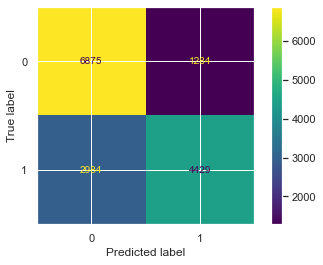

In [382]:
plot_result(lgc, "LogisticRegression_base")

Average Balanced Accuracy (CV=5), Test Set: 0.6569248865427152
Average Balanced Accuracy (CV=5), Training Set:  0.6553989077902459
              precision    recall  f1-score   support

           0       0.67      0.67      0.67      8159
           1       0.64      0.64      0.64      7413

    accuracy                           0.65     15572
   macro avg       0.65      0.65      0.65     15572
weighted avg       0.65      0.65      0.65     15572



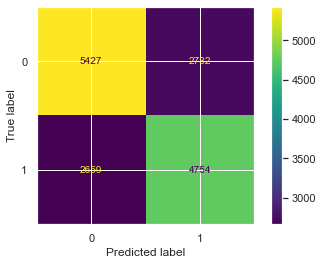

In [383]:
plot_result(dtc, "DecisionTreeClassifier_base")

Average Balanced Accuracy (CV=5), Test Set: 0.7439205887131418
Average Balanced Accuracy (CV=5), Training Set:  0.7478020002348595
              precision    recall  f1-score   support

           0       0.73      0.84      0.78      8159
           1       0.79      0.66      0.72      7413

    accuracy                           0.75     15572
   macro avg       0.76      0.75      0.75     15572
weighted avg       0.76      0.75      0.75     15572



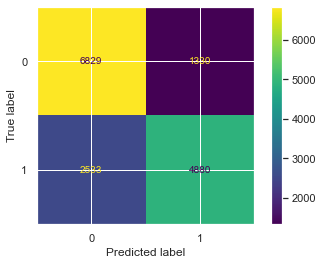

In [384]:
plot_result(rfc, "RandomForestClassifier_base")

Average Balanced Accuracy (CV=5), Test Set: 0.7285763686624703
Average Balanced Accuracy (CV=5), Training Set:  0.7363509348316019
              precision    recall  f1-score   support

           0       0.71      0.82      0.76      8159
           1       0.76      0.64      0.70      7413

    accuracy                           0.73     15572
   macro avg       0.74      0.73      0.73     15572
weighted avg       0.74      0.73      0.73     15572



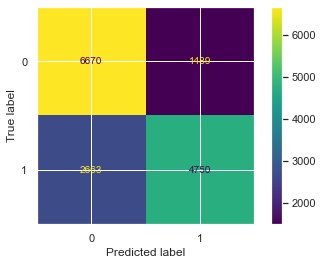

In [385]:
plot_result(abc, "AdaBoostClassifier_base")

Average Balanced Accuracy (CV=5), Test Set: 0.7481814196442033
Average Balanced Accuracy (CV=5), Training Set:  0.7513309143481893
              precision    recall  f1-score   support

           0       0.72      0.86      0.79      8159
           1       0.81      0.64      0.71      7413

    accuracy                           0.75     15572
   macro avg       0.76      0.75      0.75     15572
weighted avg       0.76      0.75      0.75     15572



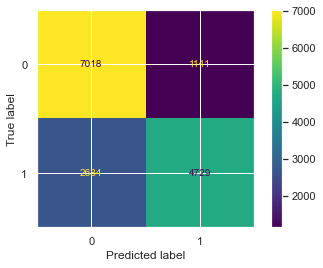

In [386]:
plot_result(gbc, "GradientBoostingClassifier_base")

In [387]:
feature_importance_df = pd.DataFrame(rfc.feature_importances_,index=X_train.columns,columns=['Random_Forest'])

feature_importance_df['Ada_Boost'] = abc.feature_importances_

feature_importance_df['Gradient_Boosting'] = gbc.feature_importances_

feature_importance_df = round(feature_importance_df.sort_values(by=['Random_Forest','Ada_Boost','Gradient_Boosting']),3)

feature_importance_df
## BUILDING MODEL AFTER REMOVING TOP few UNIMPORTANT FEATURES USING RANDOM FOREST FEATURE_IMPORTANCE ATTRIBUTE..

,Random_Forest,Ada_Boost,Gradient_Boosting
admission_source_id_Extramural Birth,0.000,0.00,0.000
admission_source_id_Sick Baby,0.000,0.00,0.000
admission_source_id_Law Enforcement,0.000,0.00,0.000
admission_source_id_Normal Delivery,0.000,0.00,0.000
admission_type_id_Newborn,0.000,0.00,0.000
admission_type_id_Trauma Center,0.000,0.00,0.000
discharge_disposition_id_In/Still/Outpatient,0.000,0.00,0.000
discharge_disposition_id_Transferred Within,0.000,0.00,0.000
discharge_disposition_id_left AMA,0.001,0.00,0.000
race_Asian,0.001,0.00,0.000


In [388]:
selected_features_random_forest_embedded = list(feature_importance_df.index[-1:10:-1])

In [389]:
selected_features_random_forest_embedded

['patient_frequency',
 'num_lab_procedures',
 'num_medications',
 'time_in_hospital',
 'number_inpatient',
 'age',
 'num_procedures',
 'number_diagnoses',
 'insulin',
 'number_outpatient',
 'gender_Male',
 'diag_3_other',
 'A1Cresult',
 'diag_2_other',
 'number_emergency',
 'metformin',
 'discharge_disposition_id_Transferred/Referred',
 'race_Caucasian',
 'diag_1_other',
 'glipizide',
 'admission_type_id_Emergency',
 'change_No',
 'admission_type_id_Urgent',
 'diag_1_Respiratory',
 'diag_2_Respiratory',
 'admission_source_id_Referral',
 'diag_2_Genitourinary',
 'diag_3_Respiratory',
 'diag_1_Digestive',
 'diag_3_Genitourinary',
 'pioglitazone',
 'diabetesMed_Yes',
 'diag_1_Injury',
 'rosiglitazone',
 'diag_1_Genitourinary',
 'admission_source_id_Transfer',
 'admission_type_id_Other',
 'diag_3_Digestive',
 'discharge_disposition_id_Hospice',
 'diag_2_Digestive',
 'max_glu_serum',
 'admission_source_id_Other',
 'diag_1_Musculoskeletal',
 'diag_2_Injury',
 'discharge_disposition_id_Other'

In [390]:
len(selected_features_random_forest_embedded)

53

In [391]:
selected_features_random_forest_embedded = selected_features_random_forest_embedded+['readmitted_Yes']

# MODEL BUILDING : ITERATION 2 (FEATURE SELECTION USING EMBEDDED METHODS

In [392]:
df_ml_embedded_1 = pd.read_csv('Non_diabetic_data_for_ml.csv',index_col=0)
df_ml_embedded_1.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,max_glu_serum,A1Cresult,metformin,repaglinide,glipizide,pioglitazone,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Male,admission_type_id_Emergency,admission_type_id_Newborn,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,discharge_disposition_id_left AMA,admission_source_id_Extramural Birth,admission_source_id_Law Enforcement,admission_source_id_Normal Delivery,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Sick Baby,admission_source_id_Transfer,diag_1_Digestive,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Digestive,diag_2_Genitourinary,diag_2_Injury,diag_2_Musculoskeletal,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Musculoskeletal,diag_3_Neoplasms,diag_3_Respiratory,diag_3_other,change_No,diabetesMed_Yes,readmitted_Yes
6,1,4,70,1,21,0,0,0,7,6,0,0,0.5,0.0,0.0,0.0,0.0,0.5,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
8,1,13,68,2,28,0,0,0,8,8,0,0,0.0,0.0,0.5,0.0,0.0,0.5,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
9,1,12,33,3,18,0,0,0,8,9,0,0,0.0,0.0,0.0,0.0,0.5,0.5,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0
11,1,7,62,0,11,0,0,0,7,6,0,0,0.0,0.0,0.0,0.0,0.0,0.5,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1
13,1,10,55,1,31,0,0,0,8,8,0,0,0.0,0.0,0.0,0.0,0.0,0.5,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0


In [393]:
df_ml_embedded_1 = df_ml_embedded_1[selected_features_random_forest_embedded]
df_ml_embedded_1.shape

(62285, 54)

In [394]:
X = df_ml_embedded_1.drop(columns=['readmitted_Yes'])
y = df_ml_embedded_1['readmitted_Yes']

In [395]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,stratify=y, random_state=42)
sc =  StandardScaler()
X_train = pd.DataFrame(sc.fit_transform(X_train),columns=X_train.columns)
X_test = pd.DataFrame(sc.transform(X_test),columns=X_train.columns)
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((43599, 53), (18686, 53), (43599,), (18686,))

In [396]:
rf2 = RandomForestClassifier()

Average Balanced Accuracy (CV=5), Test Set: 0.7444691041423904
Average Balanced Accuracy (CV=5), Training Set:  0.7477138761388927
              precision    recall  f1-score   support

           0       0.73      0.84      0.78      9791
           1       0.78      0.65      0.71      8895

    accuracy                           0.75     18686
   macro avg       0.76      0.75      0.75     18686
weighted avg       0.75      0.75      0.75     18686



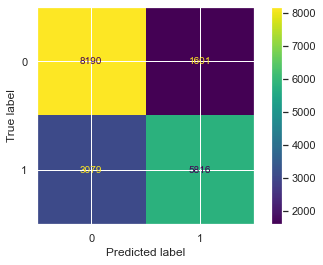

In [397]:
plot_result(rf2,'Random_Forest_Embedded')

### Feature Selection using Logistice Regression

In [398]:
df_ml_embedded_2 = pd.read_csv('Non_diabetic_data_for_ml.csv',index_col=0)
df_ml_embedded_2.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,max_glu_serum,A1Cresult,metformin,repaglinide,glipizide,pioglitazone,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Male,admission_type_id_Emergency,admission_type_id_Newborn,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,discharge_disposition_id_left AMA,admission_source_id_Extramural Birth,admission_source_id_Law Enforcement,admission_source_id_Normal Delivery,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Sick Baby,admission_source_id_Transfer,diag_1_Digestive,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Digestive,diag_2_Genitourinary,diag_2_Injury,diag_2_Musculoskeletal,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Musculoskeletal,diag_3_Neoplasms,diag_3_Respiratory,diag_3_other,change_No,diabetesMed_Yes,readmitted_Yes
6,1,4,70,1,21,0,0,0,7,6,0,0,0.5,0.0,0.0,0.0,0.0,0.5,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
8,1,13,68,2,28,0,0,0,8,8,0,0,0.0,0.0,0.5,0.0,0.0,0.5,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
9,1,12,33,3,18,0,0,0,8,9,0,0,0.0,0.0,0.0,0.0,0.5,0.5,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0
11,1,7,62,0,11,0,0,0,7,6,0,0,0.0,0.0,0.0,0.0,0.0,0.5,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1
13,1,10,55,1,31,0,0,0,8,8,0,0,0.0,0.0,0.0,0.0,0.0,0.5,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0


In [399]:
X = df_ml_embedded_2.drop(columns=['readmitted_Yes'])
y = df_ml_embedded_2['readmitted_Yes']

In [400]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,stratify=y, random_state=42)
sc =  StandardScaler()
X_train = pd.DataFrame(sc.fit_transform(X_train),columns=X_train.columns)
X_test = pd.DataFrame(sc.transform(X_test),columns=X_train.columns)
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((43599, 64), (18686, 64), (43599,), (18686,))

In [401]:
sel2=SelectFromModel(LogisticRegression(penalty='l1',C=0.025,solver='saga'))
sel2.fit(X_train,y_train)

SelectFromModel(estimator=LogisticRegression(C=0.025, penalty='l1',
                                             solver='saga'))

In [402]:
len(X_train.columns)

64

In [403]:
pd.DataFrame((sel2.get_support()),index=X_train.columns).sort_values(by=0)

,0
age,False
admission_source_id_Law Enforcement,False
diag_3_Respiratory,False
race_Other,False
diag_3_Musculoskeletal,False
diag_2_Musculoskeletal,False
admission_type_id_Emergency,False
diag_1_Digestive,False
A1Cresult,False
diag_1_Injury,True


In [404]:
selected_features_lasso_embedded = X_train.columns[(sel2.get_support())]

In [405]:
selected_features_lasso_embedded = list(selected_features_lasso_embedded)

In [406]:
selected_features_lasso_embedded

['patient_frequency',
 'time_in_hospital',
 'num_lab_procedures',
 'num_procedures',
 'num_medications',
 'number_outpatient',
 'number_emergency',
 'number_inpatient',
 'number_diagnoses',
 'max_glu_serum',
 'metformin',
 'repaglinide',
 'glipizide',
 'pioglitazone',
 'rosiglitazone',
 'insulin',
 'race_Asian',
 'race_Caucasian',
 'race_Hispanic',
 'gender_Male',
 'admission_type_id_Newborn',
 'admission_type_id_Other',
 'admission_type_id_Trauma Center',
 'admission_type_id_Urgent',
 'discharge_disposition_id_Hospice',
 'discharge_disposition_id_In/Still/Outpatient',
 'discharge_disposition_id_Other',
 'discharge_disposition_id_Transferred Within',
 'discharge_disposition_id_Transferred/Referred',
 'discharge_disposition_id_left AMA',
 'admission_source_id_Extramural Birth',
 'admission_source_id_Normal Delivery',
 'admission_source_id_Other',
 'admission_source_id_Referral',
 'admission_source_id_Sick Baby',
 'admission_source_id_Transfer',
 'diag_1_Genitourinary',
 'diag_1_Injury',

In [407]:
selected_features_lasso_embedded = selected_features_lasso_embedded + ['readmitted_Yes']

In [408]:
len(selected_features_lasso_embedded)

56

In [409]:
new_df=df_ml_embedded_2[selected_features_lasso_embedded]

In [410]:
new_df.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,max_glu_serum,metformin,repaglinide,glipizide,pioglitazone,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,gender_Male,admission_type_id_Newborn,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,discharge_disposition_id_left AMA,admission_source_id_Extramural Birth,admission_source_id_Normal Delivery,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Sick Baby,admission_source_id_Transfer,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Digestive,diag_2_Genitourinary,diag_2_Injury,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Neoplasms,diag_3_other,change_No,diabetesMed_Yes,readmitted_Yes
6,1,4,70,1,21,0,0,0,7,0,0.5,0.0,0.0,0.0,0.0,0.5,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
8,1,13,68,2,28,0,0,0,8,0,0.0,0.0,0.5,0.0,0.0,0.5,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
9,1,12,33,3,18,0,0,0,8,0,0.0,0.0,0.0,0.0,0.5,0.5,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
11,1,7,62,0,11,0,0,0,7,0,0.0,0.0,0.0,0.0,0.0,0.5,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,1
13,1,10,55,1,31,0,0,0,8,0,0.0,0.0,0.0,0.0,0.0,0.5,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0


In [411]:
X=new_df.drop(columns=['readmitted_Yes'])
y=new_df['readmitted_Yes']

In [412]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,stratify=y, random_state=42)
sc =  StandardScaler()
X_train = pd.DataFrame(sc.fit_transform(X_train),columns=X_train.columns)
X_test = pd.DataFrame(sc.transform(X_test),columns=X_train.columns)
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((43599, 55), (18686, 55), (43599,), (18686,))

In [413]:
log_reg_drop=LogisticRegression()

Average Balanced Accuracy (CV=5), Test Set: 0.7194656324952827
Average Balanced Accuracy (CV=5), Training Set:  0.7270700161959395
              precision    recall  f1-score   support

           0       0.70      0.84      0.76      9791
           1       0.77      0.60      0.68      8895

    accuracy                           0.73     18686
   macro avg       0.74      0.72      0.72     18686
weighted avg       0.73      0.73      0.72     18686



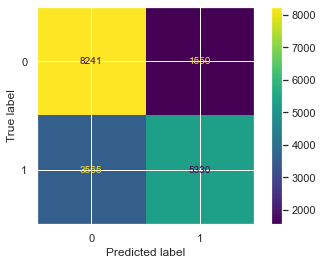

In [414]:
plot_result(log_reg_drop,'LassoLogistic')

## Gradient Boosting Using above X_train and Y_Train

In [416]:
gd1=GradientBoostingClassifier()

Average Balanced Accuracy (CV=5), Test Set: 0.7470879699378552
Average Balanced Accuracy (CV=5), Training Set:  0.7522425757604096
              precision    recall  f1-score   support

           0       0.72      0.85      0.78      9791
           1       0.80      0.64      0.71      8895

    accuracy                           0.75     18686
   macro avg       0.76      0.75      0.75     18686
weighted avg       0.76      0.75      0.75     18686



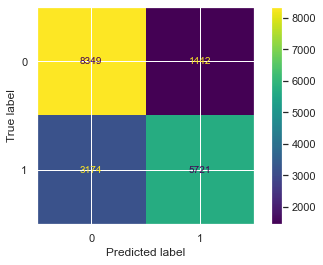

In [417]:
plot_result(gd1,'Embedded_Gradient_Boosting')

# MODEL BUILDING : ITERATION 3 (FEATURE SELECTION USING WRAPPER METHODS

<a id="rfe"></a>
# 5. Recursive Feature Elimination (RFE)

It is the process that returns the significant features in the dataset by recursively removing the less significant feature subsets.

In [418]:
df = pd.read_csv('Non_diabetic_data_for_ml.csv',index_col=0)
df.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,max_glu_serum,A1Cresult,metformin,repaglinide,glipizide,pioglitazone,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Male,admission_type_id_Emergency,admission_type_id_Newborn,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,discharge_disposition_id_left AMA,admission_source_id_Extramural Birth,admission_source_id_Law Enforcement,admission_source_id_Normal Delivery,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Sick Baby,admission_source_id_Transfer,diag_1_Digestive,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Digestive,diag_2_Genitourinary,diag_2_Injury,diag_2_Musculoskeletal,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Musculoskeletal,diag_3_Neoplasms,diag_3_Respiratory,diag_3_other,change_No,diabetesMed_Yes,readmitted_Yes
6,1,4,70,1,21,0,0,0,7,6,0,0,0.5,0.0,0.0,0.0,0.0,0.5,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
8,1,13,68,2,28,0,0,0,8,8,0,0,0.0,0.0,0.5,0.0,0.0,0.5,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
9,1,12,33,3,18,0,0,0,8,9,0,0,0.0,0.0,0.0,0.0,0.5,0.5,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0
11,1,7,62,0,11,0,0,0,7,6,0,0,0.0,0.0,0.0,0.0,0.0,0.5,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1
13,1,10,55,1,31,0,0,0,8,8,0,0,0.0,0.0,0.0,0.0,0.0,0.5,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0


In [419]:
X = df.drop(columns=['readmitted_Yes'])
y = df['readmitted_Yes']

In [420]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,stratify=y, random_state=42)
sc =  StandardScaler()
X_train = pd.DataFrame(sc.fit_transform(X_train),columns=X_train.columns)
X_test = pd.DataFrame(sc.transform(X_test),columns=X_train.columns)
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((43599, 64), (18686, 64), (43599,), (18686,))

In [421]:
X_train.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,max_glu_serum,A1Cresult,metformin,repaglinide,glipizide,pioglitazone,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Male,admission_type_id_Emergency,admission_type_id_Newborn,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,discharge_disposition_id_left AMA,admission_source_id_Extramural Birth,admission_source_id_Law Enforcement,admission_source_id_Normal Delivery,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Sick Baby,admission_source_id_Transfer,diag_1_Digestive,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Digestive,diag_2_Genitourinary,diag_2_Injury,diag_2_Musculoskeletal,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Musculoskeletal,diag_3_Neoplasms,diag_3_Respiratory,diag_3_other,change_No,diabetesMed_Yes
0,-0.539530,0.757809,1.268419,-0.816513,0.862370,-0.292874,-0.213761,-0.532905,0.674358,-0.287605,-0.151476,0.122225,-0.402793,-0.10843,-0.301132,-0.255216,3.691888,-0.289637,-0.080973,0.509487,-0.131219,-0.117926,-0.927547,-1.074340,-0.009579,-0.331252,-0.015146,2.097919,-0.101893,-0.016593,-0.208956,-0.027102,-0.563338,-0.072505,-0.006773,-0.009579,-0.006773,-0.275561,-0.641426,-0.004789,-0.264512,-0.336556,-0.247888,-0.297773,-0.210029,-0.197639,2.378946,-0.484978,-0.220128,-0.334229,-0.182278,-0.133551,5.494242,-0.394557,-0.607572,-0.224446,-0.308864,-0.162078,-0.143609,6.138884,-0.32963,-0.688538,0.889108,0.570967
1,9.636585,-0.222036,0.509955,-0.816513,0.378949,-0.292874,-0.213761,5.267958,0.674358,-0.287605,-0.151476,-0.339109,-0.402793,-0.10843,-0.301132,-0.255216,-0.237672,1.662425,-0.080973,0.509487,-0.131219,-0.117926,-0.927547,-1.074340,-0.009579,-0.331252,-0.015146,2.097919,-0.101893,-0.016593,-0.208956,-0.027102,-0.563338,-0.072505,-0.006773,-0.009579,-0.006773,-0.275561,1.559026,-0.004789,-0.264512,-0.336556,-0.247888,-0.297773,-0.210029,-0.197639,-0.420354,2.061947,4.542821,-0.334229,-0.182278,-0.133551,-0.182009,-0.394557,-0.607572,-0.224446,-0.308864,-0.162078,-0.143609,-0.162896,-0.32963,1.452353,-1.124723,0.570967
2,-0.539530,0.431194,1.015597,-0.248372,1.829214,-0.292874,-0.213761,-0.532905,-0.011403,-0.287605,8.106458,-0.339109,-0.402793,-0.10843,-0.301132,6.963183,-0.237672,-0.289637,-0.080973,0.509487,-0.131219,-0.117926,-0.927547,0.930804,-0.009579,-0.331252,-0.015146,-0.476663,-0.101893,-0.016593,-0.208956,-0.027102,-0.563338,-0.072505,-0.006773,-0.009579,-0.006773,-0.275561,-0.641426,-0.004789,-0.264512,-0.336556,-0.247888,-0.297773,-0.210029,-0.197639,2.378946,-0.484978,-0.220128,2.991962,-0.182278,-0.133551,-0.182009,-0.394557,-0.607572,-0.224446,3.237667,-0.162078,-0.143609,-0.162896,-0.32963,-0.688538,-1.124723,0.570967
3,0.059065,-1.201880,-0.450766,-0.816513,-0.225328,-0.292874,-0.213761,-0.532905,0.674358,-1.714792,-0.151476,-0.339109,-0.402793,-0.10843,2.245730,-0.255216,-0.237672,0.686394,-0.080973,0.509487,-0.131219,-0.117926,1.078113,0.930804,-0.009579,-0.331252,-0.015146,-0.476663,-0.101893,-0.016593,-0.208956,-0.027102,-0.563338,-0.072505,-0.006773,-0.009579,-0.006773,-0.275561,-0.641426,-0.004789,-0.264512,-0.336556,-0.247888,-0.297773,-0.210029,-0.197639,-0.420354,-0.484978,-0.220128,-0.334229,-0.182278,-0.133551,-0.182009,-0.394557,-0.607572,-0.224446,-0.308864,-0.162078,-0.143609,-0.162896,-0.32963,-0.688538,-1.124723,0.570967
4,-0.539530,-0.875265,-1.917130,-0.248372,-1.433883,-0.292874,-0.213761,-0.532905,-0.697164,-2.428386,-0.151476,-0.339109,-0.402793,-0.10843,-0.301132,3.353983,-0.237672,-0.289637,-0.

In [422]:
y_train.head()

43556    0
15442    1
96135    1
73348    1
44581    0
Name: readmitted_Yes, dtype: int64

In [423]:
y_train.unique()

array([0, 1], dtype=int64)

In [424]:
rfc_hybrid = RandomForestClassifier()

rfe_model = RFE(estimator=rfc_hybrid, n_features_to_select = None,verbose=2)


rfe_model = rfe_model.fit(X_train, y_train)


feat_index = pd.Series(data = rfe_model.ranking_, index = X_train.columns)


selected_features_rfe_hybrid = feat_index[feat_index==1].index


print(selected_features_rfe_hybrid)

Fitting estimator with 64 features.
Fitting estimator with 63 features.
Fitting estimator with 62 features.
Fitting estimator with 61 features.
Fitting estimator with 60 features.
Fitting estimator with 59 features.
Fitting estimator with 58 features.
Fitting estimator with 57 features.
Fitting estimator with 56 features.
Fitting estimator with 55 features.
Fitting estimator with 54 features.
Fitting estimator with 53 features.
Fitting estimator with 52 features.
Fitting estimator with 51 features.
Fitting estimator with 50 features.
Fitting estimator with 49 features.
Fitting estimator with 48 features.
Fitting estimator with 47 features.
Fitting estimator with 46 features.
Fitting estimator with 45 features.
Fitting estimator with 44 features.
Fitting estimator with 43 features.
Fitting estimator with 42 features.
Fitting estimator with 41 features.
Fitting estimator with 40 features.
Fitting estimator with 39 features.
Fitting estimator with 38 features.
Fitting estimator with 37 fe

In [425]:
selected_features_rfe_hybrid = list(selected_features_rfe_hybrid)

In [426]:
selected_features_rfe_hybrid = selected_features_rfe_hybrid + ['readmitted_Yes']

In [427]:
len(selected_features_rfe_hybrid)

33

# MODEL BUILDING : ITERATION 4 :HYPERPARAMETER TUNING

In [428]:
df = pd.read_csv('Non_diabetic_data_for_ml.csv',index_col=0)
df.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,max_glu_serum,A1Cresult,metformin,repaglinide,glipizide,pioglitazone,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Male,admission_type_id_Emergency,admission_type_id_Newborn,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,discharge_disposition_id_left AMA,admission_source_id_Extramural Birth,admission_source_id_Law Enforcement,admission_source_id_Normal Delivery,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Sick Baby,admission_source_id_Transfer,diag_1_Digestive,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Digestive,diag_2_Genitourinary,diag_2_Injury,diag_2_Musculoskeletal,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Musculoskeletal,diag_3_Neoplasms,diag_3_Respiratory,diag_3_other,change_No,diabetesMed_Yes,readmitted_Yes
6,1,4,70,1,21,0,0,0,7,6,0,0,0.5,0.0,0.0,0.0,0.0,0.5,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
8,1,13,68,2,28,0,0,0,8,8,0,0,0.0,0.0,0.5,0.0,0.0,0.5,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
9,1,12,33,3,18,0,0,0,8,9,0,0,0.0,0.0,0.0,0.0,0.5,0.5,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0
11,1,7,62,0,11,0,0,0,7,6,0,0,0.0,0.0,0.0,0.0,0.0,0.5,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1
13,1,10,55,1,31,0,0,0,8,8,0,0,0.0,0.0,0.0,0.0,0.0,0.5,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0


In [429]:
df_hybrid = df[selected_features_rfe_hybrid]

In [430]:
df_hybrid.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,A1Cresult,metformin,glipizide,pioglitazone,insulin,race_Caucasian,gender_Male,admission_type_id_Emergency,admission_type_id_Urgent,discharge_disposition_id_Transferred/Referred,admission_source_id_Referral,diag_1_Digestive,diag_1_Injury,diag_1_Respiratory,diag_1_other,diag_2_Genitourinary,diag_2_Respiratory,diag_2_other,diag_3_Genitourinary,diag_3_Respiratory,diag_3_other,change_No,readmitted_Yes
6,1,4,70,1,21,0,0,0,7,6,0,0.5,0.0,0.0,0.5,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
8,1,13,68,2,28,0,0,0,8,8,0,0.0,0.5,0.0,0.5,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
9,1,12,33,3,18,0,0,0,8,9,0,0.0,0.0,0.0,0.5,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
11,1,7,62,0,11,0,0,0,7,6,0,0.0,0.0,0.0,0.5,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1
13,1,10,55,1,31,0,0,0,8,8,0,0.0,0.0,0.0,0.5,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [431]:
df_hybrid.shape

(62285, 33)

In [432]:
X = df_hybrid.drop(columns=['readmitted_Yes'])
y = df_hybrid['readmitted_Yes']

In [433]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,stratify=y, random_state=42)
sc =  StandardScaler()
X_train = pd.DataFrame(sc.fit_transform(X_train),columns=X_train.columns)
X_test = pd.DataFrame(sc.transform(X_test),columns=X_train.columns)
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((43599, 32), (18686, 32), (43599,), (18686,))

In [434]:
criterion=["gini", "entropy"]    # learning_rate = [0.01,0.1,0.25,0.5]
max_depth = [2,4,6]        # max_depth = [2,3,4,5]
n_estimators = [150,100]     # n_estimators = [20,30,50,100,150]

In [435]:
param = {'criterion':criterion,'max_depth':max_depth,'n_estimators':n_estimators}

In [436]:
grid = GridSearchCV(estimator=RandomForestClassifier(),param_grid=param)

In [437]:
grid.fit(X_train,y_train)

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6], 'n_estimators': [150, 100]})

In [438]:
grid.best_params_

{'criterion': 'gini', 'max_depth': 6, 'n_estimators': 150}

Average Balanced Accuracy (CV=5), Test Set: 0.7320870287060502
Average Balanced Accuracy (CV=5), Training Set:  0.7382754545028817
              precision    recall  f1-score   support

           0       0.72      0.80      0.76      9791
           1       0.75      0.66      0.70      8895

    accuracy                           0.73     18686
   macro avg       0.74      0.73      0.73     18686
weighted avg       0.74      0.73      0.73     18686



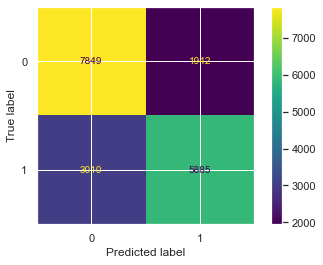

In [442]:
plot_result(RandomForestClassifier(criterion = 'gini', max_depth = 6, n_estimators = 150),'Random_Forest_Grid')

In [443]:
df = pd.read_csv('Non_diabetic_data_for_ml.csv',index_col=0)
df.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,max_glu_serum,A1Cresult,metformin,repaglinide,glipizide,pioglitazone,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Male,admission_type_id_Emergency,admission_type_id_Newborn,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,discharge_disposition_id_left AMA,admission_source_id_Extramural Birth,admission_source_id_Law Enforcement,admission_source_id_Normal Delivery,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Sick Baby,admission_source_id_Transfer,diag_1_Digestive,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Digestive,diag_2_Genitourinary,diag_2_Injury,diag_2_Musculoskeletal,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Musculoskeletal,diag_3_Neoplasms,diag_3_Respiratory,diag_3_other,change_No,diabetesMed_Yes,readmitted_Yes
6,1,4,70,1,21,0,0,0,7,6,0,0,0.5,0.0,0.0,0.0,0.0,0.5,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
8,1,13,68,2,28,0,0,0,8,8,0,0,0.0,0.0,0.5,0.0,0.0,0.5,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
9,1,12,33,3,18,0,0,0,8,9,0,0,0.0,0.0,0.0,0.0,0.5,0.5,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0
11,1,7,62,0,11,0,0,0,7,6,0,0,0.0,0.0,0.0,0.0,0.0,0.5,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1
13,1,10,55,1,31,0,0,0,8,8,0,0,0.0,0.0,0.0,0.0,0.0,0.5,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0


In [444]:
X = df.drop(columns=['readmitted_Yes'])
y = df['readmitted_Yes']

In [445]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,stratify=y, random_state=42)
sc =  StandardScaler()
X_train = pd.DataFrame(sc.fit_transform(X_train),columns=X_train.columns)
X_test = pd.DataFrame(sc.transform(X_test),columns=X_train.columns)
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((43599, 64), (18686, 64), (43599,), (18686,))

In [446]:
X_train.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,max_glu_serum,A1Cresult,metformin,repaglinide,glipizide,pioglitazone,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Male,admission_type_id_Emergency,admission_type_id_Newborn,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,discharge_disposition_id_left AMA,admission_source_id_Extramural Birth,admission_source_id_Law Enforcement,admission_source_id_Normal Delivery,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Sick Baby,admission_source_id_Transfer,diag_1_Digestive,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Digestive,diag_2_Genitourinary,diag_2_Injury,diag_2_Musculoskeletal,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Musculoskeletal,diag_3_Neoplasms,diag_3_Respiratory,diag_3_other,change_No,diabetesMed_Yes
0,-0.539530,0.757809,1.268419,-0.816513,0.862370,-0.292874,-0.213761,-0.532905,0.674358,-0.287605,-0.151476,0.122225,-0.402793,-0.10843,-0.301132,-0.255216,3.691888,-0.289637,-0.080973,0.509487,-0.131219,-0.117926,-0.927547,-1.074340,-0.009579,-0.331252,-0.015146,2.097919,-0.101893,-0.016593,-0.208956,-0.027102,-0.563338,-0.072505,-0.006773,-0.009579,-0.006773,-0.275561,-0.641426,-0.004789,-0.264512,-0.336556,-0.247888,-0.297773,-0.210029,-0.197639,2.378946,-0.484978,-0.220128,-0.334229,-0.182278,-0.133551,5.494242,-0.394557,-0.607572,-0.224446,-0.308864,-0.162078,-0.143609,6.138884,-0.32963,-0.688538,0.889108,0.570967
1,9.636585,-0.222036,0.509955,-0.816513,0.378949,-0.292874,-0.213761,5.267958,0.674358,-0.287605,-0.151476,-0.339109,-0.402793,-0.10843,-0.301132,-0.255216,-0.237672,1.662425,-0.080973,0.509487,-0.131219,-0.117926,-0.927547,-1.074340,-0.009579,-0.331252,-0.015146,2.097919,-0.101893,-0.016593,-0.208956,-0.027102,-0.563338,-0.072505,-0.006773,-0.009579,-0.006773,-0.275561,1.559026,-0.004789,-0.264512,-0.336556,-0.247888,-0.297773,-0.210029,-0.197639,-0.420354,2.061947,4.542821,-0.334229,-0.182278,-0.133551,-0.182009,-0.394557,-0.607572,-0.224446,-0.308864,-0.162078,-0.143609,-0.162896,-0.32963,1.452353,-1.124723,0.570967
2,-0.539530,0.431194,1.015597,-0.248372,1.829214,-0.292874,-0.213761,-0.532905,-0.011403,-0.287605,8.106458,-0.339109,-0.402793,-0.10843,-0.301132,6.963183,-0.237672,-0.289637,-0.080973,0.509487,-0.131219,-0.117926,-0.927547,0.930804,-0.009579,-0.331252,-0.015146,-0.476663,-0.101893,-0.016593,-0.208956,-0.027102,-0.563338,-0.072505,-0.006773,-0.009579,-0.006773,-0.275561,-0.641426,-0.004789,-0.264512,-0.336556,-0.247888,-0.297773,-0.210029,-0.197639,2.378946,-0.484978,-0.220128,2.991962,-0.182278,-0.133551,-0.182009,-0.394557,-0.607572,-0.224446,3.237667,-0.162078,-0.143609,-0.162896,-0.32963,-0.688538,-1.124723,0.570967
3,0.059065,-1.201880,-0.450766,-0.816513,-0.225328,-0.292874,-0.213761,-0.532905,0.674358,-1.714792,-0.151476,-0.339109,-0.402793,-0.10843,2.245730,-0.255216,-0.237672,0.686394,-0.080973,0.509487,-0.131219,-0.117926,1.078113,0.930804,-0.009579,-0.331252,-0.015146,-0.476663,-0.101893,-0.016593,-0.208956,-0.027102,-0.563338,-0.072505,-0.006773,-0.009579,-0.006773,-0.275561,-0.641426,-0.004789,-0.264512,-0.336556,-0.247888,-0.297773,-0.210029,-0.197639,-0.420354,-0.484978,-0.220128,-0.334229,-0.182278,-0.133551,-0.182009,-0.394557,-0.607572,-0.224446,-0.308864,-0.162078,-0.143609,-0.162896,-0.32963,-0.688538,-1.124723,0.570967
4,-0.539530,-0.875265,-1.917130,-0.248372,-1.433883,-0.292874,-0.213761,-0.532905,-0.697164,-2.428386,-0.151476,-0.339109,-0.402793,-0.10843,-0.301132,3.353983,-0.237672,-0.289637,-0.

In [447]:
y_train.head()

43556    0
15442    1
96135    1
73348    1
44581    0
Name: readmitted_Yes, dtype: int64

In [448]:
y_train.unique()

array([0, 1], dtype=int64)

In [449]:
gbc_hybrid = GradientBoostingClassifier()

gbc_model = RFE(estimator=gbc_hybrid, n_features_to_select = None,verbose=2)


gbc_model = gbc_model.fit(X_train, y_train)


feat_index = pd.Series(data = gbc_model.ranking_, index = X_train.columns)


selected_features_gbc_hybrid = feat_index[feat_index==1].index


print(selected_features_gbc_hybrid)

Fitting estimator with 64 features.
Fitting estimator with 63 features.
Fitting estimator with 62 features.
Fitting estimator with 61 features.
Fitting estimator with 60 features.
Fitting estimator with 59 features.
Fitting estimator with 58 features.
Fitting estimator with 57 features.
Fitting estimator with 56 features.
Fitting estimator with 55 features.
Fitting estimator with 54 features.
Fitting estimator with 53 features.
Fitting estimator with 52 features.
Fitting estimator with 51 features.
Fitting estimator with 50 features.
Fitting estimator with 49 features.
Fitting estimator with 48 features.
Fitting estimator with 47 features.
Fitting estimator with 46 features.
Fitting estimator with 45 features.
Fitting estimator with 44 features.
Fitting estimator with 43 features.
Fitting estimator with 42 features.
Fitting estimator with 41 features.
Fitting estimator with 40 features.
Fitting estimator with 39 features.
Fitting estimator with 38 features.
Fitting estimator with 37 fe

In [450]:
selected_features_gbc_hybrid = list(selected_features_gbc_hybrid)

In [451]:
selected_features_gbc_hybrid = selected_features_gbc_hybrid + ['readmitted_Yes']

In [452]:
len(selected_features_gbc_hybrid)

33

# MODEL BUILDING : ITERATION 4 :HYPERPARAMETER TUNING

In [453]:
df = pd.read_csv('Non_diabetic_data_for_ml.csv',index_col=0)
df.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,max_glu_serum,A1Cresult,metformin,repaglinide,glipizide,pioglitazone,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Male,admission_type_id_Emergency,admission_type_id_Newborn,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,discharge_disposition_id_left AMA,admission_source_id_Extramural Birth,admission_source_id_Law Enforcement,admission_source_id_Normal Delivery,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Sick Baby,admission_source_id_Transfer,diag_1_Digestive,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Digestive,diag_2_Genitourinary,diag_2_Injury,diag_2_Musculoskeletal,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Musculoskeletal,diag_3_Neoplasms,diag_3_Respiratory,diag_3_other,change_No,diabetesMed_Yes,readmitted_Yes
6,1,4,70,1,21,0,0,0,7,6,0,0,0.5,0.0,0.0,0.0,0.0,0.5,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
8,1,13,68,2,28,0,0,0,8,8,0,0,0.0,0.0,0.5,0.0,0.0,0.5,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
9,1,12,33,3,18,0,0,0,8,9,0,0,0.0,0.0,0.0,0.0,0.5,0.5,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0
11,1,7,62,0,11,0,0,0,7,6,0,0,0.0,0.0,0.0,0.0,0.0,0.5,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1
13,1,10,55,1,31,0,0,0,8,8,0,0,0.0,0.0,0.0,0.0,0.0,0.5,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0


In [454]:
df_hybrid = df[selected_features_gbc_hybrid]

In [455]:
df_hybrid.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,max_glu_serum,A1Cresult,metformin,glipizide,pioglitazone,insulin,race_Caucasian,admission_type_id_Other,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_Other,discharge_disposition_id_Transferred/Referred,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Transfer,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_2_Digestive,diag_3_Injury,diabetesMed_Yes,readmitted_Yes
6,1,4,70,1,21,0,0,0,7,6,0,0,0.5,0.0,0.0,0.5,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
8,1,13,68,2,28,0,0,0,8,8,0,0,0.0,0.5,0.0,0.5,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0
9,1,12,33,3,18,0,0,0,8,9,0,0,0.0,0.0,0.0,0.5,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0
11,1,7,62,0,11,0,0,0,7,6,0,0,0.0,0.0,0.0,0.5,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,1
13,1,10,55,1,31,0,0,0,8,8,0,0,0.0,0.0,0.0,0.5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [456]:
df_hybrid.shape

(62285, 33)

In [457]:
X = df_hybrid.drop(columns=['readmitted_Yes'])
y = df_hybrid['readmitted_Yes']

In [458]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,stratify=y, random_state=42)
sc =  StandardScaler()
X_train = pd.DataFrame(sc.fit_transform(X_train),columns=X_train.columns)
X_test = pd.DataFrame(sc.transform(X_test),columns=X_train.columns)
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((43599, 32), (18686, 32), (43599,), (18686,))

In [459]:
learning_rate = [0.05,0.1]
max_depth = [7,6]        
n_estimators = [150,100]     

In [460]:
param = {'learning_rate':learning_rate,'max_depth':max_depth,'n_estimators':n_estimators}

In [461]:
grid = GridSearchCV(estimator=GradientBoostingClassifier(),param_grid=param)

In [462]:
grid.fit(X_train,y_train)

GridSearchCV(estimator=GradientBoostingClassifier(),
             param_grid={'learning_rate': [0.05, 0.1], 'max_depth': [7, 6],
                         'n_estimators': [150, 100]})

In [463]:
grid.best_params_

{'learning_rate': 0.05, 'max_depth': 6, 'n_estimators': 150}

Average Balanced Accuracy (CV=5), Test Set: 0.7471427705285565
Average Balanced Accuracy (CV=5), Training Set:  0.7523126261993094
              precision    recall  f1-score   support

           0       0.72      0.87      0.79      9791
           1       0.81      0.64      0.71      8895

    accuracy                           0.76     18686
   macro avg       0.77      0.75      0.75     18686
weighted avg       0.76      0.76      0.75     18686



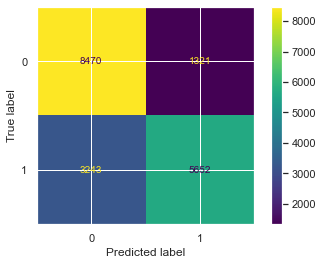

In [464]:
plot_result(GradientBoostingClassifier(learning_rate = 0.05, max_depth = 6, n_estimators = 150),'GradientBoost_Grid')

In [465]:
d = {}
for key in cv_acc_test:
    l = [cv_acc[key],cv_acc_test[key],cv_acc_train[key],cv_FPR[key],cv_TPR[key]]
    d.update({key:l})

In [466]:
model_performance_df = pd.DataFrame(d,index=['Accuracy','Balanced_Test_Accuracy','Balanced_Train_Accuracy','False_Positive_Rate','True_Positive_Rate']).T

In [467]:
model_performance_df

,Accuracy,Balanced_Test_Accuracy,Balanced_Train_Accuracy,False_Positive_Rate,True_Positive_Rate
LogisticRegression_base,0.725918,71.74,72.67,15.737223,59.746391
DecisionTreeClassifier_base,0.653802,65.69,65.54,33.484496,64.130581
RandomForestClassifier_base,0.751927,74.39,74.78,16.301017,65.830298
AdaBoostClassifier_base,0.733368,72.86,73.64,18.249786,64.076622
GradientBoostingClassifier_base,0.754367,74.82,75.13,13.984557,63.793336
Random_Forest_Embedded,0.749545,74.45,74.77,16.351752,65.385048
LassoLogistic,0.726266,71.95,72.71,15.830865,59.921304
Embedded_Gradient_Boosting,0.752970,74.71,75.22,14.727811,64.317032
Random_Forest_Grid,0.734989,73.21,73.83,19.834542,66.160764
GradientBoost_Grid,0.755753,74.71,75.23,13.491982,63.541315
